In [1]:
# Dependencies
import tensorflow

#from tensorflow.math import reduce_prod
#from tensorflow.python.ops.math_ops import reduce_prod

import numpy as np

from sklearn.linear_model import LinearRegression 
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor 
from sklearn.neighbors import KNeighborsRegressor 
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor 
from sklearn.ensemble import GradientBoostingRegressor 
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neural_network import MLPRegressor

from sklearn.model_selection import train_test_split 
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score 
from sklearn.model_selection import GridSearchCV 
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_regression

from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense 
from tensorflow.keras.optimizers import SGD 
from tensorflow.keras.layers import LSTM
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

In [2]:
from statsmodels.tsa.arima_model import ARIMA 
import statsmodels.api as sm

In [3]:
# pandas, pandas_datareader, numpy and matplotlib
import numpy as np
import pandas as pd
#import pandas_datareader.data as web 
from matplotlib import pyplot

In [4]:
from pandas.plotting import scatter_matrix
import seaborn as sns
from sklearn.preprocessing import StandardScaler 
from pandas.plotting import scatter_matrix
from statsmodels.graphics.tsaplots import plot_acf

In [5]:
# stk_tickers = ['MSFT', 'IBM', 'GOOGL']
stk_tickers = ['ABBV', 'AMGN', 'AZN', 'BIIB', 'BMY', 'CRXT', 'GILD', 'GRFS','GSK', 'HCM', 'HZNP', 'JNJ', 'LLY', 'MRK','NVO','NVS', 'OGN','PFE','SNY','TSVT']
ccy_tickers = ['DEXJPUS', 'DEXUSUK']
idx_tickers = ['SP500', 'DJIA', 'VIXCLS']

In [7]:
!pip install pandas-datareader

  Using cached pandas_datareader-0.10.0-py3-none-any.whl (109 kB)


In [8]:
import pandas_datareader.data as web

In [9]:
stk_data = web.DataReader(stk_tickers, 'yahoo')
ccy_data = web.DataReader(ccy_tickers, 'fred')
idx_data = web.DataReader(idx_tickers, 'fred')

In [10]:
return_period = 5 #Rendimiento Semanal

In [11]:
stk_data

Attributes   Adj Close                                                      \
Symbols           ABBV        AMGN        AZN        BIIB        BMY  CRXT   
Date                                                                         
2016-11-21   48.015430  125.996880  22.936951  318.320007  48.890301   NaN   
2016-11-22   46.831337  124.940819  22.173506  318.109985  48.735172   NaN   
2016-11-23   47.824711  125.546730  22.123169  305.929993  48.907543   NaN   
2016-11-25   48.086945  125.893021  22.735603  305.200012  49.105755   NaN   
2016-11-28   47.252525  125.581398  22.425190  303.779999  48.700703   NaN   
...                ...         ...        ...         ...        ...   ...   
2021-11-15  116.839996  207.399994  59.779999  271.820007  59.619999  4.46   
2021-11-16  116.419998  205.389999  57.630001  261.549988  59.099998  4.84   
2021-11-17  117.349998  205.820007  57.730000  258.380005  59.439999  4.94   
2021-11-18  117.070000  204.020004  56.709999  256.790009  59.040001  4.67   
2021-11-19  116.239998  206.080002  56.660000  257.190002  57.830002  4.39   

Attributes                                              ...     Volume  \
Symbols          GILD       GRFS        GSK        HCM  ...       HZNP   
Date                                                    ...              
2016-11-21  62.902458  13.808290  29.572191  12.490000  ...  1688900.0   
2016-11-22  62.466221  13.835172  29.272083  12.550000  ...  1757100.0   
2016-11-23  63.170933  13.835172  29.318254  12.570000  ...  1719500.0   
2016-11-25  63.288368  13.906858  29.903080  12.570000  ...   630600.0   
2016-11-28  62.533340  14.014385  29.464464  13.000000  ...  2260700.0   
...               ...        ...        ...        ...  ...        ...   
2021-11-15  67.199997  11.830000  42.639378  31.129999  ...  1566400.0   
2021-11-16  66.889999  12.110000  41.928230  31.590000  ...  1638700.0   
2021-11-17  67.459999  12.550000  42.027000  31.190001  ...  1080500.0   
2021-11-18  67.790001  12.060000  41.500000  30.110001  ...   949300.0   
2021-11-19  68.690002  11.880000  41.590000  30.719999  ...  1496300.0   

Attributes                                                            \
Symbols            JNJ         LLY         MRK        NVO        NVS   
Date                                                                   
2016-11-21   5843300.0   4060300.0   7164862.0  3988600.0  3130938.0   
2016-11-22  11649700.0   5208800.0  10052626.0  5457300.0  6064456.0   
2016-11-23   7892600.0  53877200.0   9588152.0  7698800.0  5416060.0   
2016-11-25   3433300.0   8620700.0   3669362.0  1964100.0  1975878.0   
2016-11-28   9065700.0  12507700.0   7806971.0  3515000.0  2530195.0   
...                ...         ...         ...        ...        ...   
2021-11-15   7496200.0   1903200.0   7108200.0   559000.0  2034200.0   
2021-11-16   7594700.0   2565700.0  10565200.0   571800.0  1896400.0   
2021-11-17   5414500.0   2873600.0  10286300.0   559100.0  1846300.0   
2021-11-18   6358700.0   1689200.0   9833600.0   886600.0  1590700.0   
2021-11-19   7620700.0   2786800.0  17581100.0   724900.0  2160100.0   

Attributes                                              
Symbols           OGN         PFE        SNY      TSVT  
Date                                                    
2016-11-21        NaN  23053931.0  1171500.0       NaN  
2016-11-22        NaN  27862279.0  2904600.0       NaN  
2016-11-23        NaN  22399924.0  2412100.0       NaN  
2016-11-25        NaN  11017357.0   710700.0       NaN  
2016-11-28        NaN  18692901.0  1184400.0       NaN  
...               ...         ...        ...       ...  
2021-11-15  2553500.0  27763200.0  1256500.0  429800.0  
2021-11-16  2385400.0  31297200.0   788400.0  434000.0  
2021-11-17  2008700.0  36889800.0  1017800.0  360800.0  
2021-11-18  2625800.0  32872600.0  1945200.0  547700.0  
2021-11-19  2631300.0  47936400.0  2197500.0  345500.0  

[1259 rows x 120 columns]

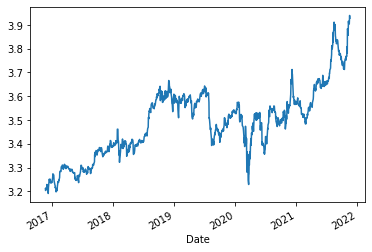

In [12]:
np.log(stk_data.loc[:, ('Adj Close', 'PFE')]).plot()

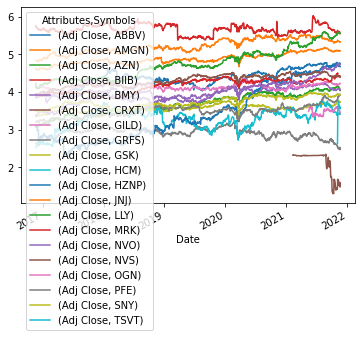

In [13]:
np.log(stk_data.loc[:, ('Adj Close', stk_tickers)]).plot()

In [15]:
#%matplotlib 

C:\Users\payo_\.conda\envs\mlenvi\lib\site-packages\ipykernel_launcher.py:17: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


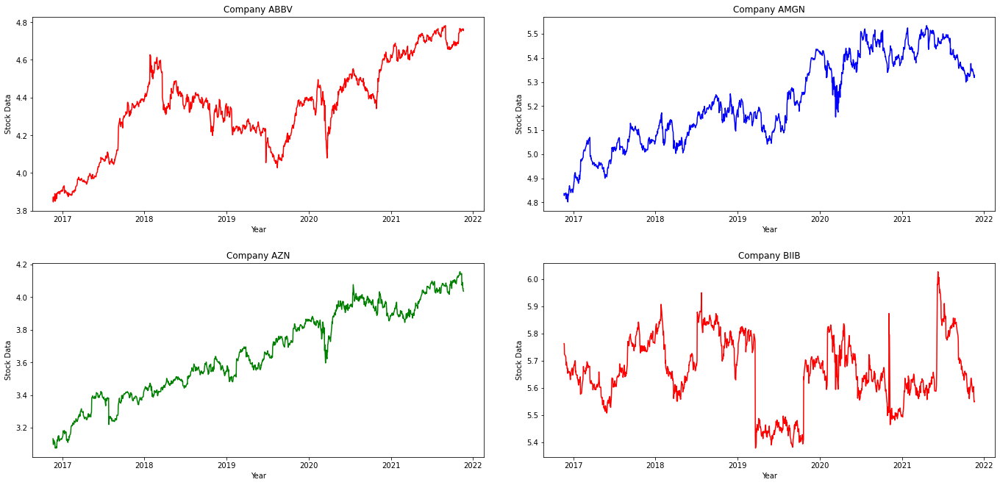

In [14]:
import matplotlib.pyplot as plt
# Tickers change
def test(to_plot,ax, r_count, c_count, c,s):
    #fig,ax = plt.subplots(1,2)
    #plt.subplot(1,2,2)
    #plt.plot(month, customer1, color="red", label="Customer 1", marker="o")
    ax[r_count,c_count].plot(p.index, p.values, color=c)
    ax[r_count,c_count].set_xlabel("Year")
    # ax[r_count,c_count].xticks(rotation=90)
    ax[r_count,c_count].set_ylabel("Stock Data")
    ax[r_count,c_count].set_title(f"Company {s}")
    #plt.show()

rows= 2
cols= 2    
fig,ax = plt.subplots(rows,cols, constrained_layout=True, figsize=(20,10))
fig.tight_layout(pad=5)
#fig.autofmt_xdate(rotation=90)
colors= ["red", "blue", "green"]
r_count=0
c_count=0

for i, s in enumerate(stk_tickers[:4]):
    p= np.log(stk_data.loc[:, ('Adj Close', s)])
    test(p, ax, r_count, c_count, colors[i%len(colors)], s)
    if c_count >= cols-1:
        c_count=0
        r_count+=1
    else:
        c_count+=1
#     print(i,s,p)
#     print(p.values)

#plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

C:\Users\payo_\.conda\envs\mlenvi\lib\site-packages\ipykernel_launcher.py:17: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


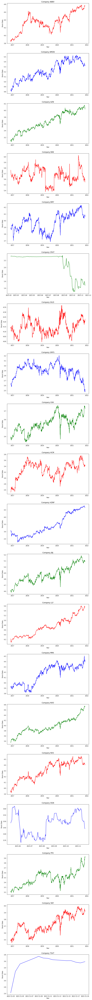

In [15]:
import matplotlib.pyplot as plt
# Tickers change
def test(to_plot,ax, i, c,s):
    #fig,ax = plt.subplots(1,2)
    #plt.subplot(1,2,2)
    #plt.plot(month, customer1, color="red", label="Customer 1", marker="o")
    ax[i].plot(p.index, p.values, color=c)
    ax[i].set_xlabel("Year")
    # ax[r_count,c_count].xticks(rotation=90)
    ax[i].set_ylabel("Stock Data")
    ax[i].set_title(f"Company {s}")
    #plt.show()

# rows= 2
# cols= 2    
fig,ax = plt.subplots(len(stk_tickers), 1, constrained_layout=True, figsize=(10,100))
fig.tight_layout(pad=5)
#fig.autofmt_xdate(rotation=90)
colors= ["red", "blue", "green"]
# r_count=0
# c_count=0

for i, s in enumerate(stk_tickers):
    p= np.log(stk_data.loc[:, ('Adj Close', s)])
    test(p, ax, i, colors[i%len(colors)], s)
#     if c_count >= cols-1:
#         c_count=0
#         r_count+=1
#     else:
#         c_count+=1
#     print(i,s,p)
#     print(p.values)

#plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.show()

In [16]:
np.log(stk_data.loc[:, ('Adj Close', 'PFE')]).diff(5).shift(-5)
# Generate variable Y: is the weekly performance in t+1
#Shift -5: Gives the data plus 5 periods. The base for lower to higher times
# To make it supervised, shify -5 gives the data t+5 in t

Date
2016-11-21    0.011025
2016-11-22    0.025525
2016-11-23    0.001272
2016-11-25   -0.001895
2016-11-28    0.001584
                ...   
2021-11-15         NaN
2021-11-16         NaN
2021-11-17         NaN
2021-11-18         NaN
2021-11-19         NaN
Name: (Adj Close, PFE), Length: 1259, dtype: float64

In [17]:
# This is for every ticker period

for i in stk_data:
     print(np.log(stk_data.loc[:, ('Adj Close', i)]).diff(5).shift(-5))

Attributes Adj Close
Symbols         ABBV
Date                
2016-11-21  0.019179
2016-11-22  0.031239
2016-11-23 -0.017095
2016-11-25 -0.018009
2016-11-28  0.023272
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1259 rows x 1 columns]
Attributes Adj Close
Symbols         AMGN
Date                
2016-11-21  0.003087
2016-11-22 -0.001804
2016-11-23 -0.018371
2016-11-25 -0.009812
2016-11-28  0.001515
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1259 rows x 1 columns]
Attributes Adj Close
Symbols          AZN
Date                
2016-11-21 -0.023313
2016-11-22 -0.011033
2016-11-23 -0.021465
2016-11-25 -0.045677
2016-11-28 -0.034637
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1259 rows x 1 columns]
Attributes Adj Close
Symbols         BIIB
D

Attributes Adj Close
Symbols          LLY
Date                
2016-11-21 -0.132190
2016-11-22 -0.124119
2016-11-23 -0.030308
2016-11-25 -0.020610
2016-11-28  0.000893
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1259 rows x 1 columns]
Attributes Adj Close
Symbols          MRK
Date                
2016-11-21 -0.001767
2016-11-22 -0.008300
2016-11-23 -0.014379
2016-11-25 -0.017513
2016-11-28 -0.025401
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1259 rows x 1 columns]
Attributes Adj Close
Symbols          NVO
Date                
2016-11-21  0.014468
2016-11-22  0.055689
2016-11-23  0.060830
2016-11-25  0.056067
2016-11-28  0.056167
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1259 rows x 1 columns]
Attributes Adj Close
Symbols          NVS
D

Attributes Adj Close
Symbols         TSVT
Date                
2016-11-21       NaN
2016-11-22       NaN
2016-11-23       NaN
2016-11-25       NaN
2016-11-28       NaN
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1259 rows x 1 columns]
Attributes Adj Close
Symbols         ABBV
Date                
2016-11-21  0.019179
2016-11-22  0.031239
2016-11-23 -0.017095
2016-11-25 -0.018009
2016-11-28  0.023272
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1259 rows x 1 columns]
Attributes Adj Close
Symbols         AMGN
Date                
2016-11-21  0.003087
2016-11-22 -0.001804
2016-11-23 -0.018371
2016-11-25 -0.009812
2016-11-28  0.001515
...              ...
2021-11-15       NaN
2021-11-16       NaN
2021-11-17       NaN
2021-11-18       NaN
2021-11-19       NaN

[1259 rows x 1 columns]
Attributes Adj Close
Symbols          AZN
D

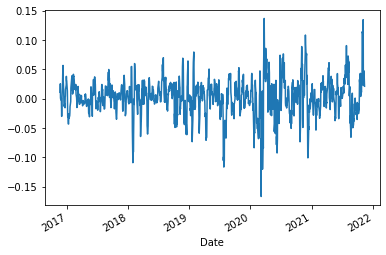

In [18]:
np.log(stk_data.loc[:, ('Adj Close', 'PFE')]).diff(5).shift(-5).plot()

C:\Users\payo_\.conda\envs\mlenvi\lib\site-packages\ipykernel_launcher.py:11: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  # This is added back by InteractiveShellApp.init_path()


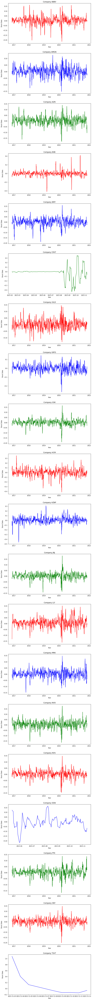

In [19]:
import matplotlib.pyplot as plt
# Tickers change
def test2(to_plot,ax, i, c,s):
    ax[i].plot(p.index, p.values, color=c)
    ax[i].set_xlabel("Year")
    ax[i].set_ylabel("Stock Data")
    ax[i].set_title(f"Company {s}")
    

fig,ax = plt.subplots(len(stk_tickers), 1, constrained_layout=True, figsize=(10,100))
fig.tight_layout(pad=5)
colors= ["red", "blue", "green"]

for i, s in enumerate(stk_tickers):
    p= np.log(stk_data.loc[:, ('Adj Close', s)]).diff(5).shift(-5)
    test2(p, ax, i, colors[i%len(colors)], s)
plt.show()

In [20]:
# All stocks stk_tickers
Y = np.log(stk_data.loc[:, ('Adj Close', stk_tickers)]).diff(return_period).shift(-return_period)

In [21]:
Y

Attributes Adj Close                                                         \
Symbols         ABBV      AMGN       AZN      BIIB       BMY CRXT      GILD   
Date                                                                          
2016-11-21  0.019179  0.003087 -0.023313 -0.050084 -0.006543  NaN -0.001468   
2016-11-22  0.031239 -0.001804 -0.011033 -0.078579 -0.001947  NaN -0.010259   
2016-11-23 -0.017095 -0.018371 -0.021465 -0.033740 -0.016882  NaN -0.033215   
2016-11-25 -0.018009 -0.009812 -0.045677 -0.026596 -0.018063  NaN -0.040855   
2016-11-28  0.023272  0.001515 -0.034637 -0.045664 -0.017134  NaN -0.029682   
...              ...       ...       ...       ...       ...  ...       ...   
2021-11-15       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-16       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-17       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-18       NaN       NaN       NaN       NaN       NaN  NaN       NaN   
2021-11-19       NaN       NaN       NaN       NaN       NaN  NaN       NaN   

Attributes                                                              \
Symbols         GRFS       GSK       HCM      HZNP       JNJ       LLY   
Date                                                                     
2016-11-21  0.021189 -0.004172  0.040021 -0.018824 -0.022157 -0.132190   
2016-11-22  0.012231 -0.006594  0.097842 -0.068319 -0.012855 -0.124119   
2016-11-23 -0.001945 -0.017742  0.080226 -0.110494 -0.015059 -0.030308   
2016-11-25 -0.024129 -0.030305  0.133134 -0.076868 -0.019196 -0.020610   
2016-11-28 -0.045901 -0.016325  0.134396 -0.073963 -0.010575  0.000893   
...              ...       ...       ...       ...       ...       ...   
2021-11-15       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-16       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-17       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-18       NaN       NaN       NaN       NaN       NaN       NaN   
2021-11-19       NaN       NaN       NaN       NaN       NaN       NaN   

Attributes                                                             
Symbols          MRK       NVO       NVS OGN       PFE       SNY TSVT  
Date                                                                   
2016-11-21 -0.001767  0.014468 -0.016824 NaN  0.011025  0.006948  NaN  
2016-11-22 -0.008300  0.055689  0.009792 NaN  0.025525  0.008494  NaN  
2016-11-23 -0.014379  0.060830 -0.015525 NaN  0.001272  0.007074  NaN  
2016-11-25 -0.017513  0.056067 -0.020473 NaN -0.001895  0.004508  NaN  
2016-11-28 -0.025401  0.056167 -0.001594 NaN  0.001584  0.029268  NaN  
...              ...       ...       ...  ..       ...       ...  ...  
2021-11-15       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-16       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-17       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-18       NaN       NaN       NaN NaN       NaN       NaN  NaN  
2021-11-19       NaN       NaN       NaN NaN       NaN       NaN  NaN  

[1259 rows x 20 columns]

In [22]:
# Y.columns = Y.columns[-1]+'_pred'
#X = X.set_axis(X_colnames, axis=1, inplace=False)
list_names=[]
for i in range(0,len(Y.columns)):
    list_names.append(stk_tickers[i]+'_pred')
list_names

['ABBV_pred',
 'AMGN_pred',
 'AZN_pred',
 'BIIB_pred',
 'BMY_pred',
 'CRXT_pred',
 'GILD_pred',
 'GRFS_pred',
 'GSK_pred',
 'HCM_pred',
 'HZNP_pred',
 'JNJ_pred',
 'LLY_pred',
 'MRK_pred',
 'NVO_pred',
 'NVS_pred',
 'OGN_pred',
 'PFE_pred',
 'SNY_pred',
 'TSVT_pred']

In [23]:
Y = Y.set_axis(list_names, axis=1, inplace=False)
Y

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,HZNP_pred,JNJ_pred,LLY_pred,MRK_pred,NVO_pred,NVS_pred,OGN_pred,PFE_pred,SNY_pred,TSVT_pred
Date,,,,,,,,,,,,,,,,,,,,
2016-11-21,0.019179,0.003087,-0.023313,-0.050084,-0.006543,NaN,-0.001468,0.021189,-0.004172,0.040021,-0.018824,-0.022157,-0.132190,-0.001767,0.014468,-0.016824,NaN,0.011025,0.006948,NaN
2016-11-22,0.031239,-0.001804,-0.011033,-0.078579,-0.001947,NaN,-0.010259,0.012231,-0.006594,0.097842,-0.068319,-0.012855,-0.124119,-0.008300,0.055689,0.009792,NaN,0.025525,0.008494,NaN
2016-11-23,-0.017095,-0.018371,-0.021465,-0.033740,-0.016882,NaN,-0.033215,-0.001945,-0.017742,0.080226,-0.110494,-0.015059,-0.030308,-0.014379,0.060830,-0.015525,NaN,0.001272,0.007074,NaN
2016-11-25,-0.018009,-0.009812,-0.045677,-0.026596,-0.018063,NaN,-0.040855,-0.024129,-0.030305,0.133134,-0.076868,-0.019196,-0.020610,-0.017513,0.056067,-0.020473,NaN,-0.001895,0.004508,NaN
2016-11-28,0.023272,0.001515,-0.034637,-0.045664,-0.017134,NaN,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000893,-0.025401,0.056167,-0.001594,NaN,0.001584,0.029268,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
Y

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,HZNP_pred,JNJ_pred,LLY_pred,MRK_pred,NVO_pred,NVS_pred,OGN_pred,PFE_pred,SNY_pred,TSVT_pred
Date,,,,,,,,,,,,,,,,,,,,
2016-11-21,0.019179,0.003087,-0.023313,-0.050084,-0.006543,NaN,-0.001468,0.021189,-0.004172,0.040021,-0.018824,-0.022157,-0.132190,-0.001767,0.014468,-0.016824,NaN,0.011025,0.006948,NaN
2016-11-22,0.031239,-0.001804,-0.011033,-0.078579,-0.001947,NaN,-0.010259,0.012231,-0.006594,0.097842,-0.068319,-0.012855,-0.124119,-0.008300,0.055689,0.009792,NaN,0.025525,0.008494,NaN
2016-11-23,-0.017095,-0.018371,-0.021465,-0.033740,-0.016882,NaN,-0.033215,-0.001945,-0.017742,0.080226,-0.110494,-0.015059,-0.030308,-0.014379,0.060830,-0.015525,NaN,0.001272,0.007074,NaN
2016-11-25,-0.018009,-0.009812,-0.045677,-0.026596,-0.018063,NaN,-0.040855,-0.024129,-0.030305,0.133134,-0.076868,-0.019196,-0.020610,-0.017513,0.056067,-0.020473,NaN,-0.001895,0.004508,NaN
2016-11-28,0.023272,0.001515,-0.034637,-0.045664,-0.017134,NaN,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000893,-0.025401,0.056167,-0.001594,NaN,0.001584,0.029268,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-11-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
X1 = np.log(stk_data.loc[:, ('Adj Close', stk_tickers)]).diff(return_period)
X1.columns = X1.columns.droplevel()

In [26]:
X1

Symbols,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,HZNP,JNJ,LLY,MRK,NVO,NVS,OGN,PFE,SNY,TSVT
Date,,,,,,,,,,,,,,,,,,,,
2016-11-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,0.006698,-0.010600,-0.052305,-0.003232,0.003529,-0.163079,0.018473,-0.055090,0.009309,0.035975,0.012127,0.003983,-0.004851,0.012142,-0.010605,-0.011360,-0.102691,0.026946,-0.000196,-0.071228
2021-11-16,0.006982,-0.021946,-0.084318,-0.031908,-0.006073,-0.065958,0.011125,-0.015568,-0.006574,0.042023,-0.000279,0.000984,-0.013305,0.016664,-0.001140,-0.014303,-0.088402,0.047481,-0.006851,-0.132726
2021-11-17,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,-0.001017,-0.006045,-0.009957,-0.016926,0.014970,-0.015388,-0.105876,0.037045,-0.006449,-0.128452


In [27]:
X2 = np.log(ccy_data).diff(return_period)

In [28]:
X2

,DEXJPUS,DEXUSUK
DATE,,
2016-11-21,NaN,NaN
2016-11-22,NaN,NaN
2016-11-23,NaN,NaN
2016-11-24,NaN,NaN
2016-11-25,NaN,NaN
...,...,...
2021-11-08,-0.009149,-0.008516
2021-11-09,-0.008030,-0.004491
2021-11-10,-0.001492,-0.013934


In [29]:
X3 = np.log(idx_data).diff(return_period)

In [30]:
X3

,SP500,DJIA,VIXCLS
DATE,,,
2016-11-21,NaN,NaN,NaN
2016-11-22,NaN,NaN,NaN
2016-11-23,NaN,NaN,NaN
2016-11-24,NaN,NaN,NaN
2016-11-25,NaN,NaN,NaN
...,...,...,...
2021-11-15,-0.004028,-0.009508,-0.043317
2021-11-16,0.003335,-0.004906,-0.082624
2021-11-17,0.008990,-0.004135,-0.090463


In [31]:
# Generates lags by a week, 3 weeks, 6 weeks, and 12 weeks 
X4=[]
for i in stk_tickers:
    temp = pd.concat([np.log(stk_data.loc[:, ('Adj Close', i)]).diff(j)
               for j in [return_period, return_period*3,return_period*6, return_period*12]], axis=1).dropna()
    X4.append(temp)

In [32]:
# Rename columns
for i in range(0,len(X4)):
    X4[i].columns= X4[i].columns.droplevel()
    X4[i].index.name = None
    X4[i].columns = [f'{stk_tickers[i]}_DT', f'{stk_tickers[i]}_3DT', f'{stk_tickers[i]}_6DT', f'{stk_tickers[i]}_12DT']

In [33]:
X4[0].head()

,ABBV_DT,ABBV_3DT,ABBV_6DT,ABBV_12DT
2017-02-17,0.022098,0.029073,-0.021826,0.032137
2017-02-21,0.021580,0.022903,-0.021169,0.058078
2017-02-22,0.008840,0.004083,-0.035361,0.029457
2017-02-23,0.004693,0.017097,-0.023771,0.033397
2017-02-24,0.009873,0.019516,0.015419,0.053321


In [34]:
temp2 = X4[0]
temp2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1199 entries, 2017-02-17 to 2021-11-19
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ABBV_DT    1199 non-null   float64
 1   ABBV_3DT   1199 non-null   float64
 2   ABBV_6DT   1199 non-null   float64
 3   ABBV_12DT  1199 non-null   float64
dtypes: float64(4)
memory usage: 46.8 KB


In [35]:
# TEST 2
temp3= pd.DataFrame()
temp2= pd.DataFrame()
for i in range(0,len(X4)):
    temp2= X4[i]
    temp3= pd.concat([temp3,temp2], axis=1)
#     temp2 = pd.concat(temp2, X4[i], axis=1)


In [36]:
X4 = temp3
X4.head()

,ABBV_DT,ABBV_3DT,ABBV_6DT,ABBV_12DT,AMGN_DT,AMGN_3DT,AMGN_6DT,AMGN_12DT,AZN_DT,AZN_3DT,...,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT,TSVT_DT,TSVT_3DT,TSVT_6DT,TSVT_12DT
2017-02-17,0.022098,0.029073,-0.021826,0.032137,0.038531,0.104575,0.131532,0.181320,0.020023,0.107743,...,0.010434,0.073050,0.013764,0.079039,0.039221,0.072043,NaN,NaN,NaN,NaN
2017-02-21,0.021580,0.022903,-0.021169,0.058078,0.032162,0.121233,0.106130,0.188871,0.011148,0.101108,...,0.014309,0.080681,0.005158,0.066724,0.058755,0.070230,NaN,NaN,NaN,NaN
2017-02-22,0.008840,0.004083,-0.035361,0.029457,0.026773,0.103703,0.090011,0.180968,0.009729,0.092846,...,0.013715,0.076920,-0.005628,0.041783,0.037379,0.075194,NaN,NaN,NaN,NaN
2017-02-23,0.004693,0.017097,-0.023771,0.033397,0.012840,0.092877,0.098592,0.186291,0.022966,0.093765,...,0.028507,0.082259,-0.019567,0.039098,0.034948,0.064868,NaN,NaN,NaN,NaN
2017-02-24,0.009873,0.019516,0.015419,0.053321,0.014135,0.096596,0.115319,0.191925,0.020307,0.095559,...,0.052772,0.092858,-0.019481,0.052650,0.045762,0.072092,NaN,NaN,NaN,NaN


In [37]:
X4

,ABBV_DT,ABBV_3DT,ABBV_6DT,ABBV_12DT,AMGN_DT,AMGN_3DT,AMGN_6DT,AMGN_12DT,AZN_DT,AZN_3DT,...,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT,TSVT_DT,TSVT_3DT,TSVT_6DT,TSVT_12DT
2017-02-17,0.022098,0.029073,-0.021826,0.032137,0.038531,0.104575,0.131532,0.181320,0.020023,0.107743,...,0.010434,0.073050,0.013764,0.079039,0.039221,0.072043,NaN,NaN,NaN,NaN
2017-02-21,0.021580,0.022903,-0.021169,0.058078,0.032162,0.121233,0.106130,0.188871,0.011148,0.101108,...,0.014309,0.080681,0.005158,0.066724,0.058755,0.070230,NaN,NaN,NaN,NaN
2017-02-22,0.008840,0.004083,-0.035361,0.029457,0.026773,0.103703,0.090011,0.180968,0.009729,0.092846,...,0.013715,0.076920,-0.005628,0.041783,0.037379,0.075194,NaN,NaN,NaN,NaN
2017-02-23,0.004693,0.017097,-0.023771,0.033397,0.012840,0.092877,0.098592,0.186291,0.022966,0.093765,...,0.028507,0.082259,-0.019567,0.039098,0.034948,0.064868,NaN,NaN,NaN,NaN
2017-02-24,0.009873,0.019516,0.015419,0.053321,0.014135,0.096596,0.115319,0.191925,0.020307,0.095559,...,0.052772,0.092858,-0.019481,0.052650,0.045762,0.072092,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,0.006698,0.074055,0.083988,-0.004754,-0.010600,0.007252,-0.010931,-0.066536,-0.052305,-0.032747,...,0.166118,0.027648,-0.000196,0.025970,0.054905,-0.038769,NaN,NaN,NaN,NaN
2021-11-16,0.006982,0.061371,0.073239,-0.012889,-0.021946,-0.007531,-0.022654,-0.085670,-0.084318,-0.077276,...,0.167471,0.002108,-0.006851,0.018837,0.052214,-0.029229,NaN,NaN,NaN,NaN
2021-11-17,0.005126,0.079333,0.082932,-0.007610,-0.026915,0.004675,-0.011650,-0.077978,-0.089578,-0.067641,...,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335,NaN,NaN,NaN,NaN
2021-11-18,0.003766,0.065296,0.066464,-0.015997,-0.027930,-0.006961,-0.016330,-0.074250,-0.103914,-0.092244,...,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587,NaN,NaN,NaN,NaN


In [38]:
X = pd.concat([X1, X2, X3, X4], axis=1)

In [39]:
len(X)

1305

In [40]:
X=X.dropna(axis=1, how='all')

In [41]:
X

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,0.006698,-0.010600,-0.052305,-0.003232,0.003529,-0.163079,0.018473,-0.055090,0.009309,0.035975,...,0.013269,0.004805,0.026946,0.149056,0.166118,0.027648,-0.000196,0.025970,0.054905,-0.038769
2021-11-16,0.006982,-0.021946,-0.084318,-0.031908,-0.006073,-0.065958,0.011125,-0.015568,-0.006574,0.042023,...,0.030576,0.008985,0.047481,0.138591,0.167471,0.002108,-0.006851,0.018837,0.052214,-0.029229
2021-11-17,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,...,-0.003635,-0.006353,0.037045,0.177511,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335
2021-11-18,0.003766,-0.027930,-0.103914,-0.037378,-0.002537,-0.006403,0.005325,0.000830,-0.028474,-0.014180,...,-0.038490,-0.052400,0.024216,0.183195,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587


In [42]:
X_colnames=X.columns
X_colnames

Index(['ABBV', 'AMGN', 'AZN', 'BIIB', 'BMY', 'CRXT', 'GILD', 'GRFS', 'GSK',
       'HCM',
       ...
       'OGN_6DT', 'OGN_12DT', 'PFE_DT', 'PFE_3DT', 'PFE_6DT', 'PFE_12DT',
       'SNY_DT', 'SNY_3DT', 'SNY_6DT', 'SNY_12DT'],
      dtype='object', length=101)

In [43]:
X_rows= X.axes[0].tolist()
X_rows

[Timestamp('2016-11-21 00:00:00', freq='B'),
 Timestamp('2016-11-22 00:00:00', freq='B'),
 Timestamp('2016-11-23 00:00:00', freq='B'),
 Timestamp('2016-11-24 00:00:00', freq='B'),
 Timestamp('2016-11-25 00:00:00', freq='B'),
 Timestamp('2016-11-28 00:00:00', freq='B'),
 Timestamp('2016-11-29 00:00:00', freq='B'),
 Timestamp('2016-11-30 00:00:00', freq='B'),
 Timestamp('2016-12-01 00:00:00', freq='B'),
 Timestamp('2016-12-02 00:00:00', freq='B'),
 Timestamp('2016-12-05 00:00:00', freq='B'),
 Timestamp('2016-12-06 00:00:00', freq='B'),
 Timestamp('2016-12-07 00:00:00', freq='B'),
 Timestamp('2016-12-08 00:00:00', freq='B'),
 Timestamp('2016-12-09 00:00:00', freq='B'),
 Timestamp('2016-12-12 00:00:00', freq='B'),
 Timestamp('2016-12-13 00:00:00', freq='B'),
 Timestamp('2016-12-14 00:00:00', freq='B'),
 Timestamp('2016-12-15 00:00:00', freq='B'),
 Timestamp('2016-12-16 00:00:00', freq='B'),
 Timestamp('2016-12-19 00:00:00', freq='B'),
 Timestamp('2016-12-20 00:00:00', freq='B'),
 Timestamp

In [44]:
Y_colnames=Y.columns
Y_colnames

Index(['ABBV_pred', 'AMGN_pred', 'AZN_pred', 'BIIB_pred', 'BMY_pred',
       'CRXT_pred', 'GILD_pred', 'GRFS_pred', 'GSK_pred', 'HCM_pred',
       'HZNP_pred', 'JNJ_pred', 'LLY_pred', 'MRK_pred', 'NVO_pred', 'NVS_pred',
       'OGN_pred', 'PFE_pred', 'SNY_pred', 'TSVT_pred'],
      dtype='object')

In [45]:
Y_rows= Y.axes[0].tolist()
Y_rows

[Timestamp('2016-11-21 00:00:00'),
 Timestamp('2016-11-22 00:00:00'),
 Timestamp('2016-11-23 00:00:00'),
 Timestamp('2016-11-25 00:00:00'),
 Timestamp('2016-11-28 00:00:00'),
 Timestamp('2016-11-29 00:00:00'),
 Timestamp('2016-11-30 00:00:00'),
 Timestamp('2016-12-01 00:00:00'),
 Timestamp('2016-12-02 00:00:00'),
 Timestamp('2016-12-05 00:00:00'),
 Timestamp('2016-12-06 00:00:00'),
 Timestamp('2016-12-07 00:00:00'),
 Timestamp('2016-12-08 00:00:00'),
 Timestamp('2016-12-09 00:00:00'),
 Timestamp('2016-12-12 00:00:00'),
 Timestamp('2016-12-13 00:00:00'),
 Timestamp('2016-12-14 00:00:00'),
 Timestamp('2016-12-15 00:00:00'),
 Timestamp('2016-12-16 00:00:00'),
 Timestamp('2016-12-19 00:00:00'),
 Timestamp('2016-12-20 00:00:00'),
 Timestamp('2016-12-21 00:00:00'),
 Timestamp('2016-12-22 00:00:00'),
 Timestamp('2016-12-23 00:00:00'),
 Timestamp('2016-12-27 00:00:00'),
 Timestamp('2016-12-28 00:00:00'),
 Timestamp('2016-12-29 00:00:00'),
 Timestamp('2016-12-30 00:00:00'),
 Timestamp('2017-01-

In [46]:
# Missing data
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy="mean")
imputer.fit(X)
X= imputer.transform(X)
Y= imputer.fit_transform(Y)

# X_imputed_df = pd.DataFrame(X_imputed, columns = X_train.columns)

In [47]:
X= pd.DataFrame(X)

In [48]:
X

,0,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
0,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
1,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
3,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
4,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1300,0.006698,-0.010600,-0.052305,-0.003232,0.003529,-0.163079,0.018473,-0.055090,0.009309,0.035975,...,0.013269,0.004805,0.026946,0.149056,0.166118,0.027648,-0.000196,0.025970,0.054905,-0.038769
1301,0.006982,-0.021946,-0.084318,-0.031908,-0.006073,-0.065958,0.011125,-0.015568,-0.006574,0.042023,...,0.030576,0.008985,0.047481,0.138591,0.167471,0.002108,-0.006851,0.018837,0.052214,-0.029229
1302,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,...,-0.003635,-0.006353,0.037045,0.177511,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335
1303,0.003766,-0.027930,-0.103914,-0.037378,-0.002537,-0.006403,0.005325,0.000830,-0.028474,-0.014180,...,-0.038490,-0.052400,0.024216,0.183195,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587


In [49]:
Y= pd.DataFrame(Y)

In [50]:
Y

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.019179,0.003087,-0.023313,-0.050084,-0.006543,-0.020242,-0.001468,0.021189,-0.004172,0.040021,-0.018824,-0.022157,-0.132190,-0.001767,0.014468,-0.016824,-0.003531,0.011025,0.006948,0.135236
1,0.031239,-0.001804,-0.011033,-0.078579,-0.001947,-0.020242,-0.010259,0.012231,-0.006594,0.097842,-0.068319,-0.012855,-0.124119,-0.008300,0.055689,0.009792,-0.003531,0.025525,0.008494,0.135236
2,-0.017095,-0.018371,-0.021465,-0.033740,-0.016882,-0.020242,-0.033215,-0.001945,-0.017742,0.080226,-0.110494,-0.015059,-0.030308,-0.014379,0.060830,-0.015525,-0.003531,0.001272,0.007074,0.135236
3,-0.018009,-0.009812,-0.045677,-0.026596,-0.018063,-0.020242,-0.040855,-0.024129,-0.030305,0.133134,-0.076868,-0.019196,-0.020610,-0.017513,0.056067,-0.020473,-0.003531,-0.001895,0.004508,0.135236
4,0.023272,0.001515,-0.034637,-0.045664,-0.017134,-0.020242,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000893,-0.025401,0.056167,-0.001594,-0.003531,0.001584,0.029268,0.135236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,0.006450,0.001938,0.005588,0.001954,0.005485,0.001827,-0.003531,0.002839,0.001751,0.135236
1255,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,0.006450,0.001938,0.005588,0.001954,0.005485,0.001827,-0.003531,0.002839,0.001751,0.135236
1256,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,0.006450,0.001938,0.005588,0.001954,0.005485,0.001827,-0.003531,0.002839,0.001751,0.135236
1257,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,0.006450,0.001938,0.005588,0.001954,0.005485,0.001827,-0.003531,0.002839,0.001751,0.135236


In [51]:
# test = pd.DataFrame(X, index=X_rows, columns=X_colnames)

X = X.set_axis(X_colnames, axis=1, inplace=False)
X = X.set_axis(X_rows, axis=0, inplace=False)
X

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-21,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-11-22,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-11-23,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-11-24,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-11-25,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,0.006698,-0.010600,-0.052305,-0.003232,0.003529,-0.163079,0.018473,-0.055090,0.009309,0.035975,...,0.013269,0.004805,0.026946,0.149056,0.166118,0.027648,-0.000196,0.025970,0.054905,-0.038769
2021-11-16,0.006982,-0.021946,-0.084318,-0.031908,-0.006073,-0.065958,0.011125,-0.015568,-0.006574,0.042023,...,0.030576,0.008985,0.047481,0.138591,0.167471,0.002108,-0.006851,0.018837,0.052214,-0.029229
2021-11-17,0.005126,-0.026915,-0.089578,-0.032555,0.000842,-0.008065,0.002077,0.020121,-0.014698,0.038234,...,-0.003635,-0.006353,0.037045,0.177511,0.199867,0.058926,-0.006449,0.028636,0.056663,-0.021335
2021-11-18,0.003766,-0.027930,-0.103914,-0.037378,-0.002537,-0.006403,0.005325,0.000830,-0.028474,-0.014180,...,-0.038490,-0.052400,0.024216,0.183195,0.193437,0.087632,-0.027135,0.000598,0.031794,-0.031587


In [52]:
Y = Y.set_axis(Y_colnames, axis=1, inplace=False)
Y = Y.set_axis(Y_rows, axis=0, inplace=False)
Y

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,HZNP_pred,JNJ_pred,LLY_pred,MRK_pred,NVO_pred,NVS_pred,OGN_pred,PFE_pred,SNY_pred,TSVT_pred
2016-11-21,0.019179,0.003087,-0.023313,-0.050084,-0.006543,-0.020242,-0.001468,0.021189,-0.004172,0.040021,-0.018824,-0.022157,-0.132190,-0.001767,0.014468,-0.016824,-0.003531,0.011025,0.006948,0.135236
2016-11-22,0.031239,-0.001804,-0.011033,-0.078579,-0.001947,-0.020242,-0.010259,0.012231,-0.006594,0.097842,-0.068319,-0.012855,-0.124119,-0.008300,0.055689,0.009792,-0.003531,0.025525,0.008494,0.135236
2016-11-23,-0.017095,-0.018371,-0.021465,-0.033740,-0.016882,-0.020242,-0.033215,-0.001945,-0.017742,0.080226,-0.110494,-0.015059,-0.030308,-0.014379,0.060830,-0.015525,-0.003531,0.001272,0.007074,0.135236
2016-11-25,-0.018009,-0.009812,-0.045677,-0.026596,-0.018063,-0.020242,-0.040855,-0.024129,-0.030305,0.133134,-0.076868,-0.019196,-0.020610,-0.017513,0.056067,-0.020473,-0.003531,-0.001895,0.004508,0.135236
2016-11-28,0.023272,0.001515,-0.034637,-0.045664,-0.017134,-0.020242,-0.029682,-0.045901,-0.016325,0.134396,-0.073963,-0.010575,0.000893,-0.025401,0.056167,-0.001594,-0.003531,0.001584,0.029268,0.135236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-15,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,0.006450,0.001938,0.005588,0.001954,0.005485,0.001827,-0.003531,0.002839,0.001751,0.135236
2021-11-16,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,0.006450,0.001938,0.005588,0.001954,0.005485,0.001827,-0.003531,0.002839,0.001751,0.135236
2021-11-17,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,0.006450,0.001938,0.005588,0.001954,0.005485,0.001827,-0.003531,0.002839,0.001751,0.135236
2021-11-18,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,0.006450,0.001938,0.005588,0.001954,0.005485,0.001827,-0.003531,0.002839,0.001751,0.135236


In [53]:
# "Starts:finishes:leaps" 
# This will leave just weeks
dataset = pd.concat([Y, X], axis=1).dropna().iloc[::return_period, :]

In [54]:
dataset
# Now only 225 observations (just weeks)

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-21,0.019179,0.003087,-0.023313,-0.050084,-0.006543,-0.020242,-0.001468,0.021189,-0.004172,0.040021,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-11-29,0.000487,-0.006114,-0.026557,-0.039100,-0.005873,-0.020242,-0.032581,-0.059077,-0.015272,0.139093,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-12-06,0.005986,0.022217,0.062951,-0.013068,0.020142,-0.020242,0.038597,-0.006162,0.019964,-0.018238,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-12-13,0.002739,-0.007781,-0.024855,-0.006248,0.033540,-0.020242,-0.010612,0.072832,-0.003909,-0.025545,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-12-20,0.001768,0.003052,0.007007,0.012734,-0.008664,-0.020242,-0.017437,0.016466,-0.003662,-0.026861,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-19,0.018808,0.009147,0.034145,0.011090,0.011223,-0.142791,0.012330,-0.005900,0.025458,-0.019406,...,-0.016408,0.175507,0.005718,-0.022320,-0.105004,0.015691,-0.004981,0.003335,-0.070296,-0.071653
2021-10-26,0.062316,0.026388,0.020665,0.005114,0.006674,-0.045192,-0.027391,-0.032322,0.063169,-0.015287,...,0.093895,0.225887,0.034329,0.028880,-0.026058,-0.009141,0.038772,0.033377,0.034205,-0.032299
2021-11-02,-0.007926,-0.011973,-0.013623,-0.009142,0.014057,0.229450,0.003786,-0.062249,-0.001637,-0.028318,...,0.103870,0.234545,0.042474,0.082521,0.034243,-0.011594,0.038674,0.072465,0.074123,0.016308
2021-11-09,0.006982,-0.021946,-0.084318,-0.031908,-0.006073,-0.065958,0.011125,-0.015568,-0.006574,0.042023,...,0.103422,0.073366,0.048637,0.125440,0.103120,-0.024732,-0.012986,0.064460,0.067795,-0.011830


In [55]:
Y = dataset.loc[:,Y.columns]

In [56]:
X = dataset.loc[:, X.columns]

In [57]:
dataset.head()

,ABBV_pred,AMGN_pred,AZN_pred,BIIB_pred,BMY_pred,CRXT_pred,GILD_pred,GRFS_pred,GSK_pred,HCM_pred,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-21,0.019179,0.003087,-0.023313,-0.050084,-0.006543,-0.020242,-0.001468,0.021189,-0.004172,0.040021,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-11-29,0.000487,-0.006114,-0.026557,-0.039100,-0.005873,-0.020242,-0.032581,-0.059077,-0.015272,0.139093,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-12-06,0.005986,0.022217,0.062951,-0.013068,0.020142,-0.020242,0.038597,-0.006162,0.019964,-0.018238,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-12-13,0.002739,-0.007781,-0.024855,-0.006248,0.033540,-0.020242,-0.010612,0.072832,-0.003909,-0.025545,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-12-20,0.001768,0.003052,0.007007,0.012734,-0.008664,-0.020242,-0.017437,0.016466,-0.003662,-0.026861,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083


<AxesSubplot:title={'center':'Correlation Matrix'}>

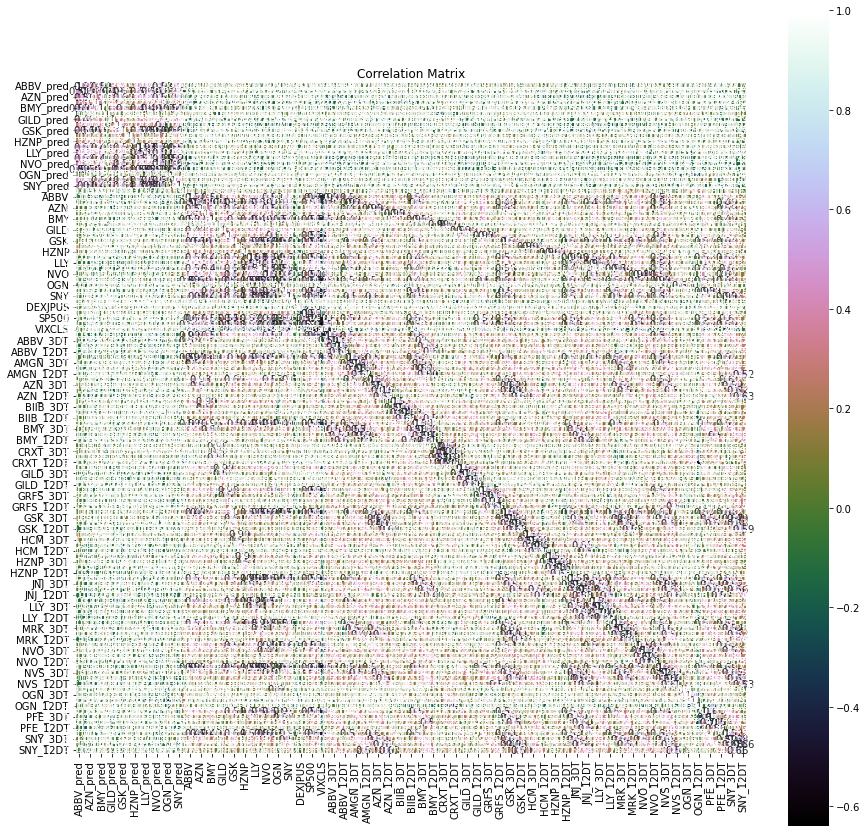

In [238]:
# # Correlation matrix with all tickers
# correlation = dataset.corr()
# pyplot.figure(figsize=(15,15))
# pyplot.title('Correlation Matrix')
# sns.heatmap(correlation, vmax=1, square=True,annot=True,cmap='cubehelix')

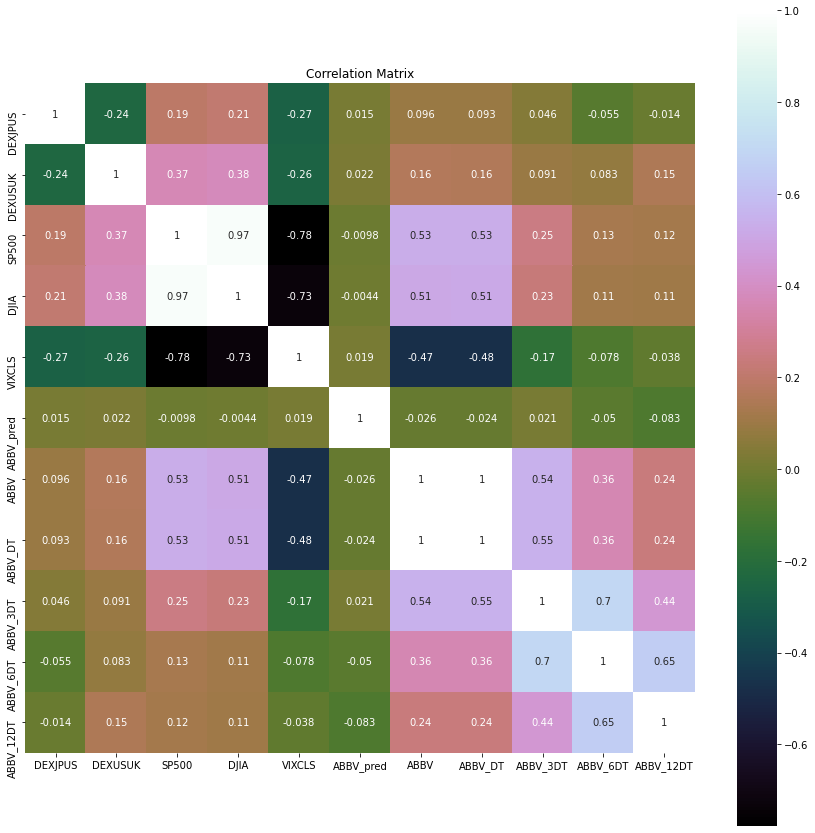

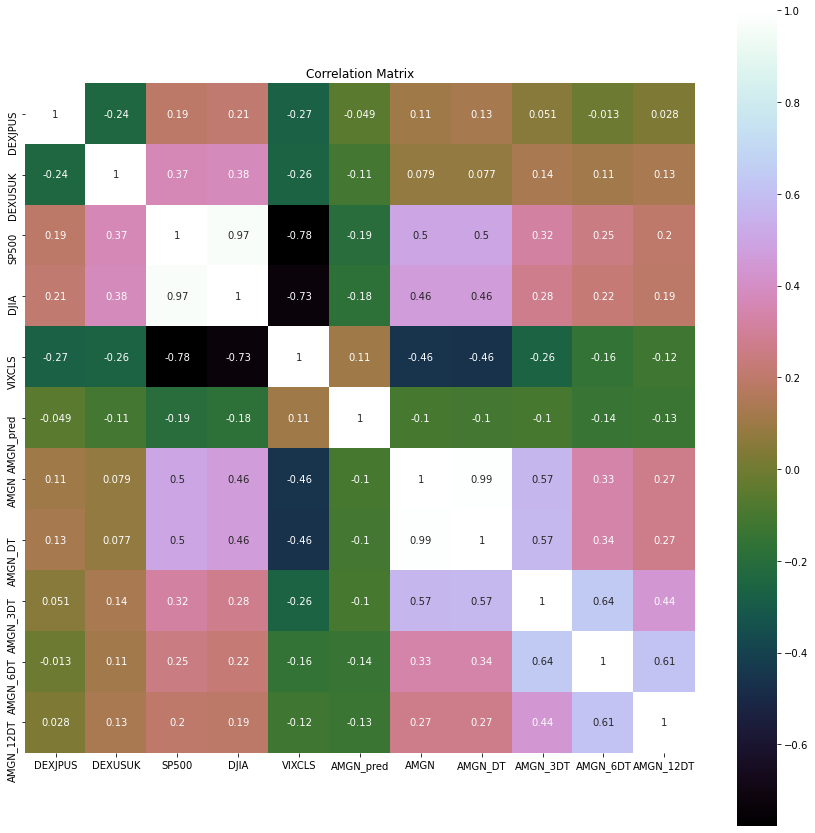

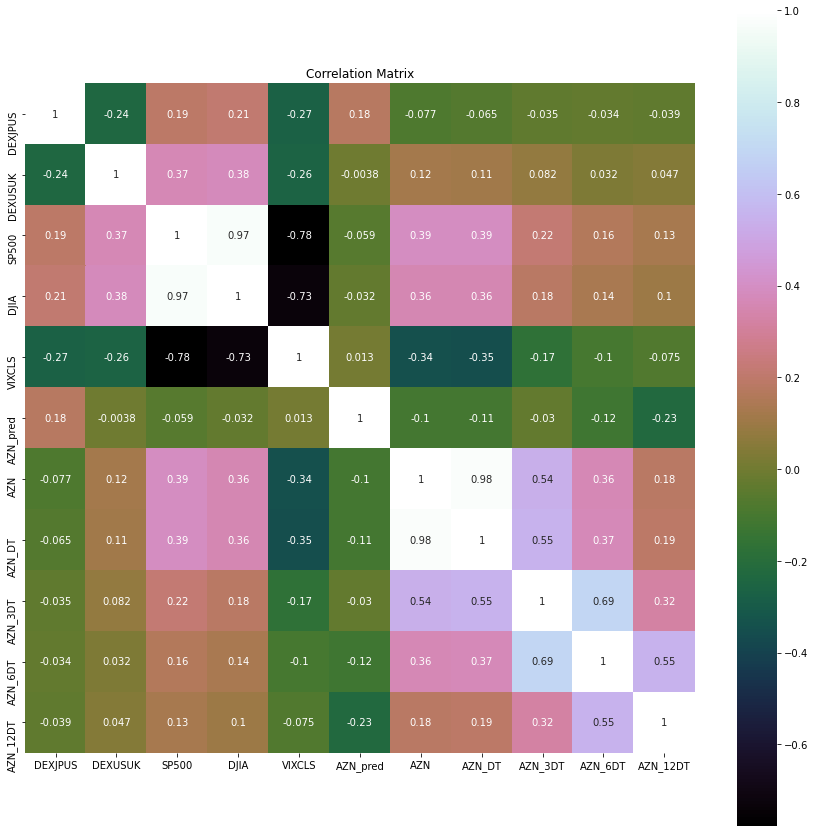

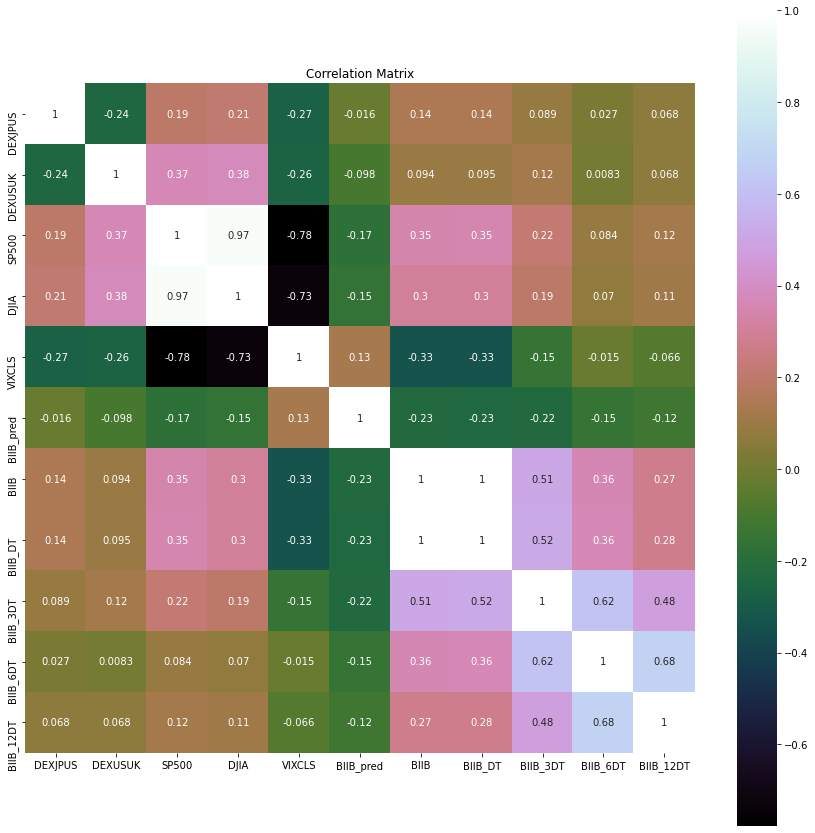

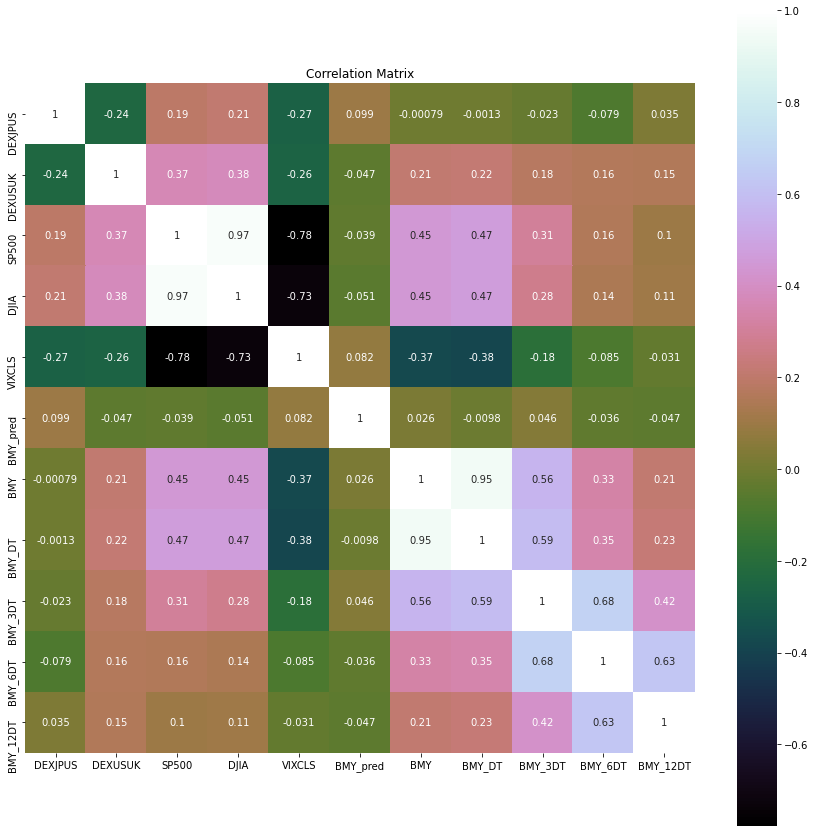

...

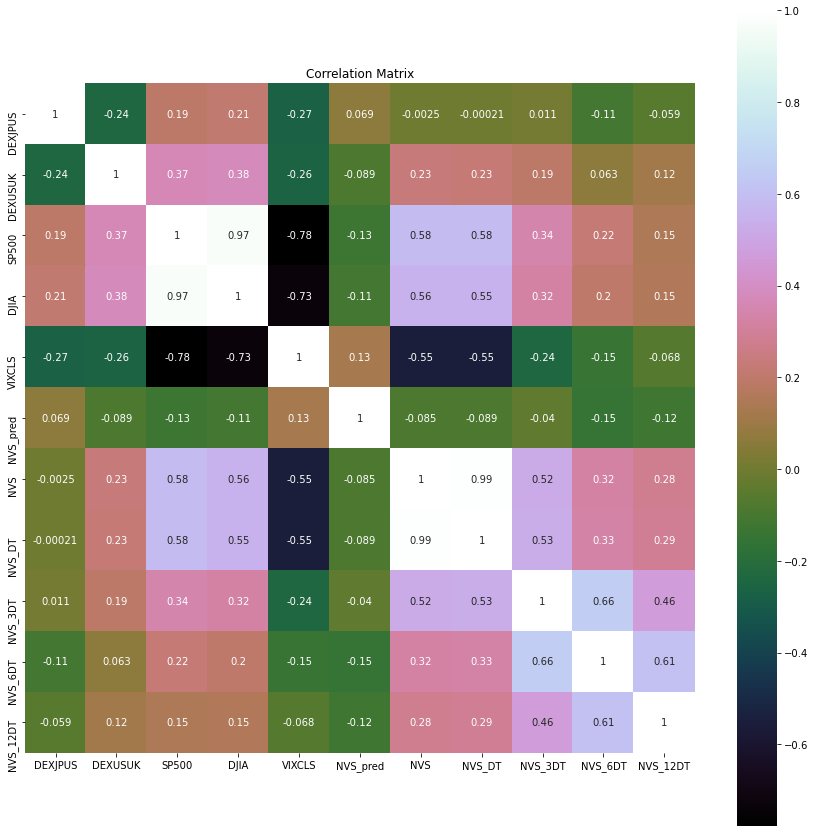

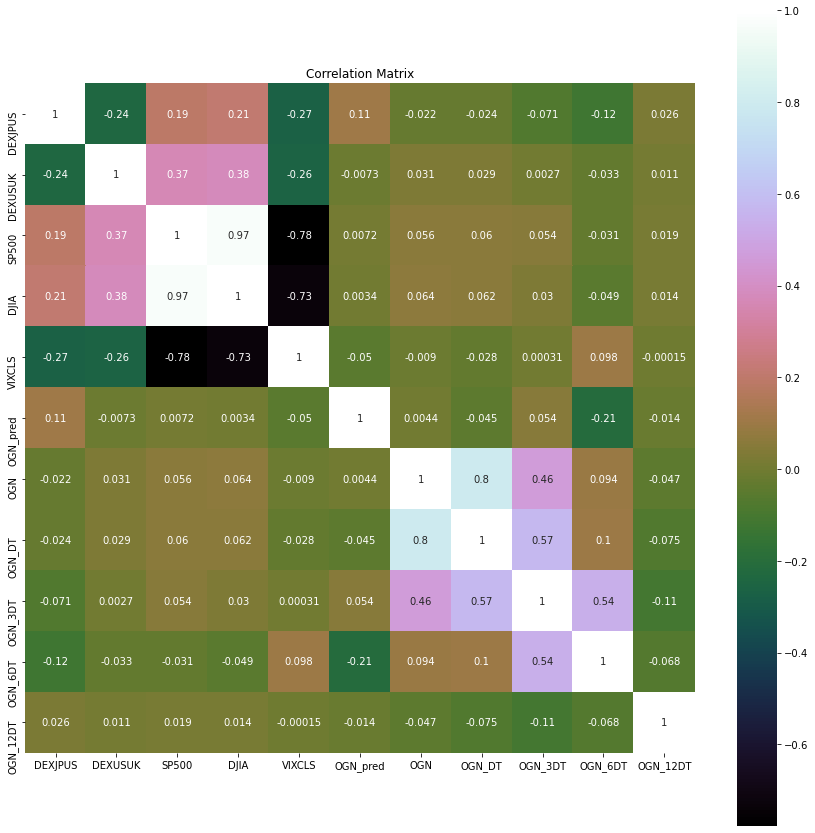

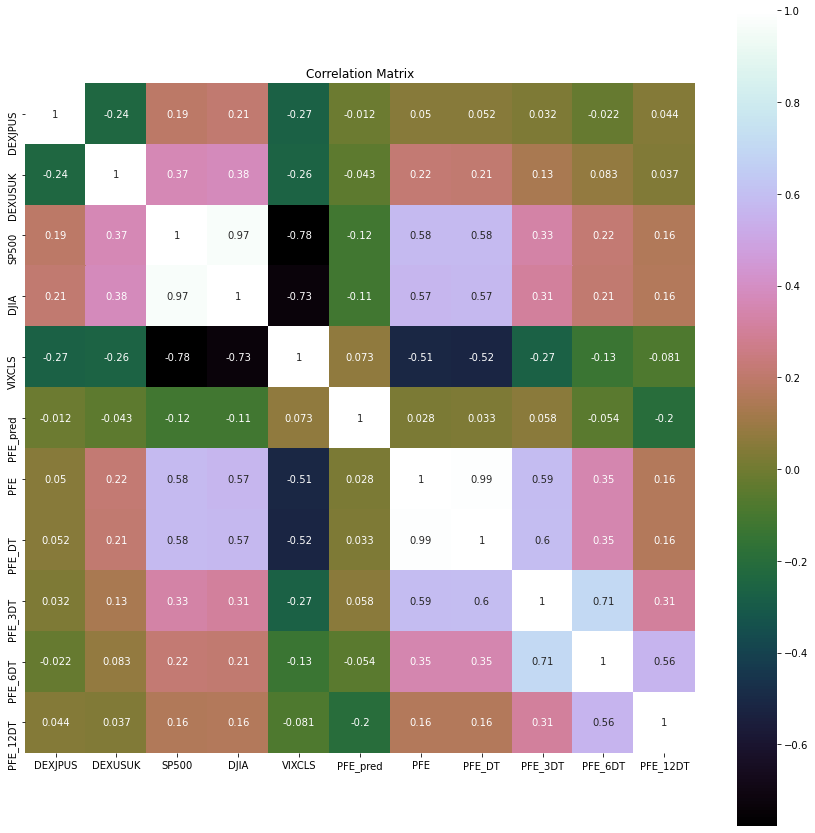

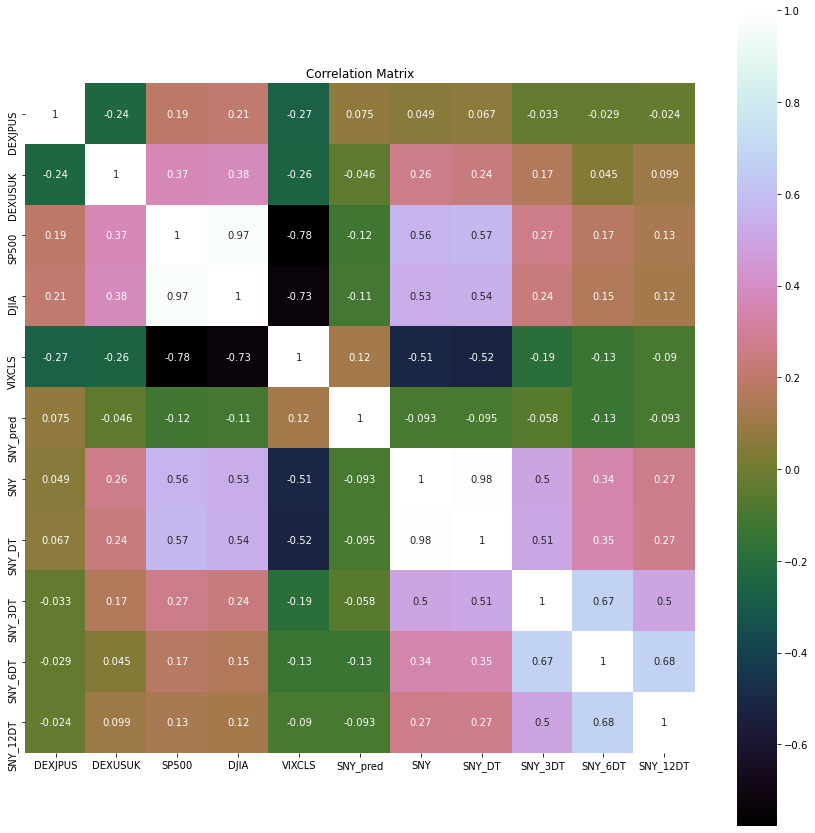

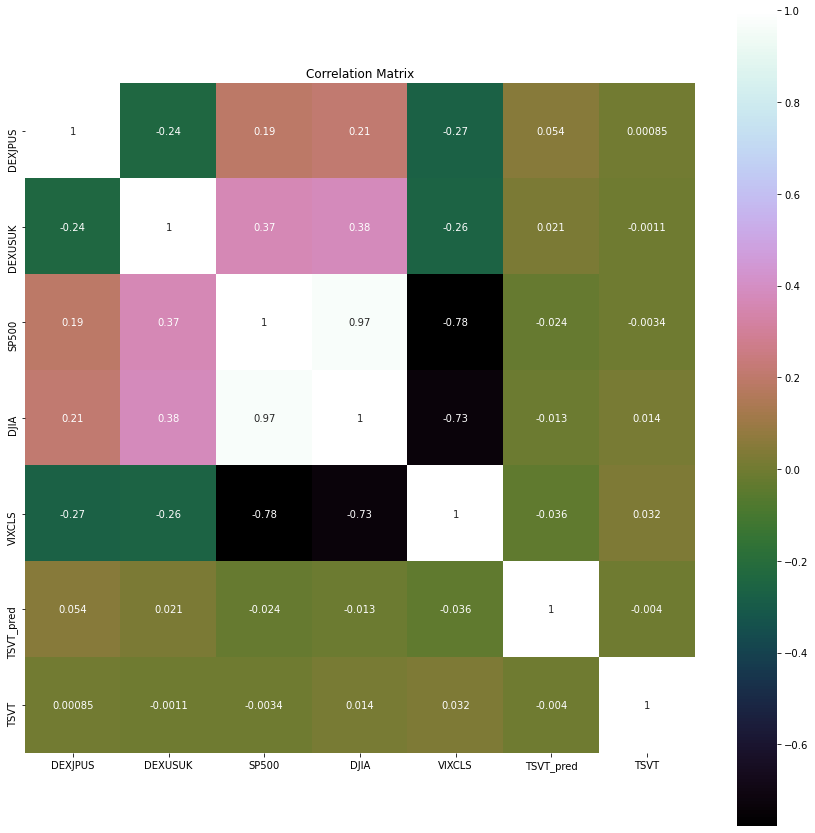

In [58]:
# Plot all tickers
for i in stk_tickers:
    temp = dataset.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
    temp2 = dataset.filter(regex=i, axis=1)
    temp3 = pd.concat([temp, temp2], axis=1)
    
    correlation = temp3.corr()
    pyplot.figure(figsize=(15,15))
    pyplot.title('Correlation Matrix')
    sns.heatmap(correlation, vmax=1, square=True,annot=True,cmap='cubehelix')

<Figure size 1080x1080 with 0 Axes>

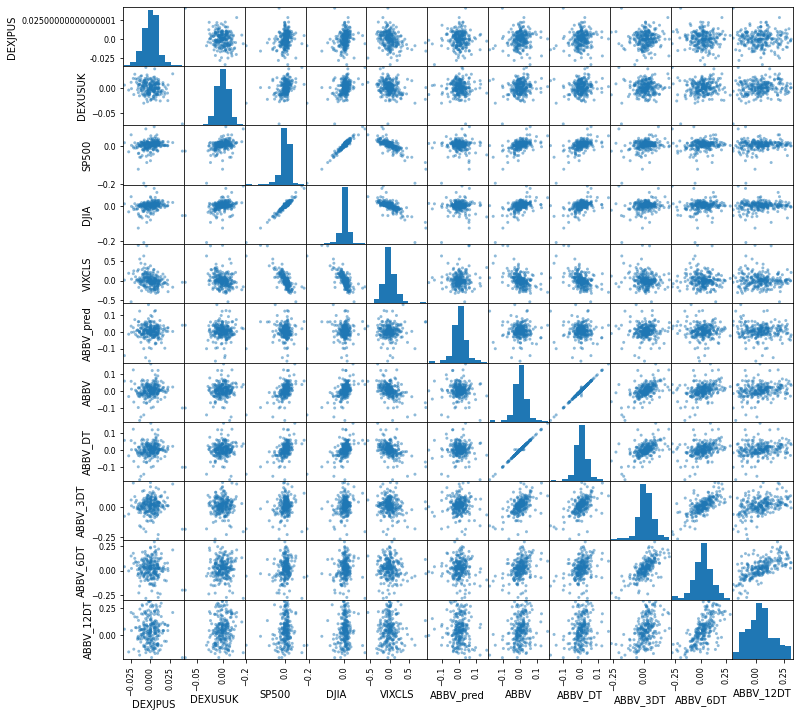

<Figure size 1080x1080 with 0 Axes>

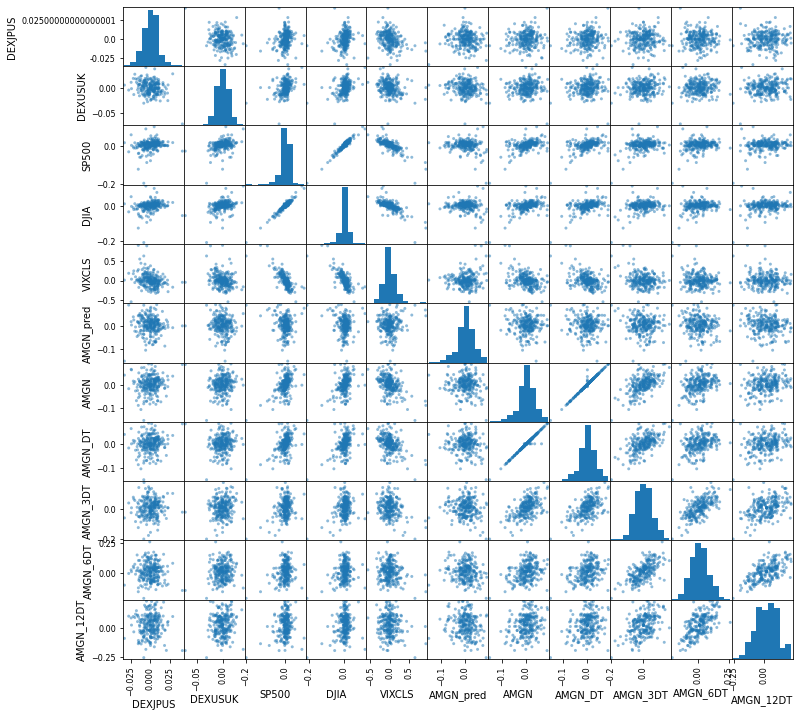

<Figure size 1080x1080 with 0 Axes>

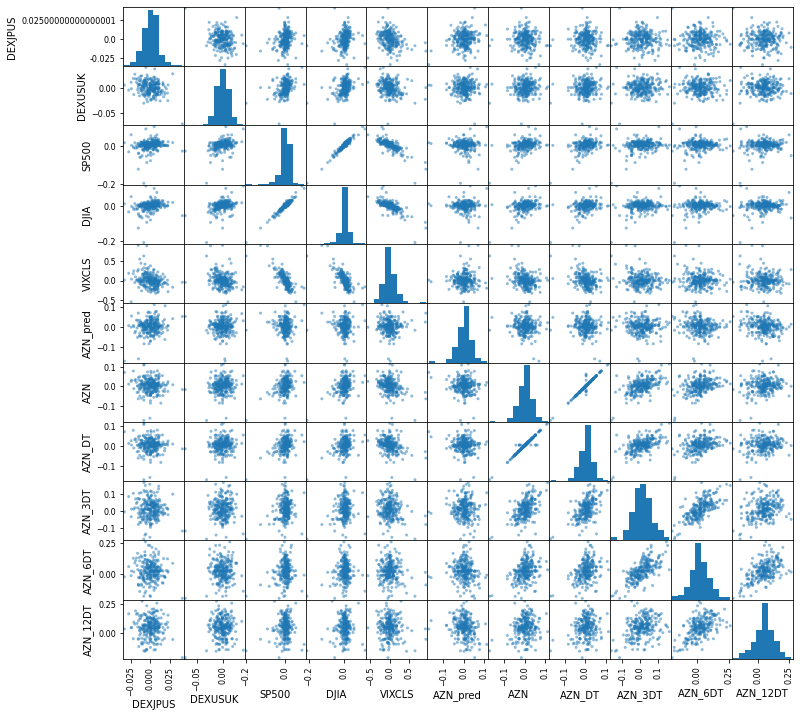

<Figure size 1080x1080 with 0 Axes>

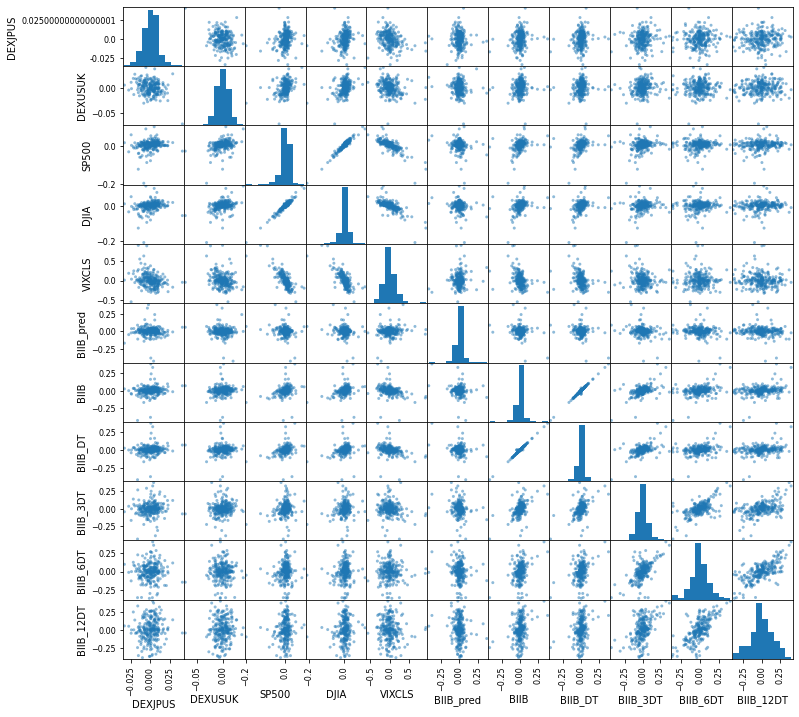

<Figure size 1080x1080 with 0 Axes>

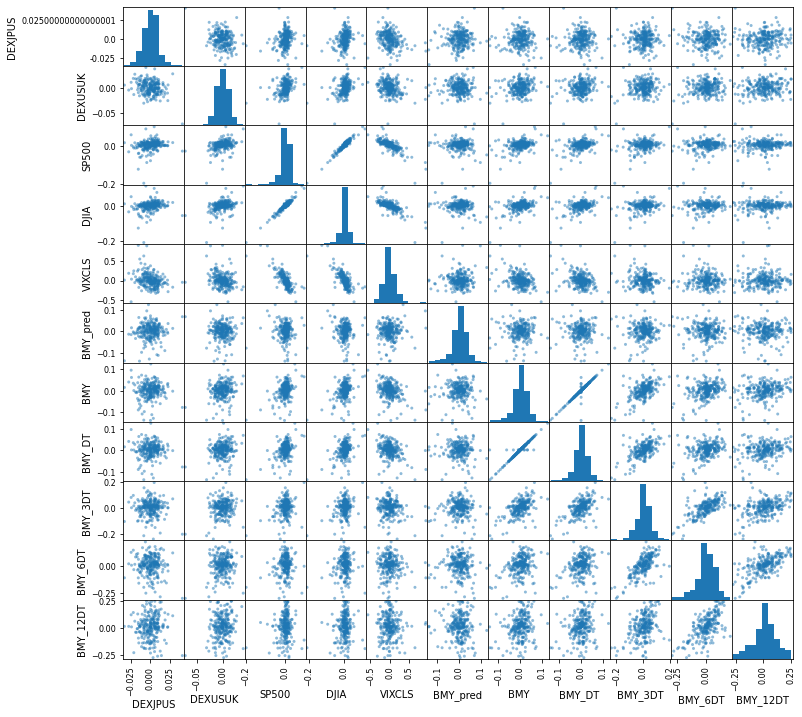

<Figure size 1080x1080 with 0 Axes>

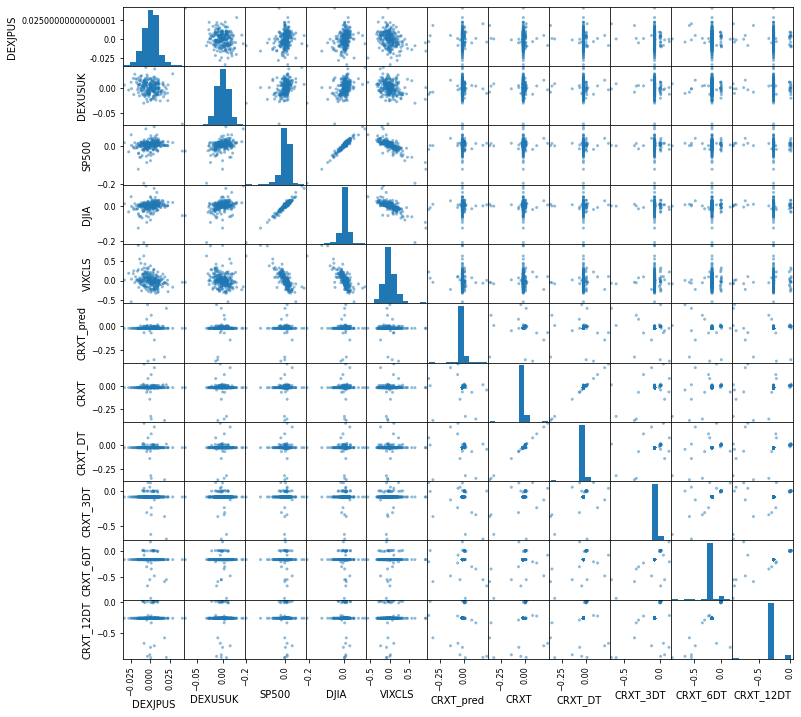

<Figure size 1080x1080 with 0 Axes>

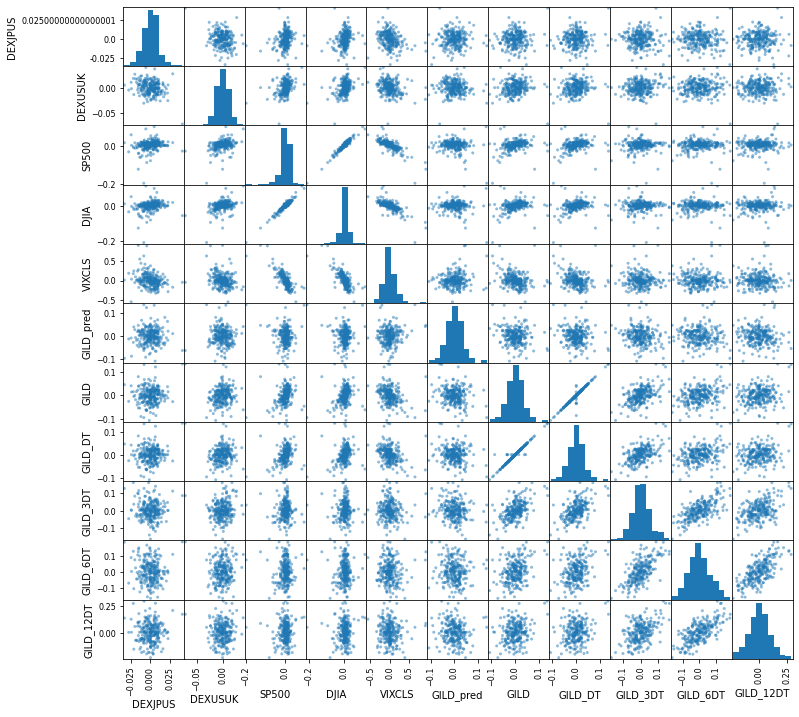

<Figure size 1080x1080 with 0 Axes>

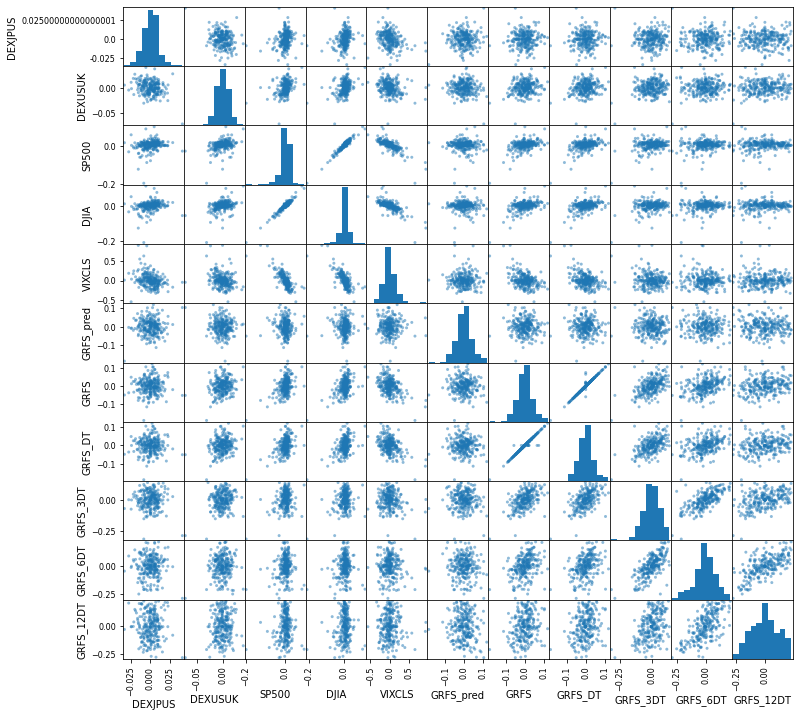

<Figure size 1080x1080 with 0 Axes>

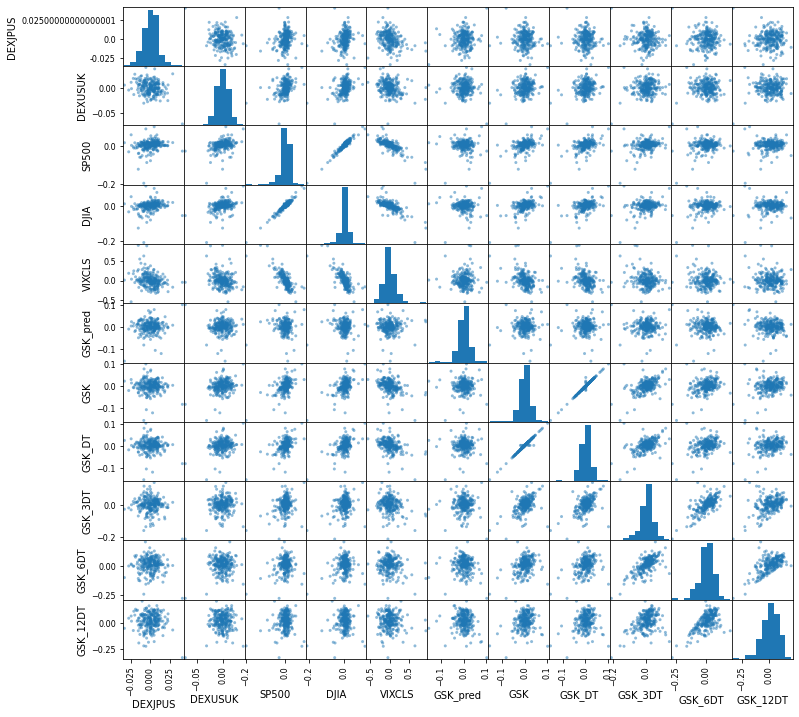

<Figure size 1080x1080 with 0 Axes>

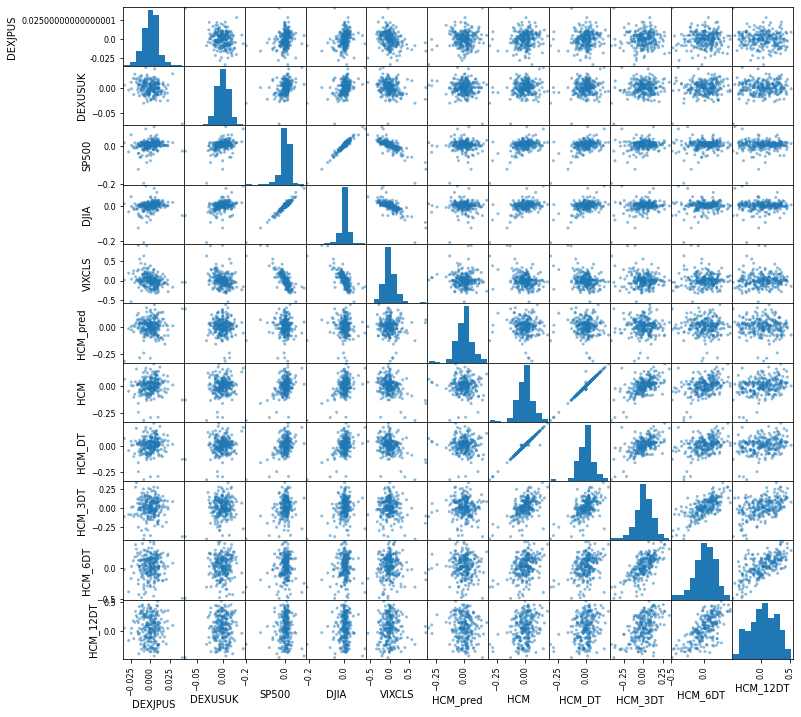

<Figure size 1080x1080 with 0 Axes>

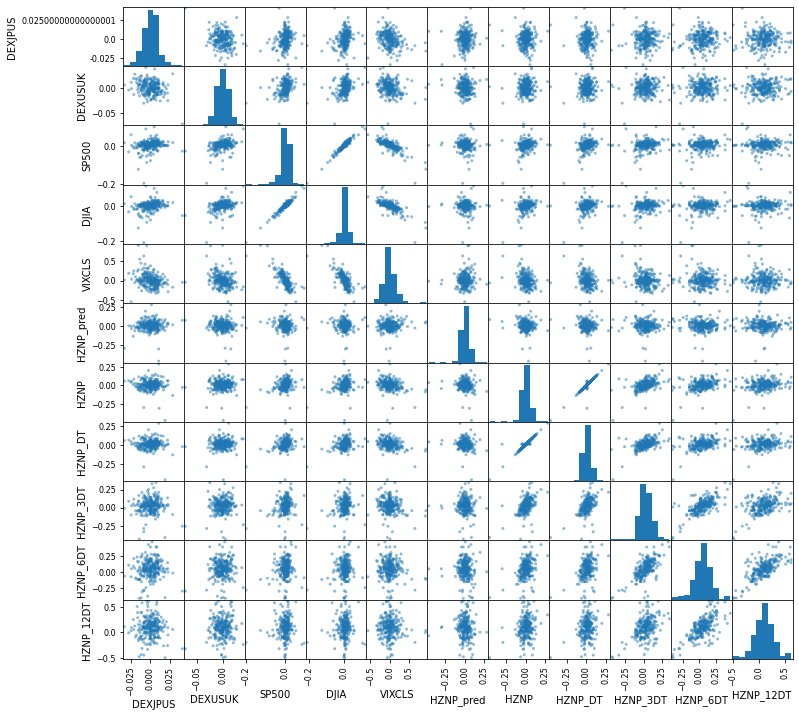

<Figure size 1080x1080 with 0 Axes>

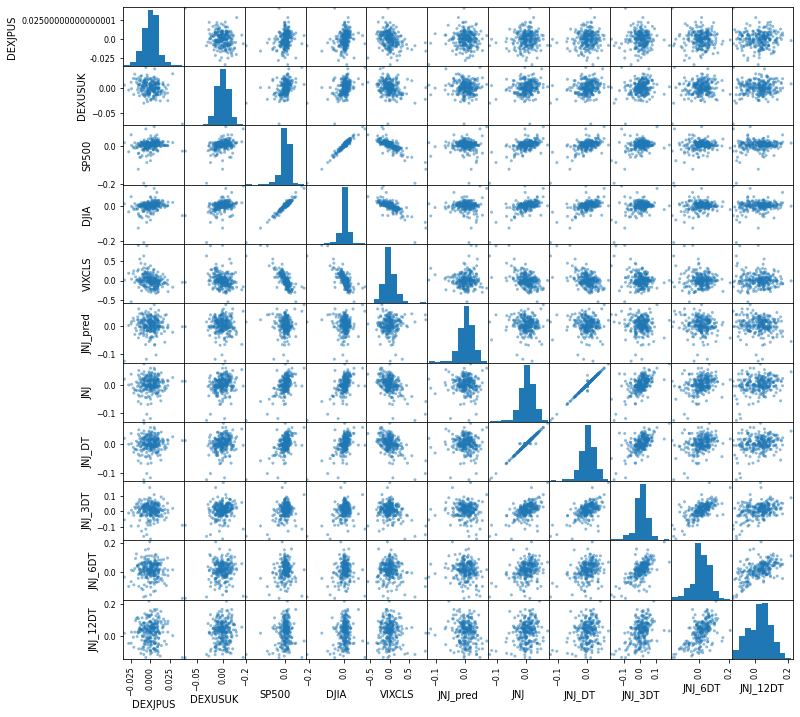

<Figure size 1080x1080 with 0 Axes>

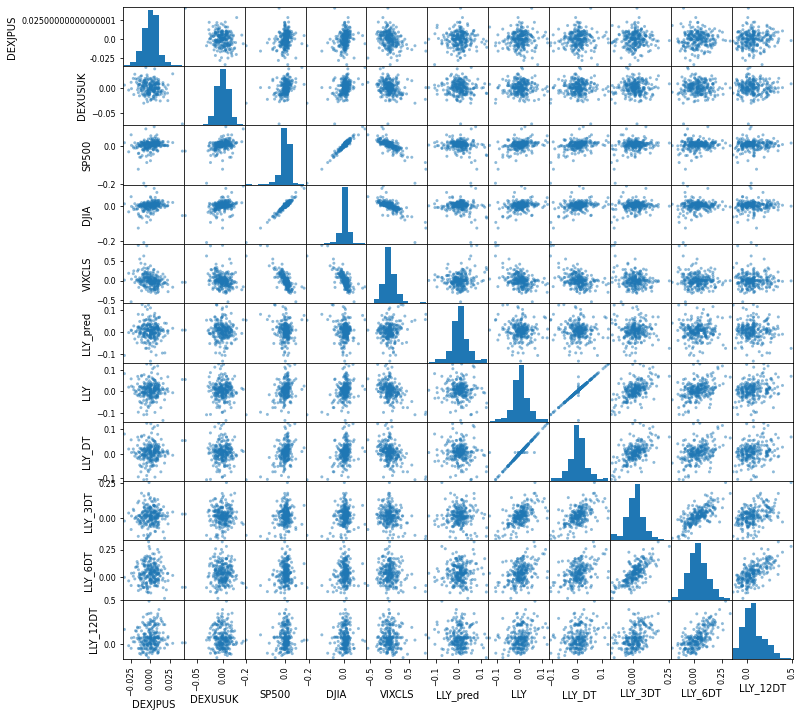

<Figure size 1080x1080 with 0 Axes>

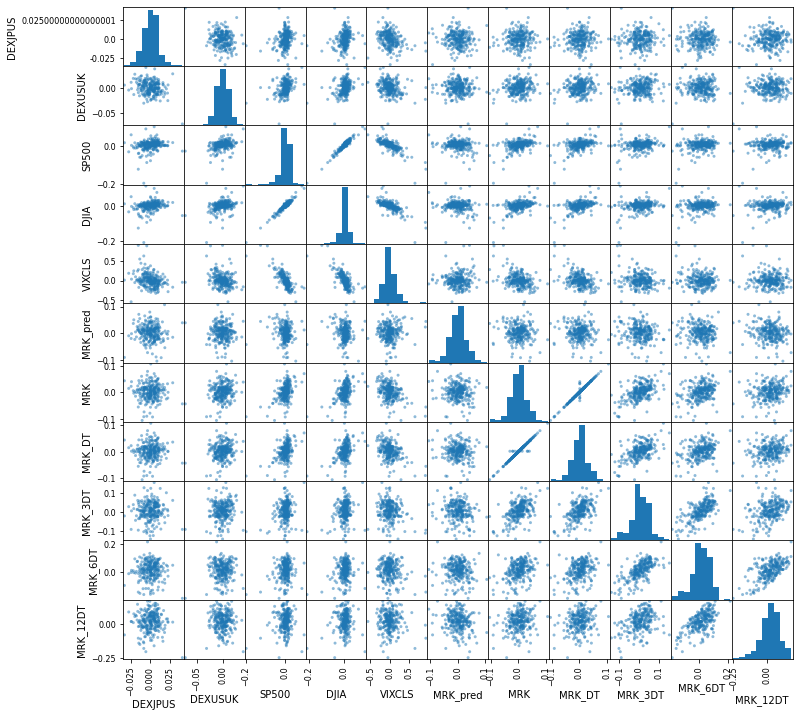

<Figure size 1080x1080 with 0 Axes>

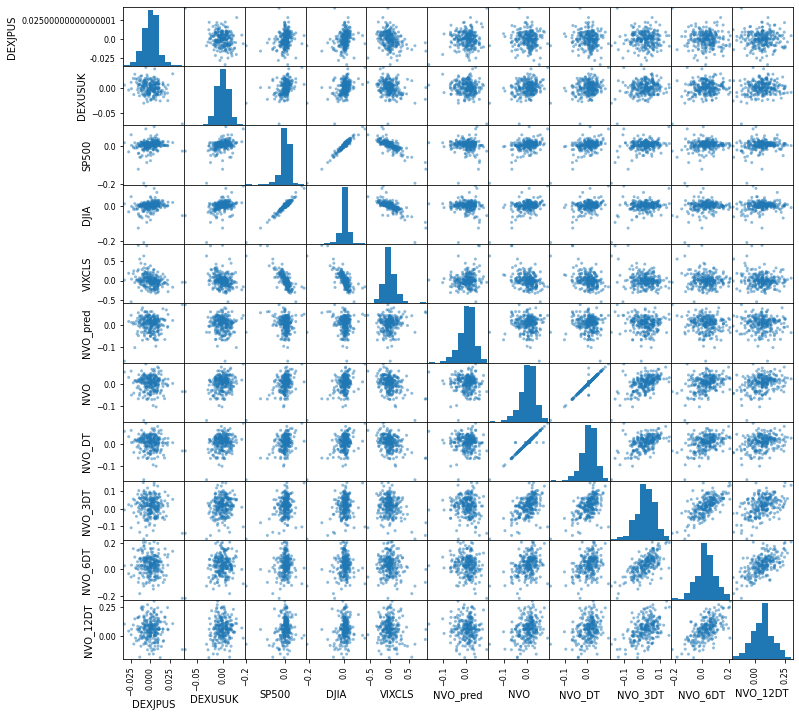

<Figure size 1080x1080 with 0 Axes>

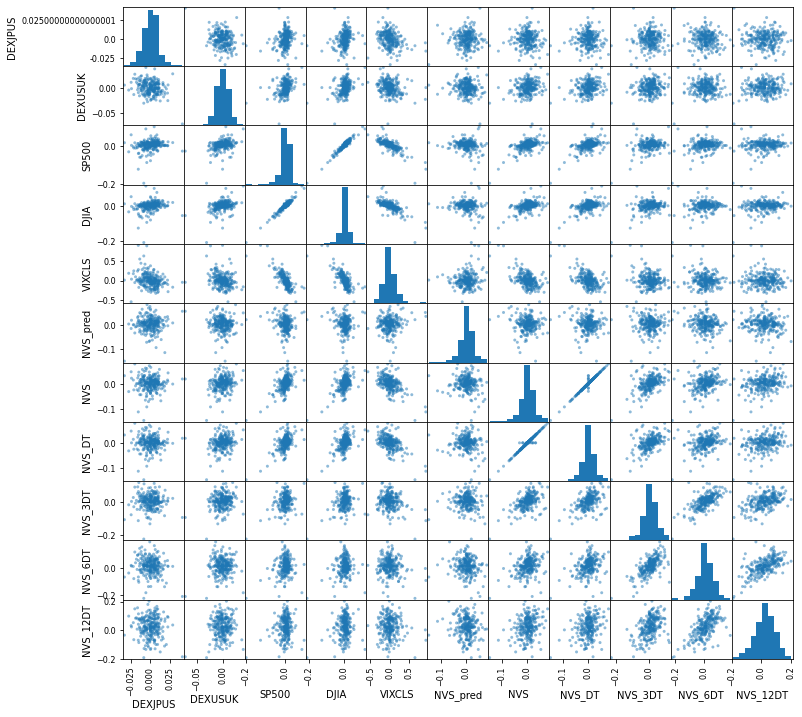

<Figure size 1080x1080 with 0 Axes>

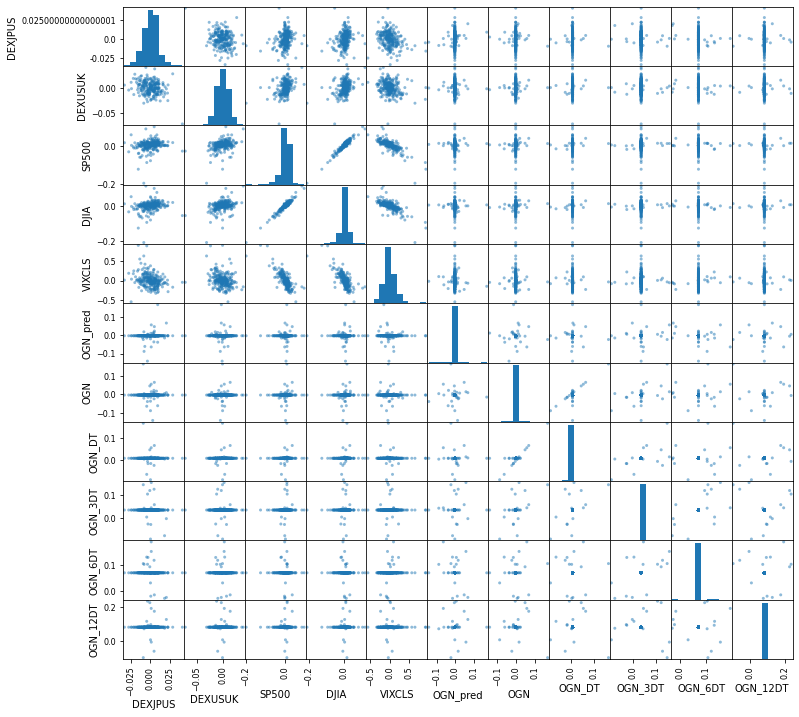

<Figure size 1080x1080 with 0 Axes>

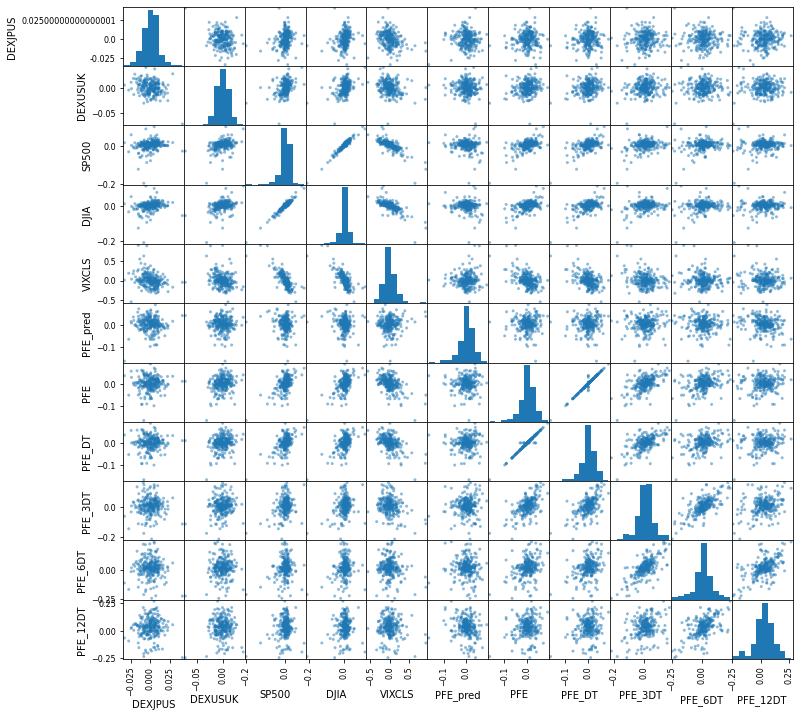

<Figure size 1080x1080 with 0 Axes>

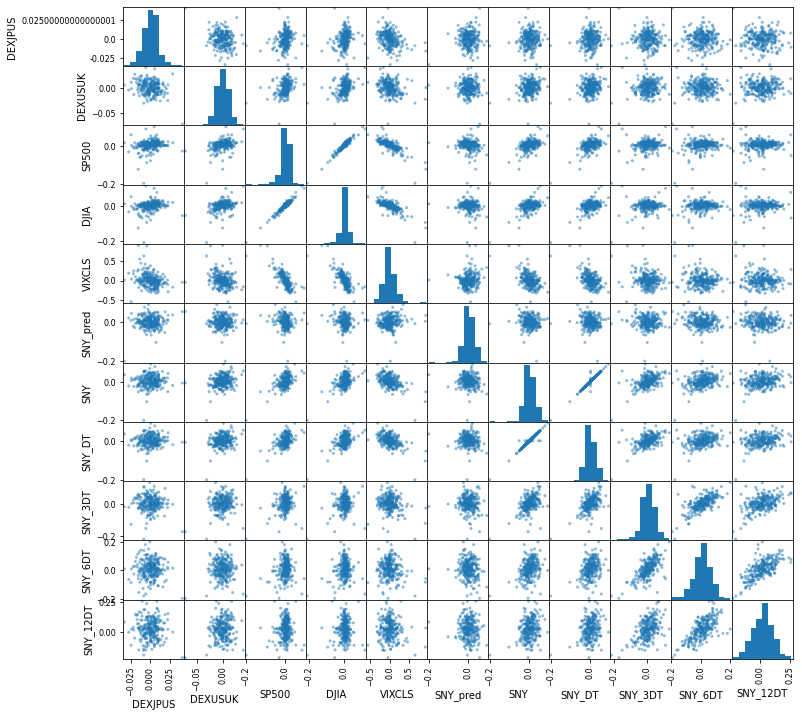

<Figure size 1080x1080 with 0 Axes>

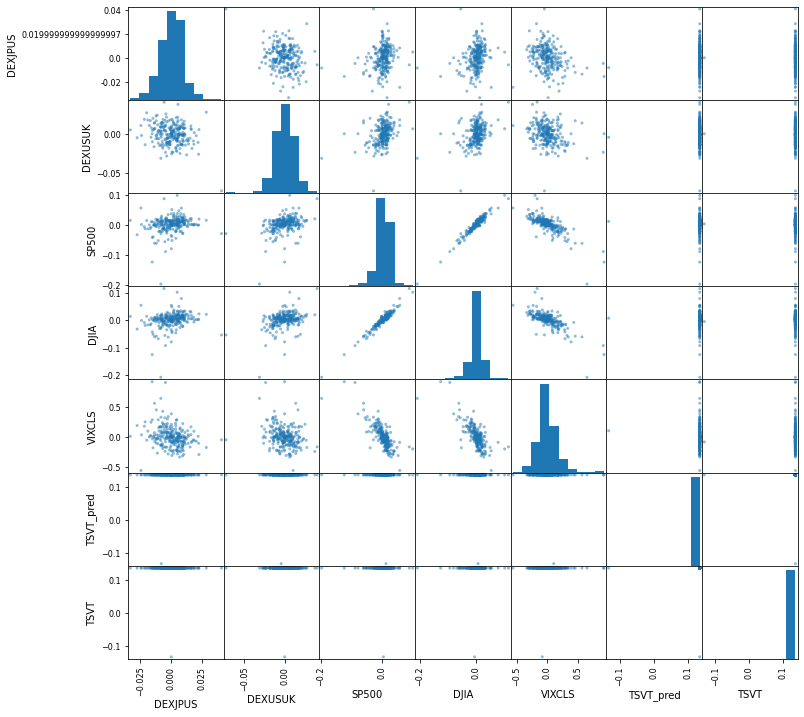

In [59]:
# Plot all tickers
for i in stk_tickers:
    temp = dataset.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
    temp2 = dataset.filter(regex=i, axis=1)
    temp3 = pd.concat([temp, temp2], axis=1)
    
    pyplot.figure(figsize=(15,15))
    scatter_matrix(temp3,figsize=(12,12))
    pyplot.show()

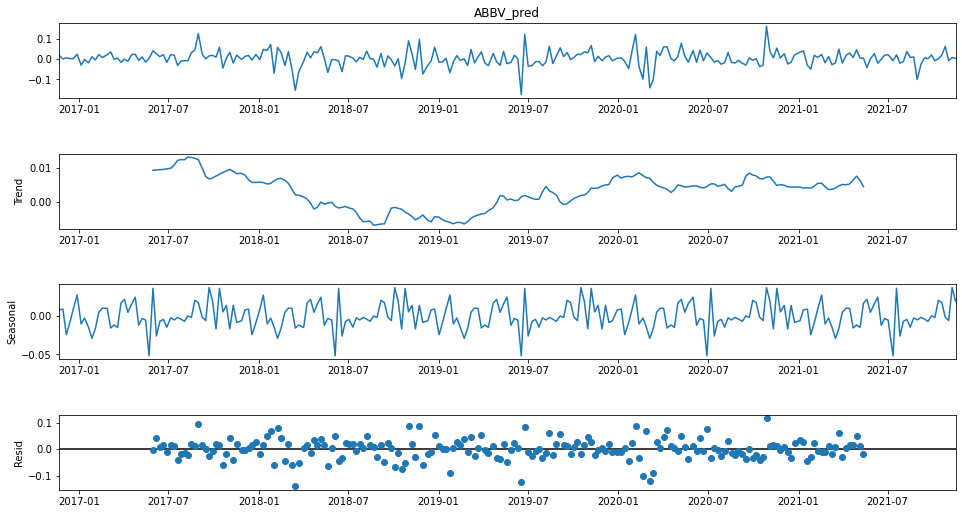

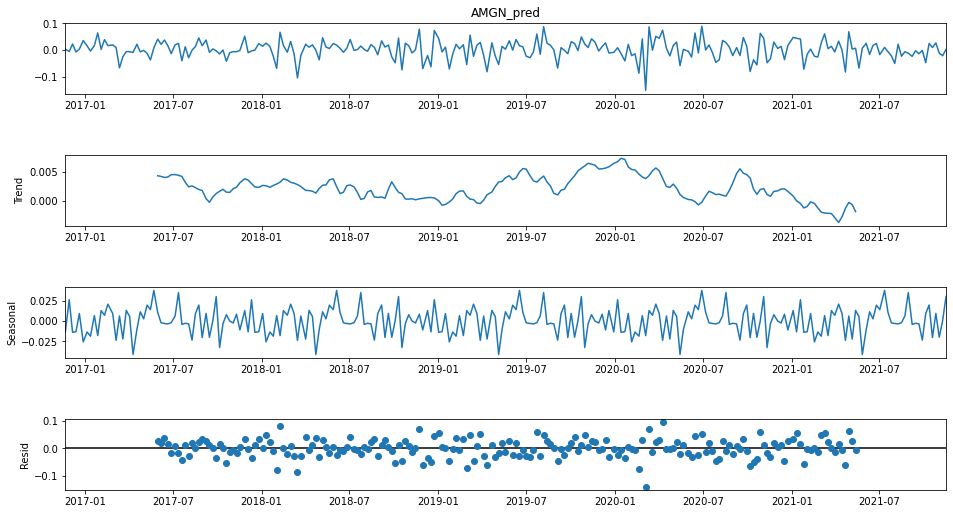

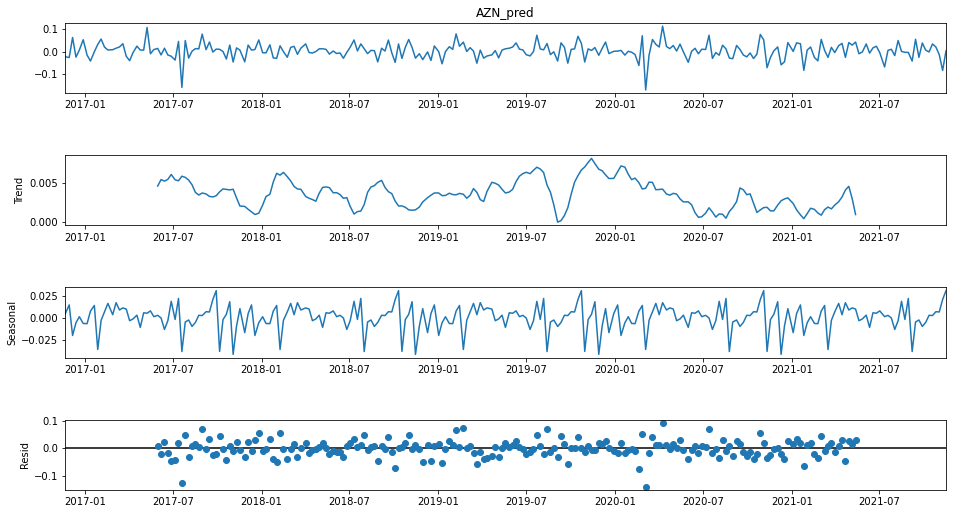

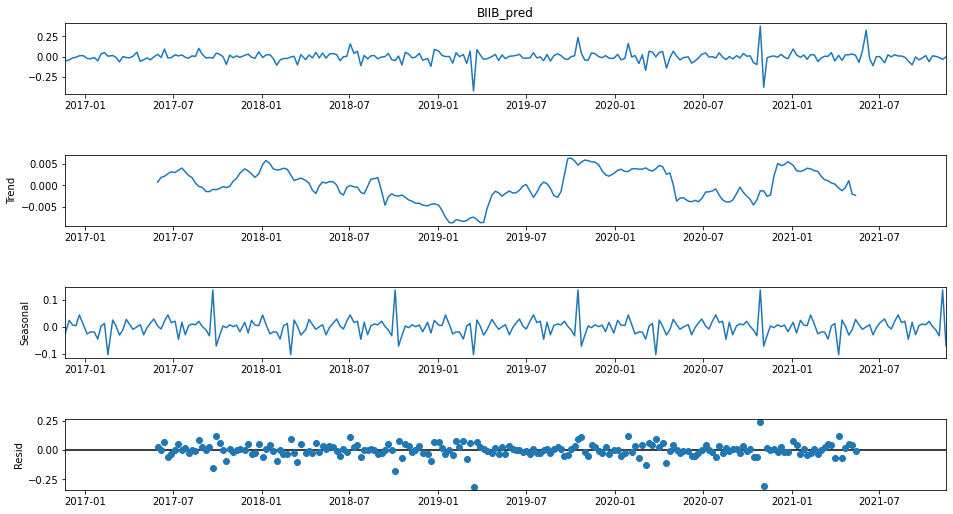

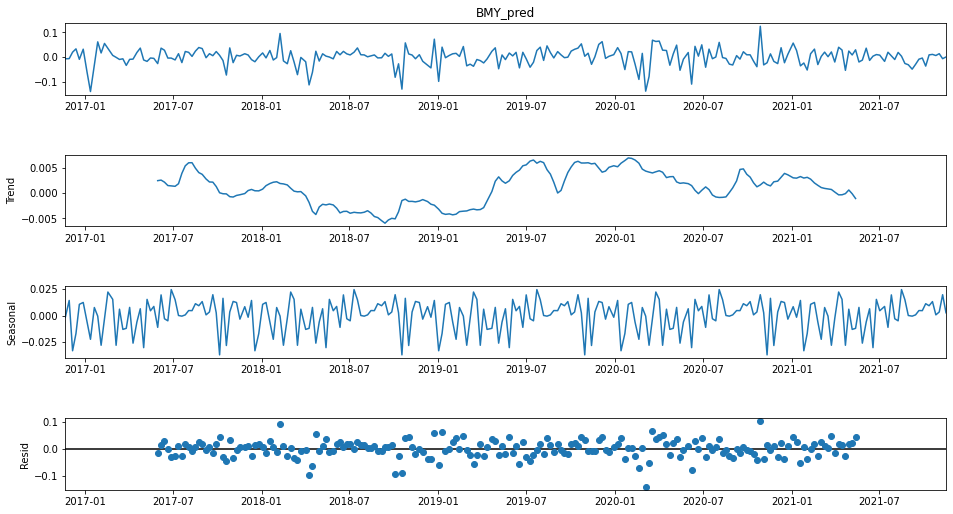

...

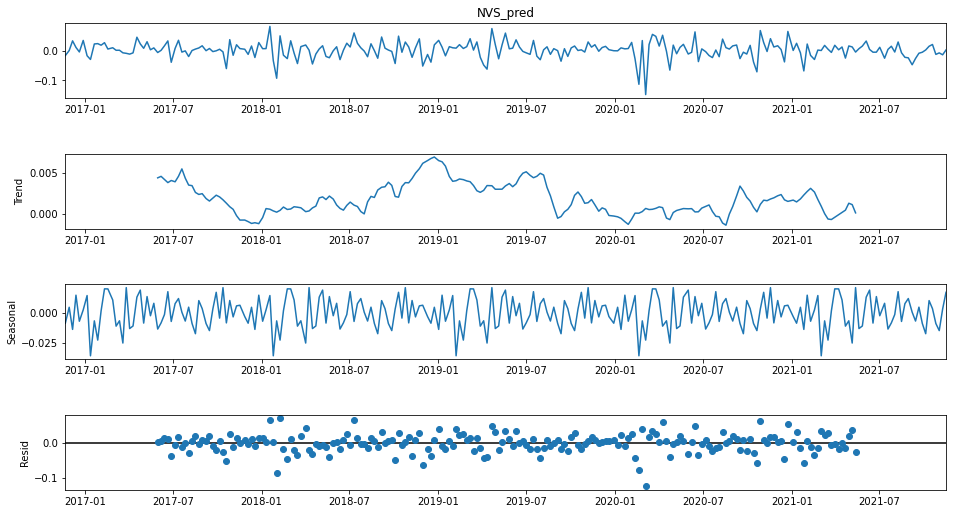

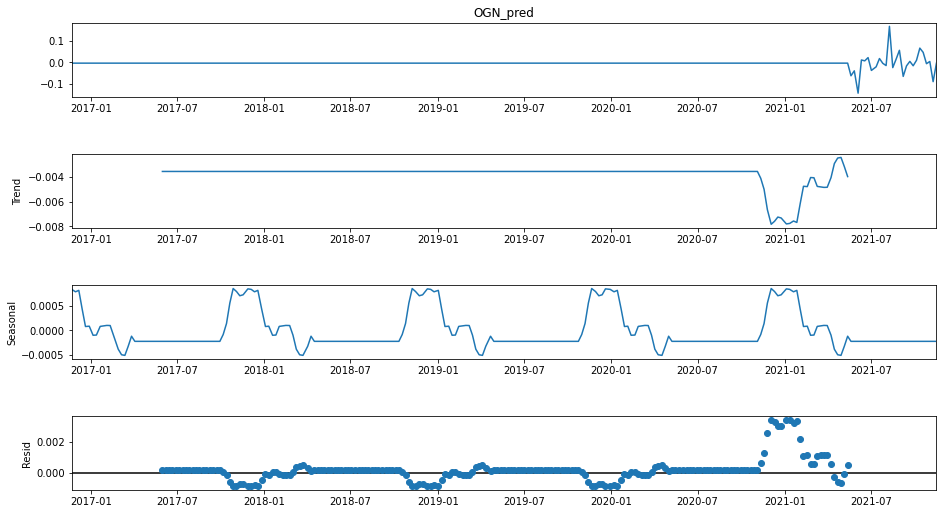

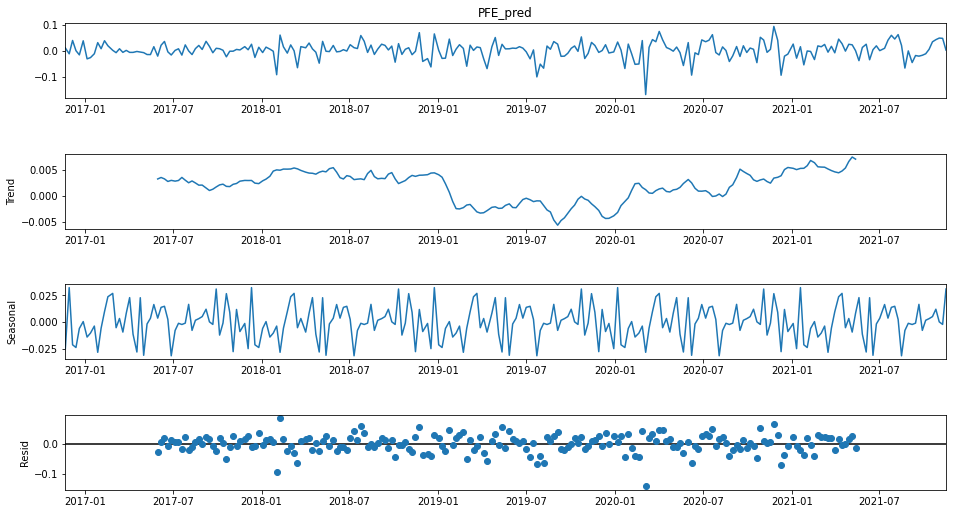

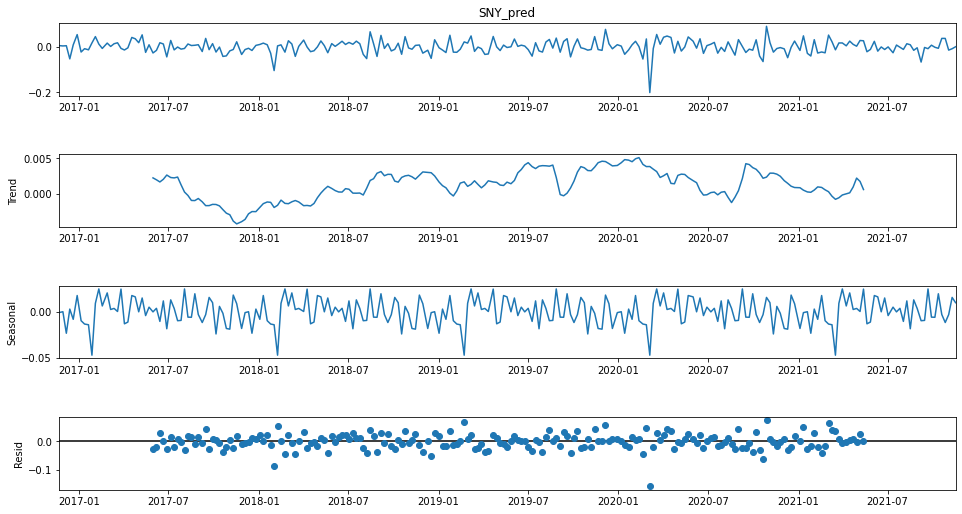

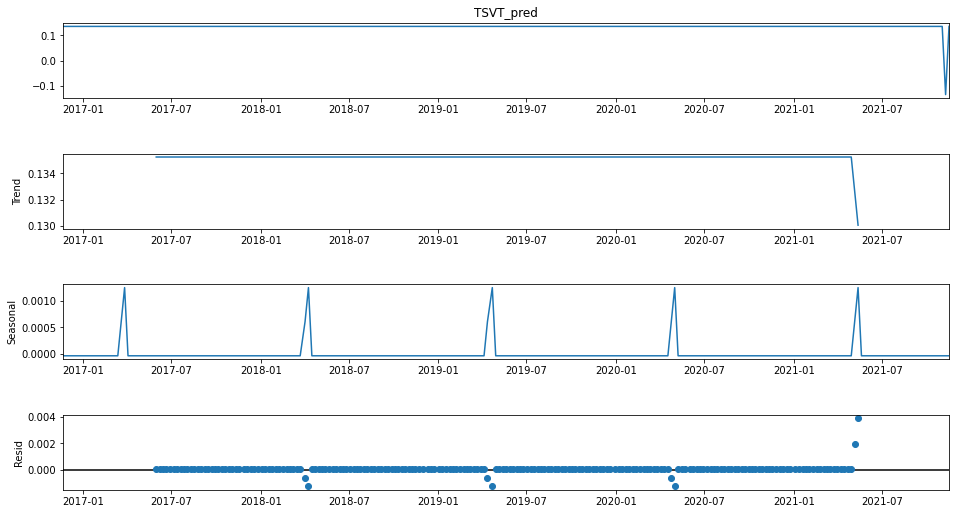

In [60]:
# Seasonality
for i in stk_tickers:
    res = sm.tsa.seasonal_decompose(Y.loc[:,i+'_pred'],period=52)
    fig = res.plot()
    fig.set_figheight(8)
    fig.set_figwidth(15)
    pyplot.show()

In [61]:
validation_size = 0.2
train_size = int(len(X) * (1-validation_size))
X_train, X_test = X[0:train_size], X[train_size:len(X)]
Y_train, Y_test = Y[0:train_size], Y[train_size:len(X)]

In [62]:
num_folds = 10
scoring = 'neg_mean_squared_error'

In [63]:
# Without the tuning hyperparameters
models = []
models.append(('LR', LinearRegression()))
models.append(('LASSO', Lasso()))
models.append(('EN', ElasticNet()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))
models.append(('SVR', SVR()))

In [64]:
models.append(('MLP', MLPRegressor()))
# Boosting methods
models.append(('ABR', AdaBoostRegressor()))
models.append(('GBR', GradientBoostingRegressor())) 
# Bagging methods
models.append(('RFR', RandomForestRegressor()))
models.append(('ETR', ExtraTreesRegressor()))

In [65]:
from random import seed

In [66]:
import warnings
warnings.filterwarnings("ignore")

In [67]:
seed(1)

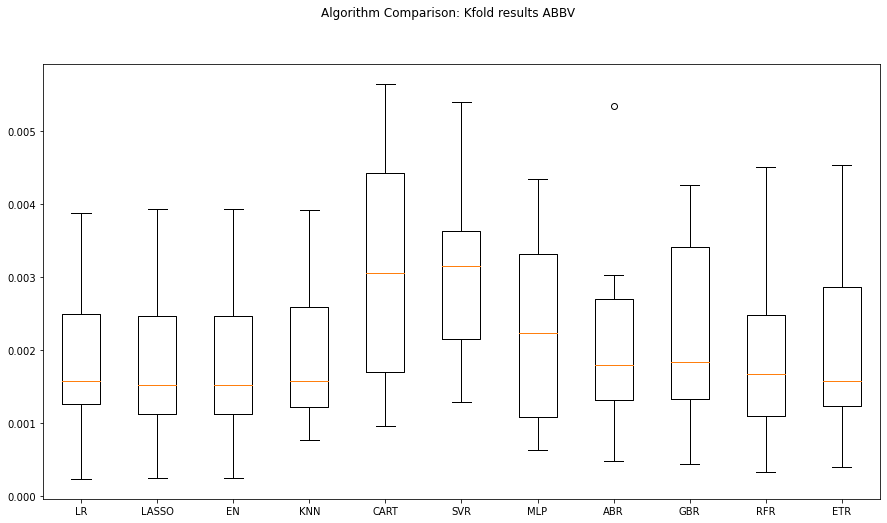

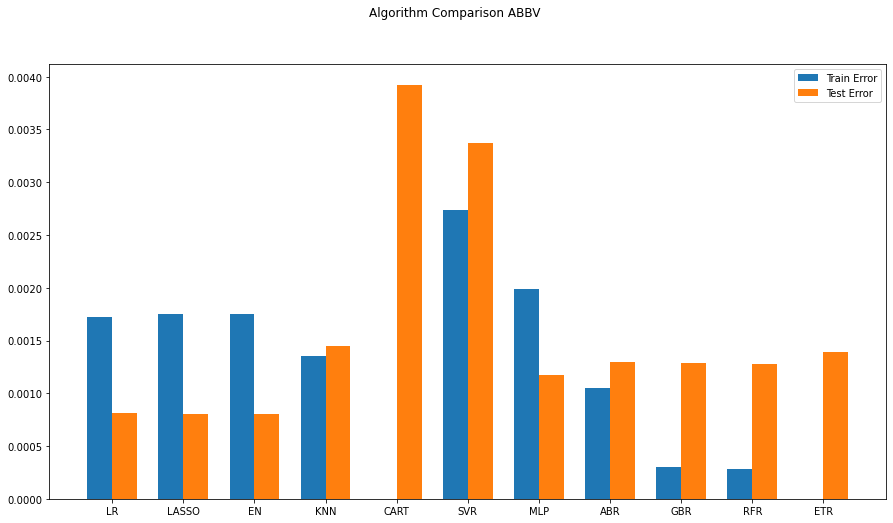

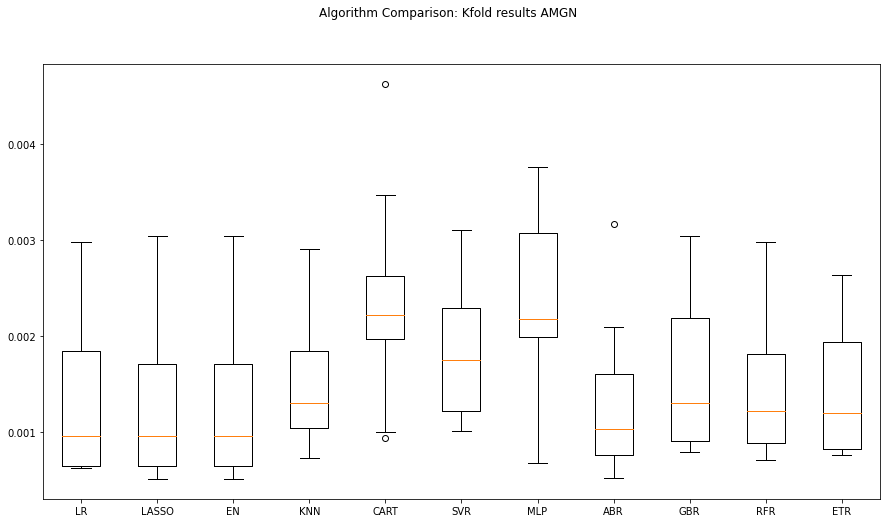

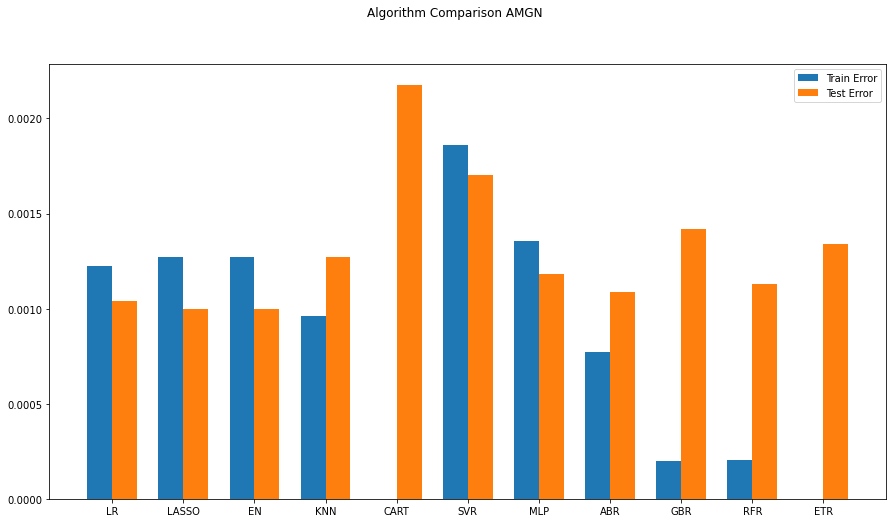

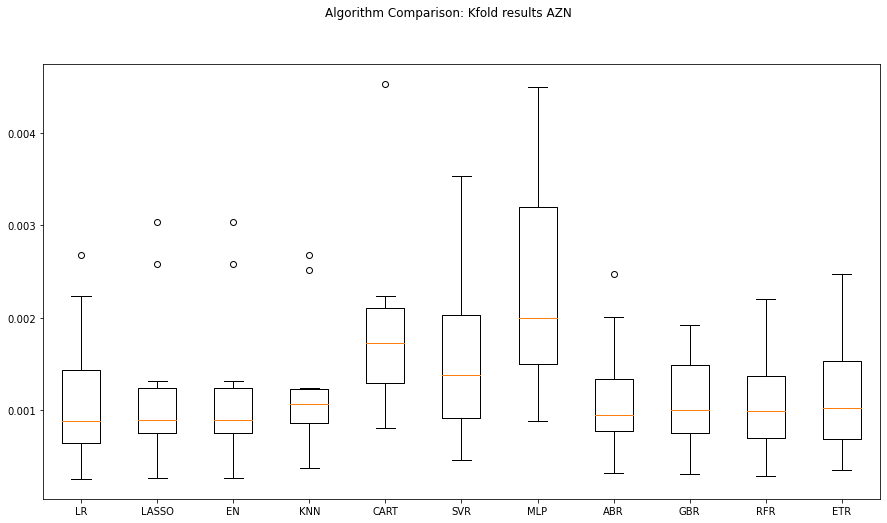

...

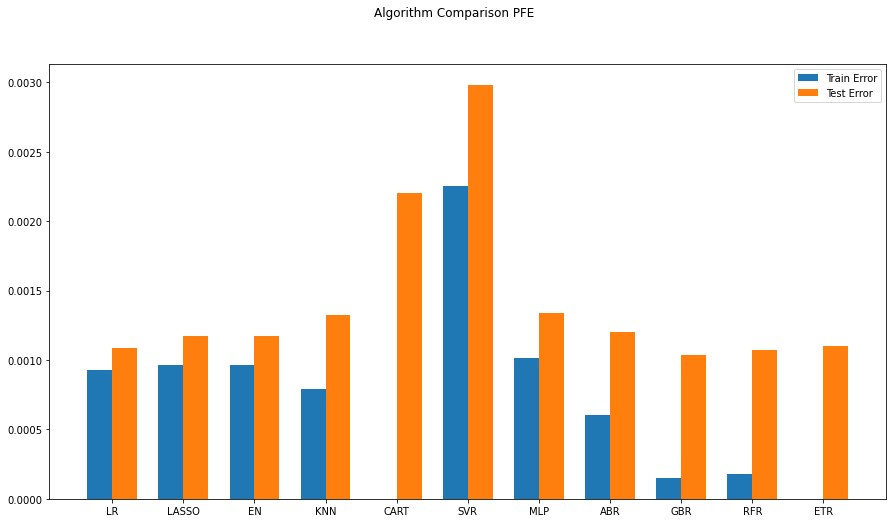

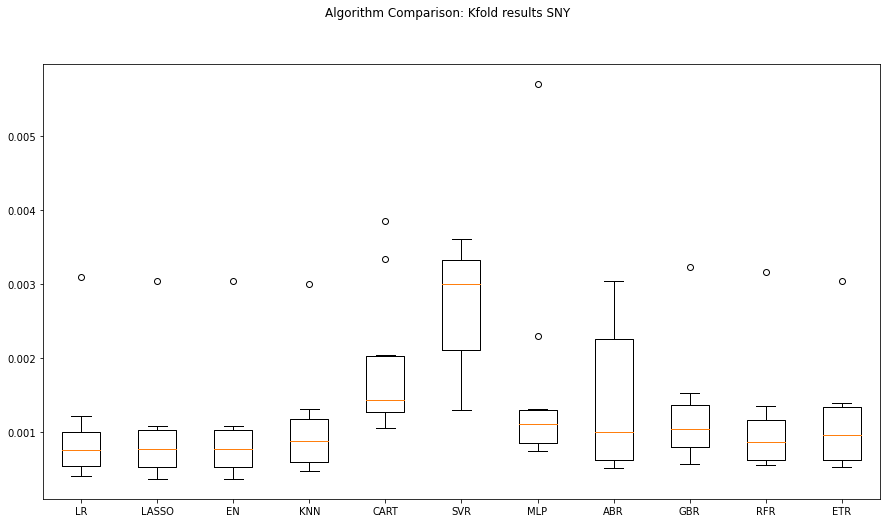

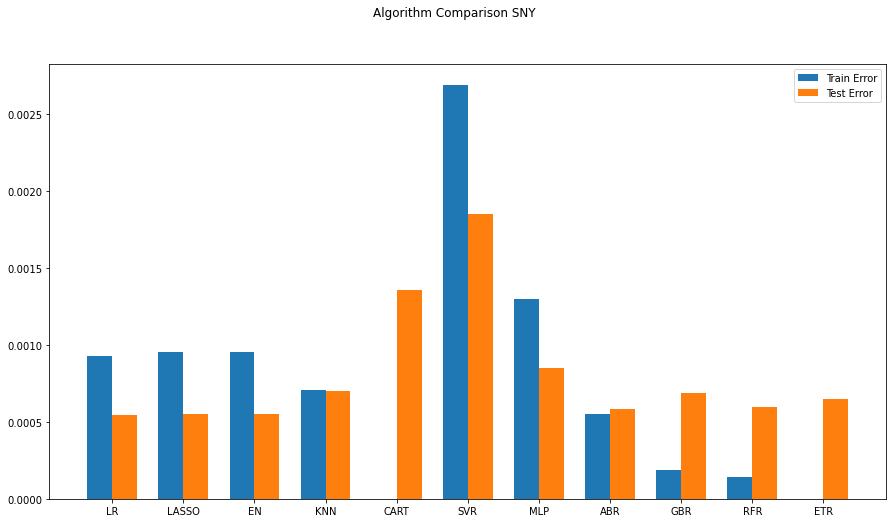

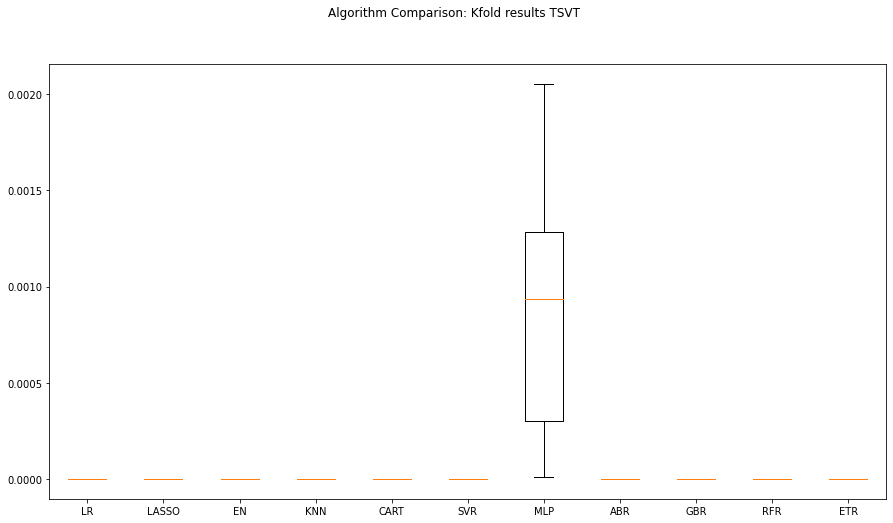

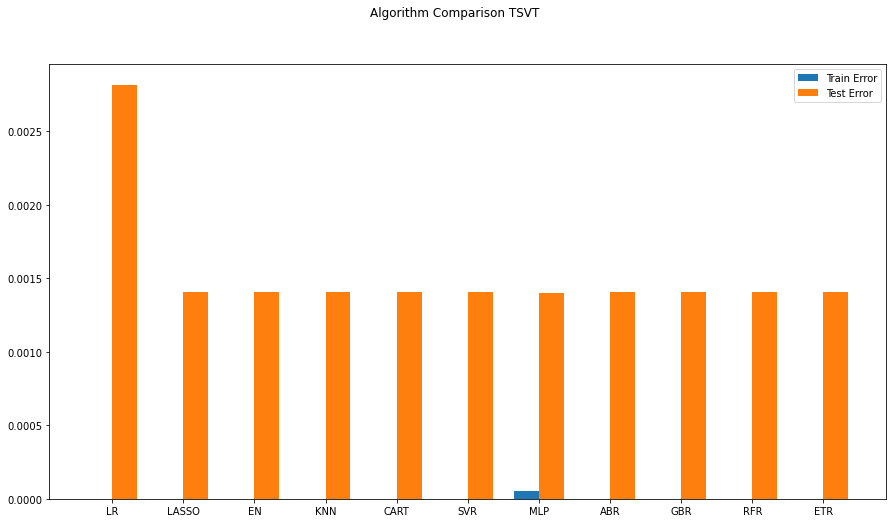

In [103]:
# for i in stk_tickers:
#     X_temp = X_train.filter(regex=i, axis=1)
#     Y_temp = Y_train.filter(regex=i, axis=1)
#     X_temp_test = X_test.filter(regex=i, axis=1)
#     Y_temp_test = Y_test.filter(regex=i, axis=1)
    
#     names = []
    
#     kfold_results = [] 
#     test_results = [] 
#     train_results = []
#     for name, model in models:
#         names.append(name)
#         ## k-fold analysis:
#         kfold = KFold(n_splits=num_folds)
#         #converted mean squared error to positive. The lower the better
#         cv_results = -1* cross_val_score(model, X_temp, Y_temp, cv=kfold, scoring=scoring)
#         kfold_results.append(cv_results)
#         # Full Training period
#         res = model.fit(X_temp, Y_temp)
#         train_result = mean_squared_error(res.predict(X_temp), Y_temp) 
#         train_results.append(train_result)
#         # Test results
#         test_result = mean_squared_error(res.predict(X_temp_test), Y_temp_test) 
#         test_results.append(test_result)
#     for j in range(0,1):
#         fig = pyplot.figure()
#         fig.suptitle(f'Algorithm Comparison: Kfold results {i}')
#         ax = fig.add_subplot(111)
#         pyplot.boxplot(kfold_results)
#         ax.set_xticklabels(names)
#         fig.set_size_inches(15,8)
#         pyplot.show()
#     for k in range(0,1):
#         fig = pyplot.figure()
#         ind = np.arange(len(names)) # the x locations for the groups
#         width = 0.35 # the width of the bars
#         fig.suptitle(f'Algorithm Comparison {i}')
#         ax = fig.add_subplot(111)
#         pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
#         pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
#         fig.set_size_inches(15,8)
#         pyplot.legend()
#         ax.set_xticks(ind)
#         ax.set_xticklabels(names)
#         pyplot.show()
    

In [68]:
#stk_idx_coin_tickers = stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']
#X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
X_test

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2020-11-18,0.005791,-0.048447,-0.071989,-0.012577,-0.022484,-0.020242,0.013223,0.002652,-0.055939,-0.040051,...,0.070321,0.082645,-0.005697,0.087069,0.058703,0.006875,-0.021936,0.090293,0.020001,-0.024065
2020-11-25,0.054024,-0.033257,-0.026083,0.003190,0.013296,-0.020242,-0.023257,-0.036132,0.017887,0.031396,...,0.070321,0.082645,0.005765,0.041161,0.053831,0.053288,-0.005958,-0.007739,-0.018552,0.005193
2020-12-03,0.005169,0.029518,0.003416,0.009633,-0.017012,-0.020242,0.022600,0.030289,0.001074,-0.042756,...,0.070321,0.082645,0.092993,0.093061,0.140873,0.165444,-0.001794,-0.029689,0.018937,-0.029882
2020-12-10,0.025917,0.005494,0.020813,-0.004558,-0.025907,-0.020242,-0.006760,0.013757,0.018608,-0.033832,...,0.070321,0.082645,0.040093,0.138852,0.225921,0.189090,-0.007411,-0.015164,0.075129,-0.040774
2020-12-17,-0.024486,0.013409,-0.059245,0.029441,0.038134,-0.020242,-0.011839,0.033078,-0.016731,-0.044784,...,0.070321,0.082645,-0.092845,0.040242,0.081402,0.117680,-0.046501,-0.055707,-0.063445,-0.063841
2020-12-24,-0.015662,-0.036598,-0.045723,-0.005409,-0.022477,-0.020242,-0.034445,-0.053248,-0.032665,0.069502,...,0.070321,0.082645,-0.020187,-0.072938,0.020123,0.078236,-0.000632,-0.054544,-0.084233,-0.055741
2021-01-04,0.020607,0.016593,0.040393,-0.024155,0.011699,-0.020242,0.051898,0.015958,0.043320,0.143485,...,0.070321,0.082645,-0.012419,-0.125451,0.013401,0.072104,0.027029,-0.020104,-0.035268,-0.015267
2021-01-11,0.033674,0.047011,0.000792,0.096339,0.056842,-0.020242,0.039150,0.030148,0.005022,0.058202,...,0.070321,0.082645,0.025745,-0.006860,0.033381,0.087212,-0.014463,0.011934,-0.043773,-0.062325
2021-01-19,0.040202,0.044055,0.038985,0.023350,0.026879,-0.020242,0.070410,0.012720,0.015954,-0.081684,...,0.070321,0.082645,-0.027921,-0.014595,-0.087533,0.053340,0.049929,0.062495,0.007951,0.026888
2021-01-26,-0.030593,0.040766,0.034954,-0.007956,-0.035070,-0.020242,-0.005532,-0.069607,0.018000,0.000301,...,0.070321,0.082645,0.015668,0.013492,-0.111959,0.113962,-0.027294,0.008172,-0.011933,0.063197


In [69]:
X

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,OGN_6DT,OGN_12DT,PFE_DT,PFE_3DT,PFE_6DT,PFE_12DT,SNY_DT,SNY_3DT,SNY_6DT,SNY_12DT
2016-11-21,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-11-29,0.019179,0.003087,-0.023313,-0.050084,-0.006543,-0.020242,-0.001468,0.021189,-0.004172,0.040021,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-12-06,0.000487,-0.006114,-0.026557,-0.039100,-0.005873,-0.020242,-0.032581,-0.059077,-0.015272,0.139093,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-12-13,0.005986,0.022217,0.062951,-0.013068,0.020142,-0.020242,0.038597,-0.006162,0.019964,-0.018238,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
2016-12-20,0.002739,-0.007781,-0.024855,-0.006248,0.033540,-0.020242,-0.010612,0.072832,-0.003909,-0.025545,...,0.070321,0.082645,0.002739,0.007914,0.014248,0.028185,0.001514,0.005098,0.009948,0.020083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-10-19,0.001681,0.023932,-0.001661,-0.060280,0.009246,0.190419,-0.007001,-0.005134,0.013623,0.019406,...,-0.016408,0.175507,0.005718,-0.022320,-0.105004,0.015691,-0.004981,0.003335,-0.070296,-0.071653
2021-10-26,0.018808,0.009147,0.034145,0.011090,0.011223,-0.142791,0.012330,-0.005900,0.025458,-0.019406,...,0.093895,0.225887,0.034329,0.028880,-0.026058,-0.009141,0.038772,0.033377,0.034205,-0.032299
2021-11-02,0.062316,0.026388,0.020665,0.005114,0.006674,-0.045192,-0.027391,-0.032322,0.063169,-0.015287,...,0.103870,0.234545,0.042474,0.082521,0.034243,-0.011594,0.038674,0.072465,0.074123,0.016308
2021-11-09,-0.007926,-0.011973,-0.013623,-0.009142,0.014057,0.229450,0.003786,-0.062249,-0.001637,-0.028318,...,0.103422,0.073366,0.048637,0.125440,0.103120,-0.024732,-0.012986,0.064460,0.067795,-0.011830


In [68]:
# ARIMA
#ya no es necesario meterle rezagos de MSFT
# X_train_ARIMA=X_train.loc[:, ['GOOGL', 'IBM', 'DEXJPUS', 'SP500', 'DJIA', 'VIXCLS']]
# X_test_ARIMA=X_test.loc[:, ['GOOGL', 'IBM', 'DEXJPUS', 'SP500', 'DJIA', 'VIXCLS']]

# X_train_ARIMA=X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
# X_test_ARIMA=X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]

# tr_len = len(X_train_ARIMA)
# te_len = len(X_test_ARIMA)
# #to_len = len(X)
# to_len = 0

In [69]:
X_train_ARIMA

,ABBV,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,...,NVS,OGN,PFE,SNY,TSVT,DEXJPUS,DEXUSUK,SP500,DJIA,VIXCLS
2016-11-21,0.003579,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,...,0.001827,-0.003531,0.002839,0.001751,0.135236,0.000166,-0.000044,0.002655,0.002188,0.001585
2016-11-29,0.019180,0.003087,-0.023313,-0.050084,-0.006543,-0.020242,-0.001468,0.021189,-0.004172,0.040021,...,-0.016824,-0.003531,0.011026,0.006948,0.135236,0.016089,0.006498,0.000780,0.005124,0.038725
2016-12-06,0.000487,-0.006114,-0.026557,-0.039100,-0.005873,-0.020242,-0.032581,-0.059077,-0.015271,0.139093,...,0.000000,-0.003531,-0.011342,0.005425,0.135236,0.010584,0.015946,0.003428,0.006785,-0.089976
2016-12-13,0.005987,0.022217,0.062951,-0.013068,0.020142,-0.020242,0.038598,-0.006162,0.019964,-0.018238,...,0.032247,-0.003531,0.039452,0.006374,0.135236,0.011167,-0.001654,0.026536,0.033679,0.075924
2016-12-20,0.002739,-0.007781,-0.024855,-0.006248,0.033540,-0.020242,-0.010612,0.072832,-0.003909,-0.025545,...,0.010337,-0.003531,0.000609,-0.051654,0.135236,0.022307,-0.026117,-0.000423,0.003180,-0.105186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-14,0.001975,-0.080881,-0.006372,0.011379,0.009554,-0.020242,0.019072,0.037761,0.016803,-0.030940,...,0.017189,-0.003531,0.010637,0.032594,0.135236,-0.008434,0.008405,0.020041,0.007411,-0.060981
2020-10-21,-0.037647,-0.037208,-0.030930,-0.072119,-0.016030,-0.020242,-0.061826,0.036387,-0.051279,-0.068531,...,-0.038356,-0.003531,0.005951,-0.039283,0.135236,-0.004770,0.009172,-0.015341,-0.010690,0.081789
2020-10-28,-0.029381,-0.056555,-0.011507,-0.096144,-0.038548,-0.020242,-0.025058,-0.093578,-0.040409,-0.023028,...,-0.071168,-0.003531,-0.044954,-0.063603,0.135236,-0.002393,-0.011171,-0.049075,-0.061808,0.340702
2020-11-04,0.160467,0.062477,0.076627,0.375658,0.124684,-0.020242,0.019395,0.026885,0.074339,0.077286,...,0.066642,-0.003531,0.051674,0.092074,0.135236,0.000575,0.001845,0.051366,0.048852,-0.309095


In [70]:
X_train_ARIMA.index=pd.DatetimeIndex(X_train_ARIMA.index).to_period('W')

In [71]:
stk_tickers[0]

'ABBV'

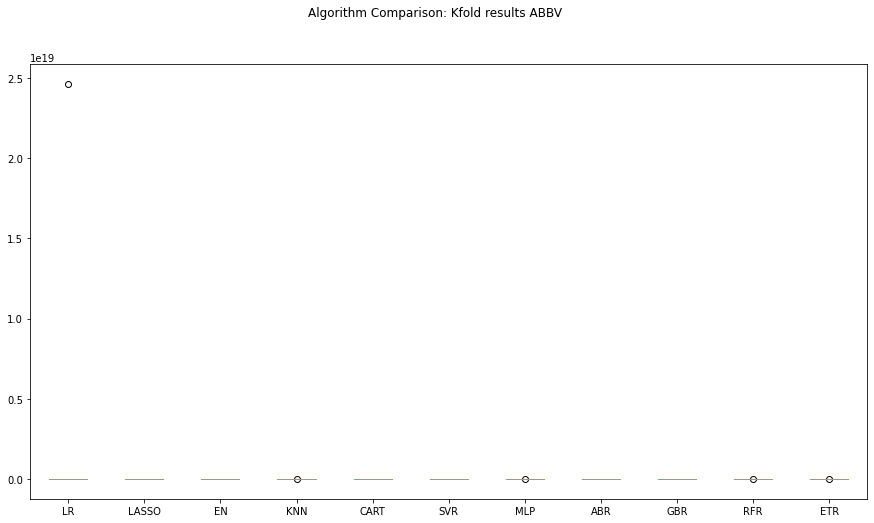

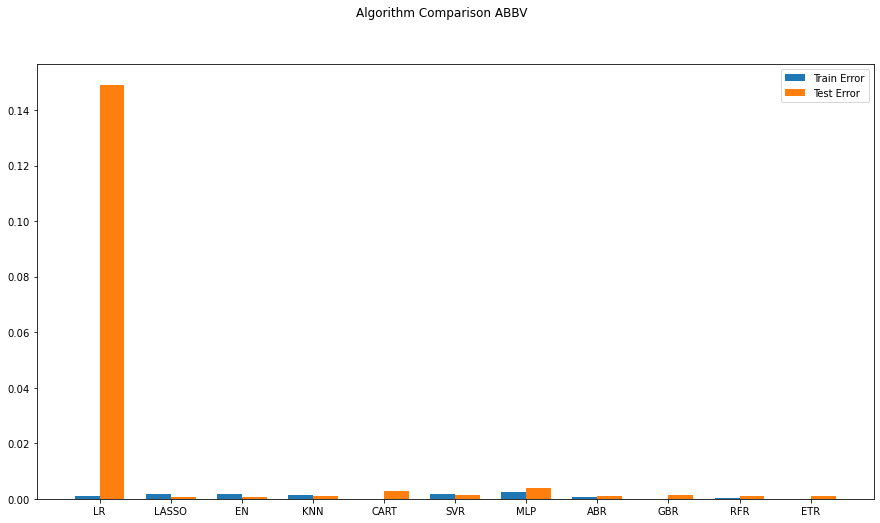

                AMGN       AZN      BIIB       BMY      CRXT      GILD  \
2016-11-21  0.001968  0.003758 -0.000687  0.000751 -0.020242  0.000289   
2016-11-29  0.003087 -0.023313 -0.050084 -0.006543 -0.020242 -0.001468   
2016-12-06 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242 -0.032581   
2016-12-13  0.022217  0.062951 -0.013068  0.020142 -0.020242  0.038597   
2016-12-20 -0.007781 -0.024855 -0.006248  0.033540 -0.020242 -0.010612   
...              ...       ...       ...       ...       ...       ...   
2020-10-14 -0.080881 -0.006372  0.011379  0.009554 -0.020242  0.019072   
2020-10-21 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242 -0.061826   
2020-10-28 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242 -0.025058   
2020-11-04  0.062477  0.076627  0.375658  0.124685 -0.020242  0.019395   
2020-11-11  0.043997  0.052728 -0.376600 -0.031202 -0.020242  0.003834   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-21 -0.000553  0.001402  

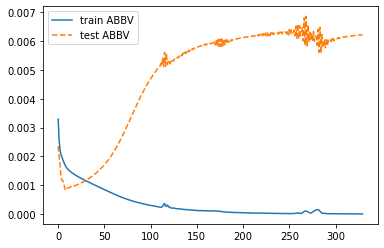

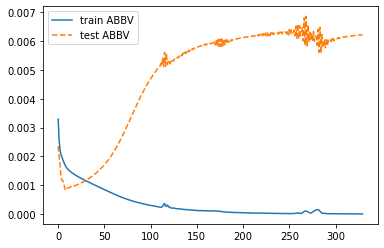

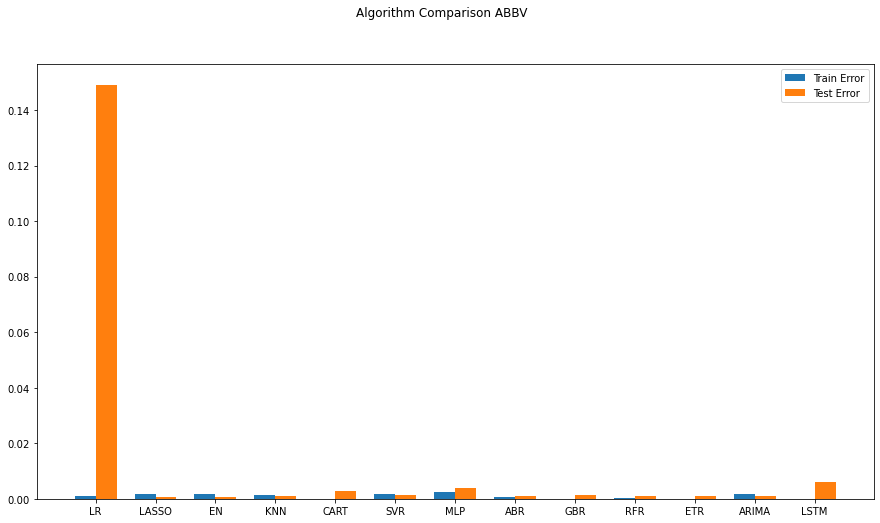

Best ARIMANone MSE=inf
0.0011062568782621532


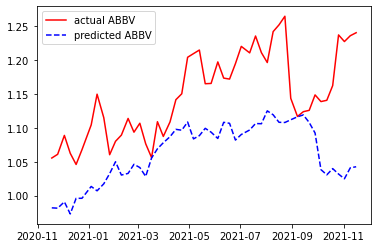

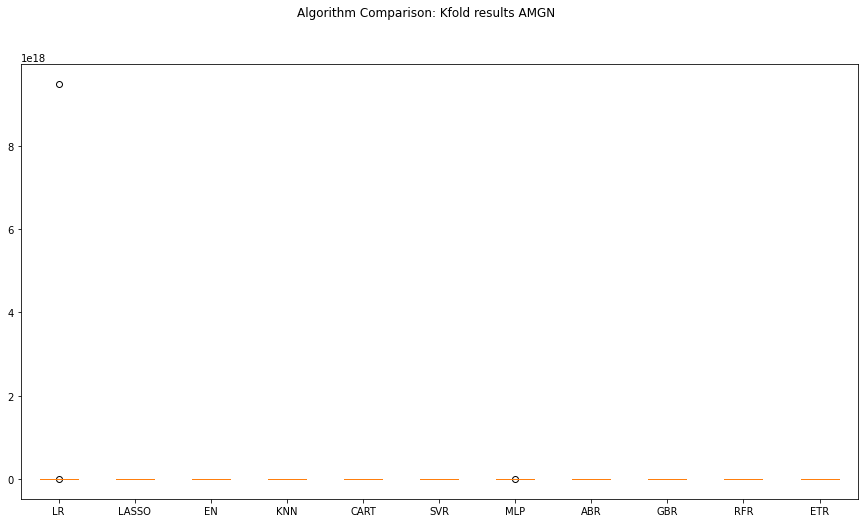

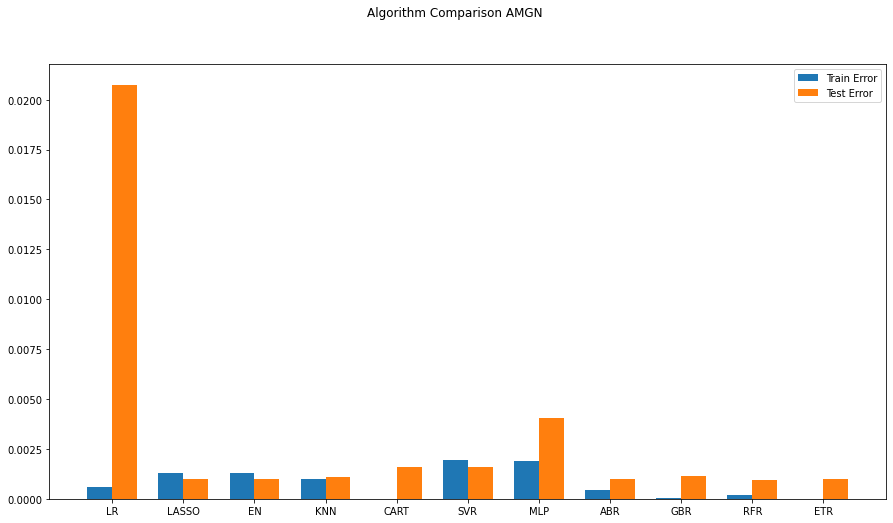

                ABBV       AZN      BIIB       BMY      CRXT      GILD  \
2016-11-21  0.003579  0.003758 -0.000687  0.000751 -0.020242  0.000289   
2016-11-29  0.019179 -0.023313 -0.050084 -0.006543 -0.020242 -0.001468   
2016-12-06  0.000487 -0.026557 -0.039100 -0.005873 -0.020242 -0.032581   
2016-12-13  0.005986  0.062951 -0.013068  0.020142 -0.020242  0.038597   
2016-12-20  0.002739 -0.024855 -0.006248  0.033540 -0.020242 -0.010612   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.006372  0.011379  0.009554 -0.020242  0.019072   
2020-10-21 -0.037647 -0.030930 -0.072119 -0.016029 -0.020242 -0.061826   
2020-10-28 -0.029381 -0.011507 -0.096144 -0.038548 -0.020242 -0.025058   
2020-11-04  0.160467  0.076627  0.375658  0.124685 -0.020242  0.019395   
2020-11-11  0.037897  0.052728 -0.376600 -0.031202 -0.020242  0.003834   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-21 -0.000553  0.001402  

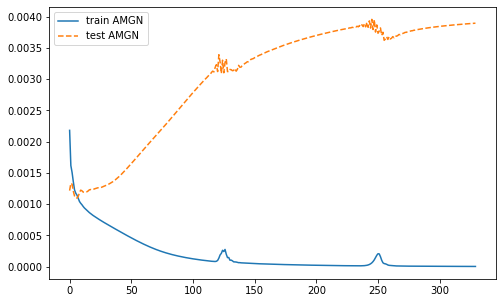

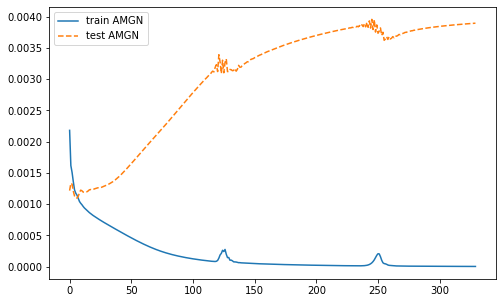

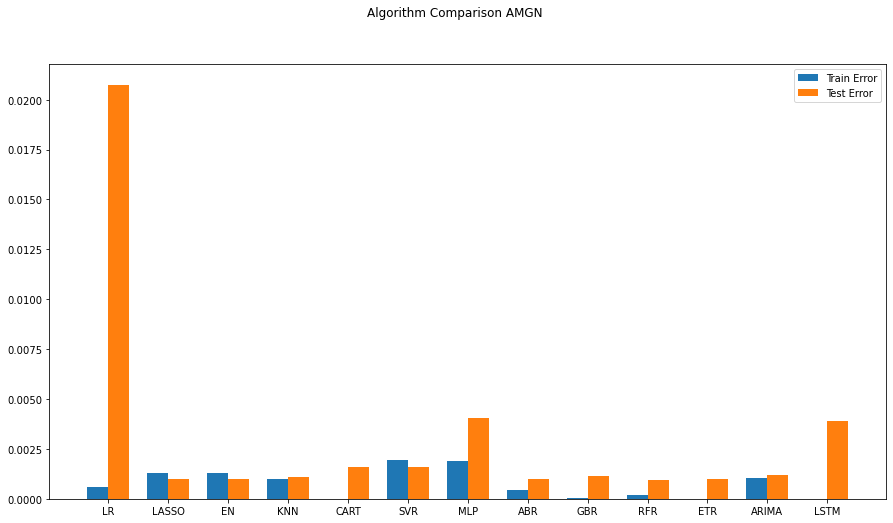

Best ARIMANone MSE=inf
0.0012106100179886598


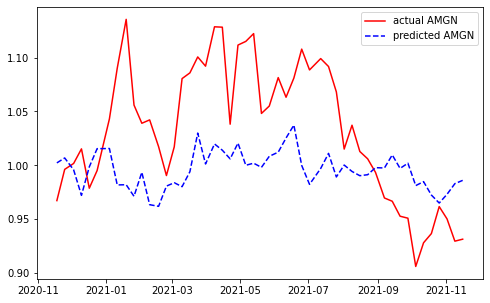

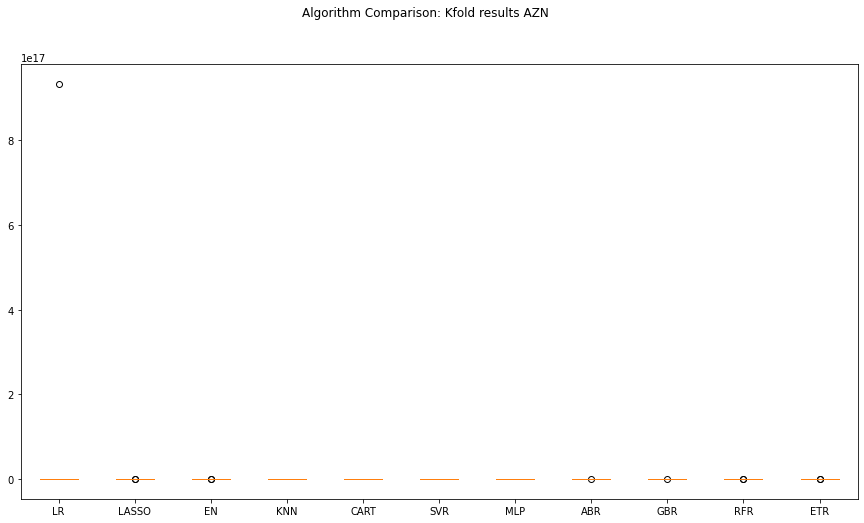

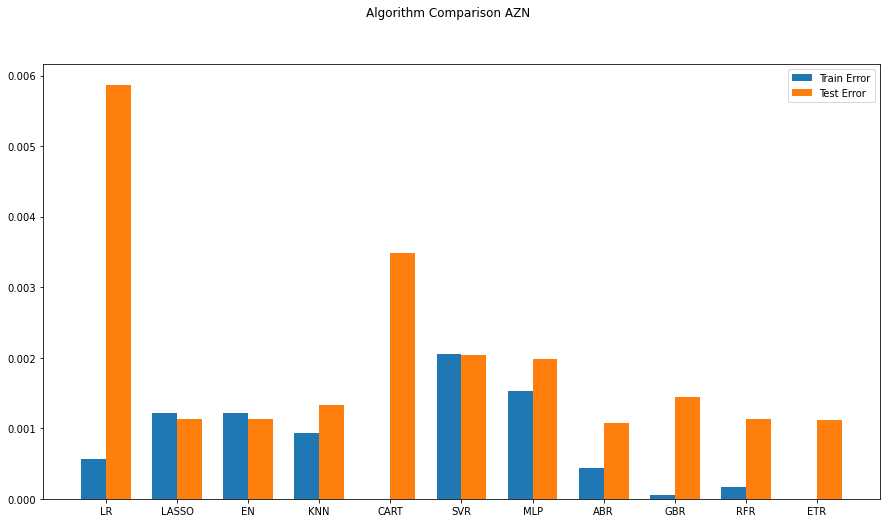

                ABBV      AMGN      BIIB       BMY      CRXT      GILD  \
2016-11-21  0.003579  0.001968 -0.000687  0.000751 -0.020242  0.000289   
2016-11-29  0.019179  0.003087 -0.050084 -0.006543 -0.020242 -0.001468   
2016-12-06  0.000487 -0.006114 -0.039100 -0.005873 -0.020242 -0.032581   
2016-12-13  0.005986  0.022217 -0.013068  0.020142 -0.020242  0.038597   
2016-12-20  0.002739 -0.007781 -0.006248  0.033540 -0.020242 -0.010612   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881  0.011379  0.009554 -0.020242  0.019072   
2020-10-21 -0.037647 -0.037208 -0.072119 -0.016029 -0.020242 -0.061826   
2020-10-28 -0.029381 -0.056555 -0.096144 -0.038548 -0.020242 -0.025058   
2020-11-04  0.160467  0.062477  0.375658  0.124685 -0.020242  0.019395   
2020-11-11  0.037897  0.043997 -0.376600 -0.031202 -0.020242  0.003834   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-21 -0.000553  0.001402  

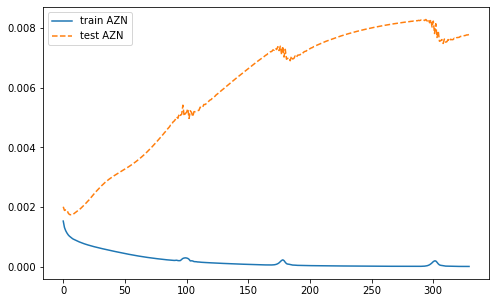

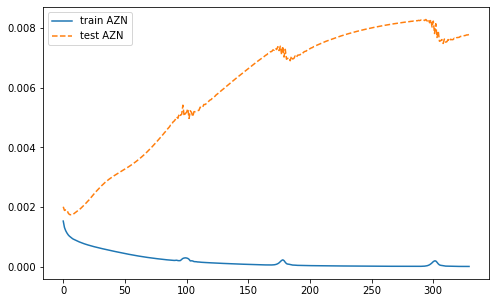

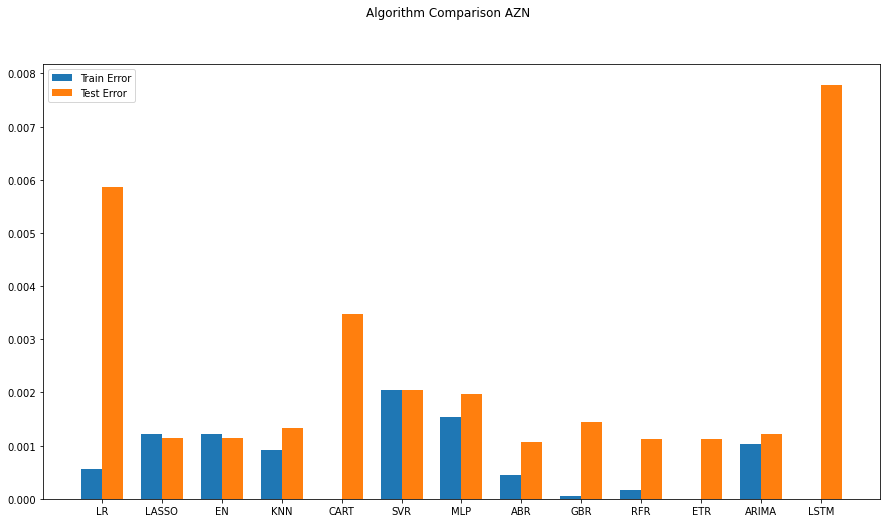

Best ARIMANone MSE=inf
0.0012239777537946736


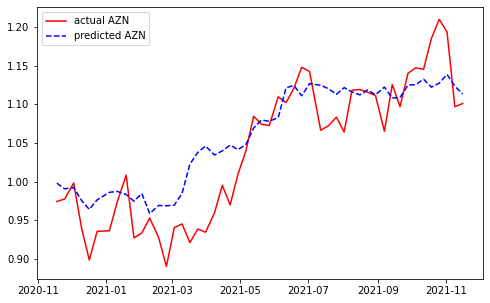

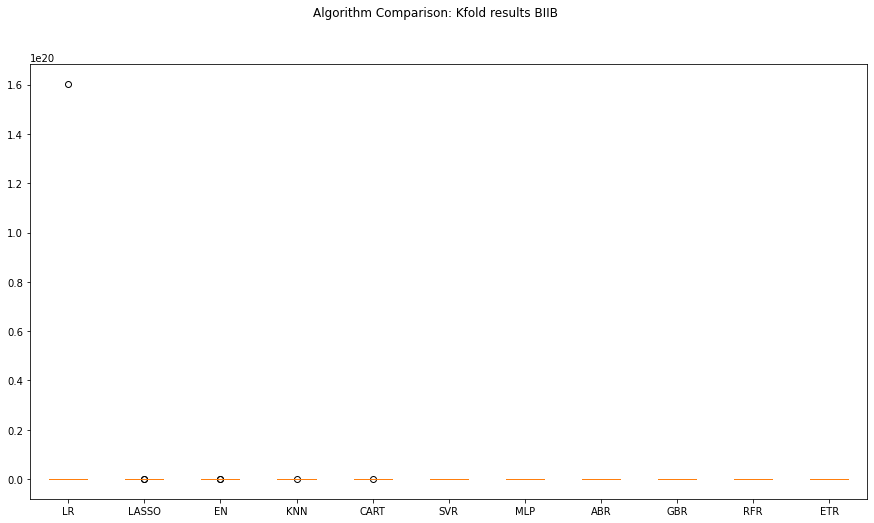

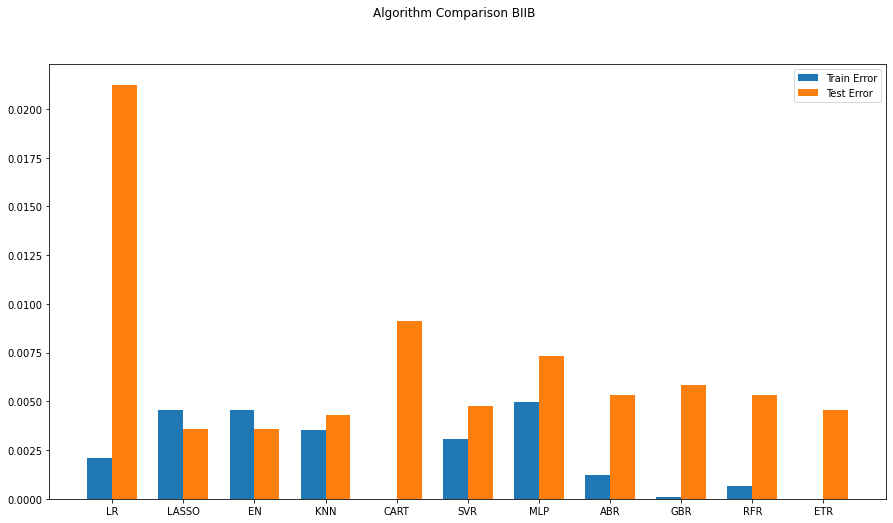

                ABBV      AMGN       AZN       BMY      CRXT      GILD  \
2016-11-21  0.003579  0.001968  0.003758  0.000751 -0.020242  0.000289   
2016-11-29  0.019179  0.003087 -0.023313 -0.006543 -0.020242 -0.001468   
2016-12-06  0.000487 -0.006114 -0.026557 -0.005873 -0.020242 -0.032581   
2016-12-13  0.005986  0.022217  0.062951  0.020142 -0.020242  0.038597   
2016-12-20  0.002739 -0.007781 -0.024855  0.033540 -0.020242 -0.010612   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.009554 -0.020242  0.019072   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.016029 -0.020242 -0.061826   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.038548 -0.020242 -0.025058   
2020-11-04  0.160467  0.062477  0.076627  0.124685 -0.020242  0.019395   
2020-11-11  0.037897  0.043997  0.052728 -0.031202 -0.020242  0.003834   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-21 -0.000553  0.001402  

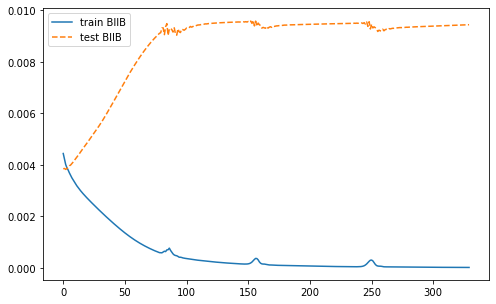

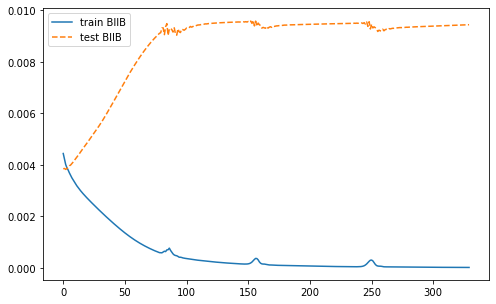

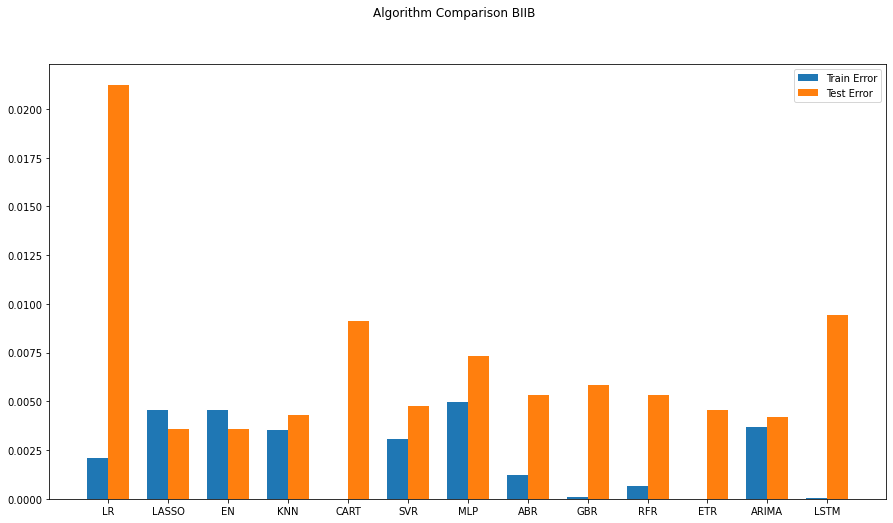

Best ARIMANone MSE=inf
0.004200164618917405


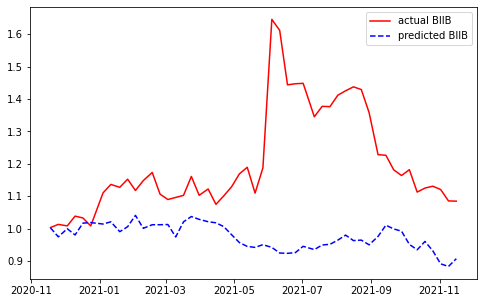

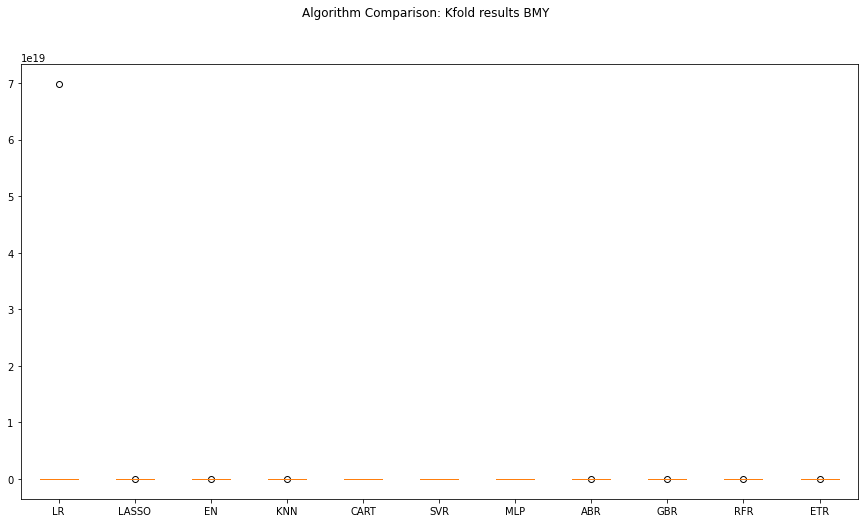

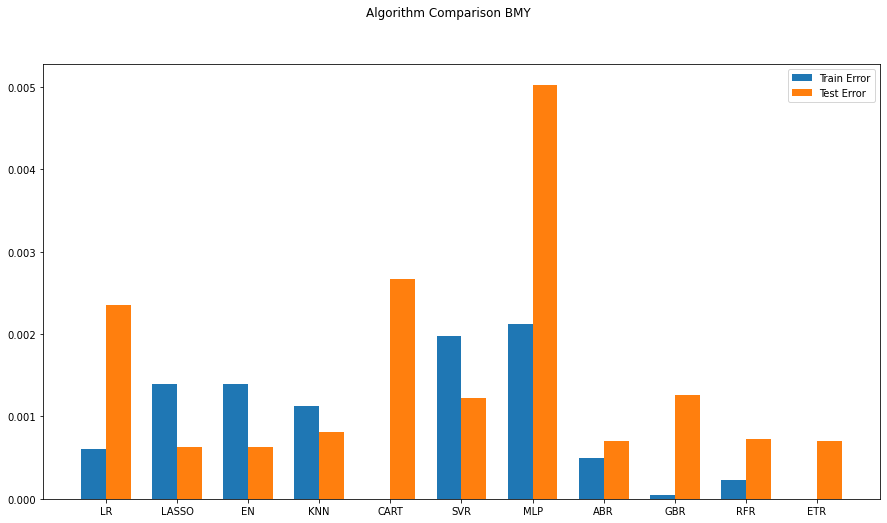

                ABBV      AMGN       AZN      BIIB      CRXT      GILD  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687 -0.020242  0.000289   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.020242 -0.001468   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.020242 -0.032581   
2016-12-13  0.005986  0.022217  0.062951 -0.013068 -0.020242  0.038597   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248 -0.020242 -0.010612   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379 -0.020242  0.019072   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.020242 -0.061826   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.020242 -0.025058   
2020-11-04  0.160467  0.062477  0.076627  0.375658 -0.020242  0.019395   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.020242  0.003834   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-21 -0.000553  0.001402  

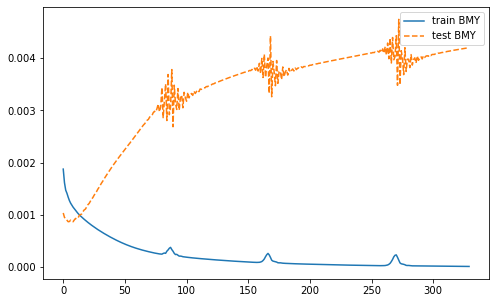

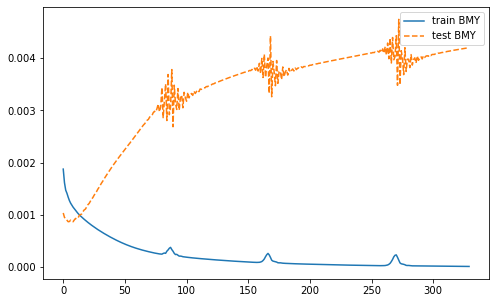

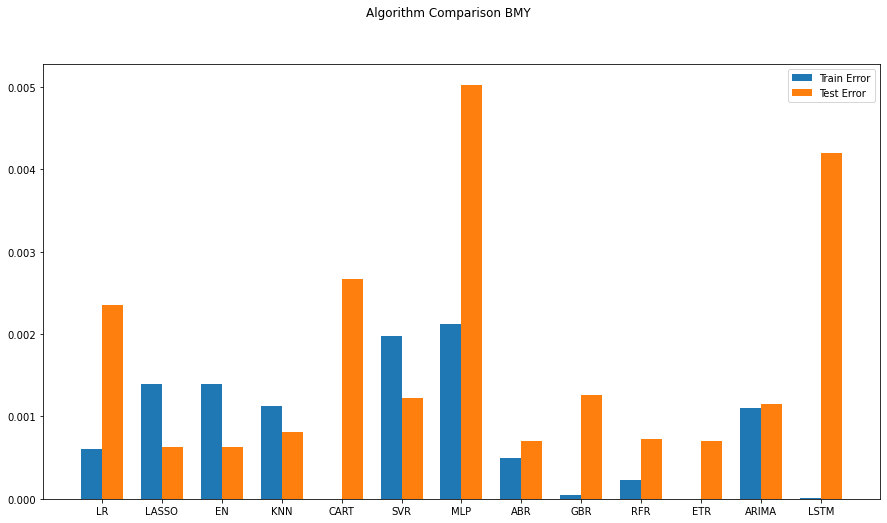

Best ARIMANone MSE=inf
0.0011502582072931405


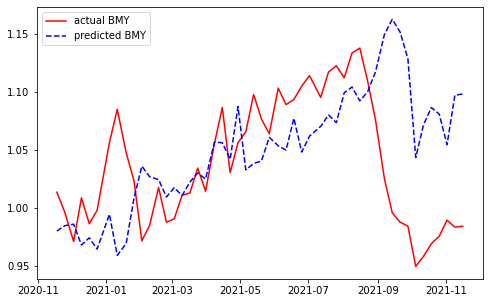

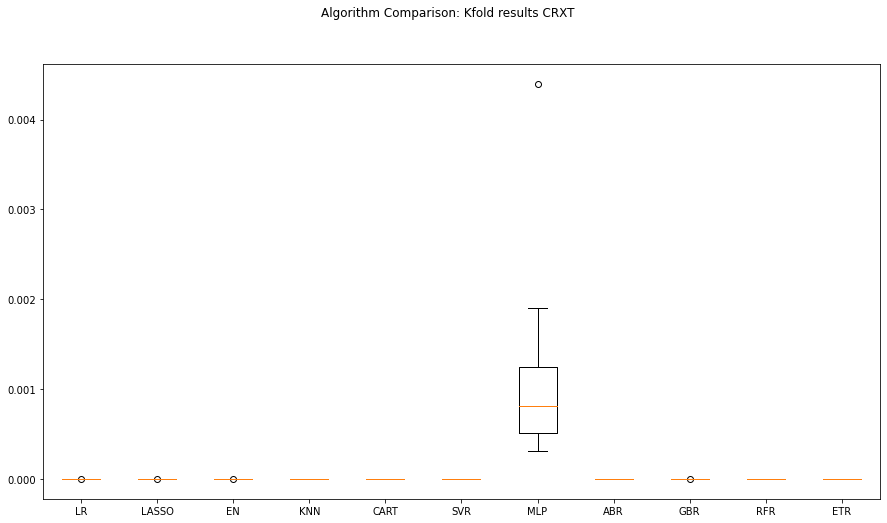

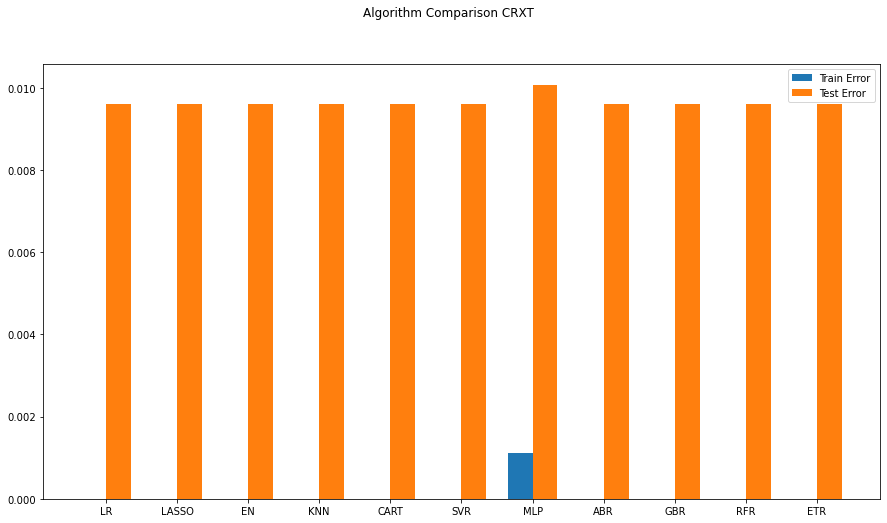

                ABBV      AMGN       AZN      BIIB       BMY      GILD  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751  0.000289   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.001468   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.032581   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142  0.038597   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.010612   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554  0.019072   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.061826   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.025058   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685  0.019395   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202  0.003834   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-21 -0.000553  0.001402  

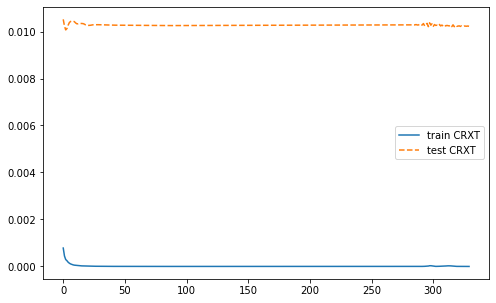

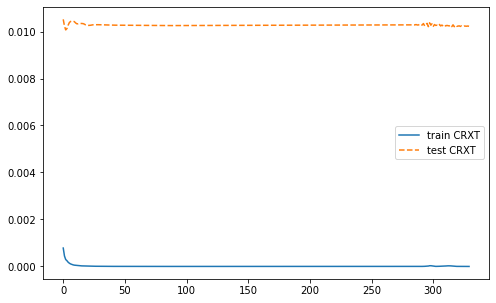

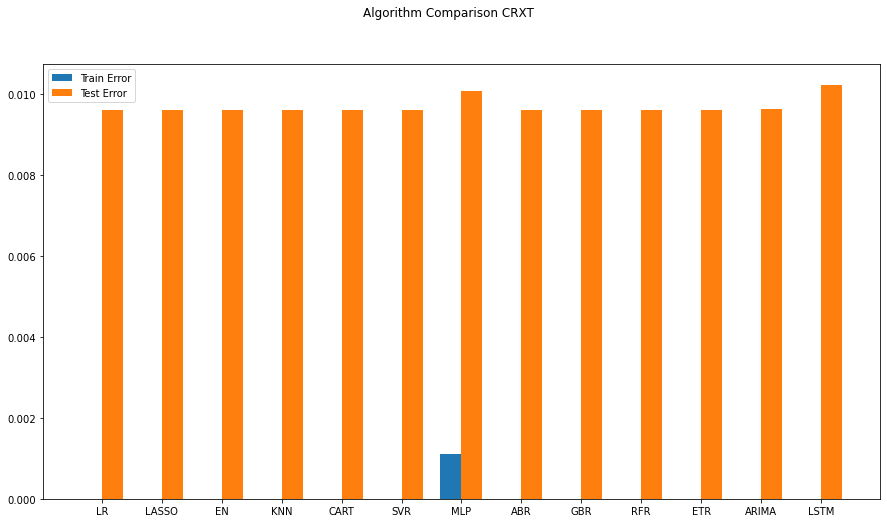

Best ARIMANone MSE=inf
0.00962727226365929


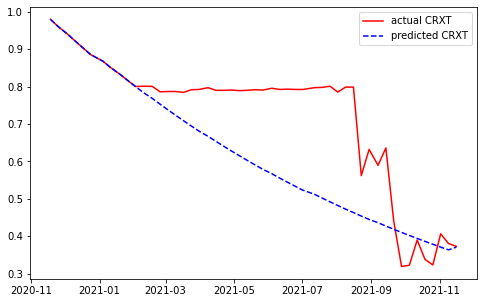

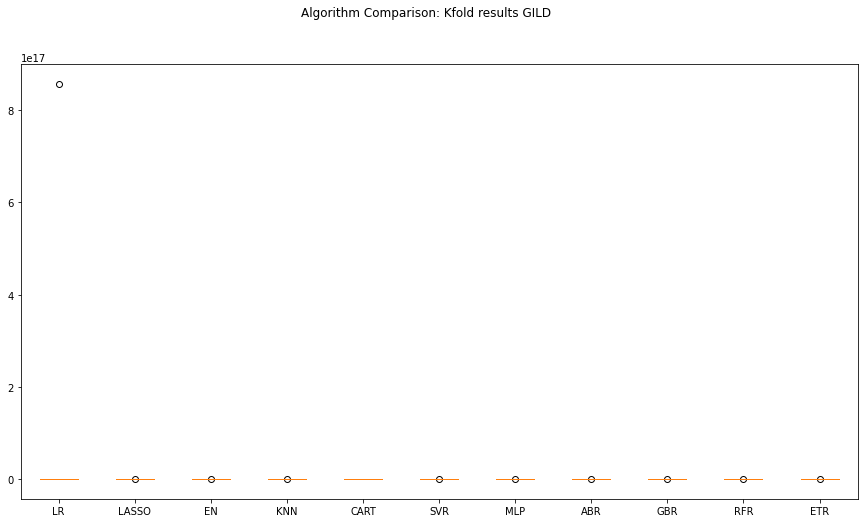

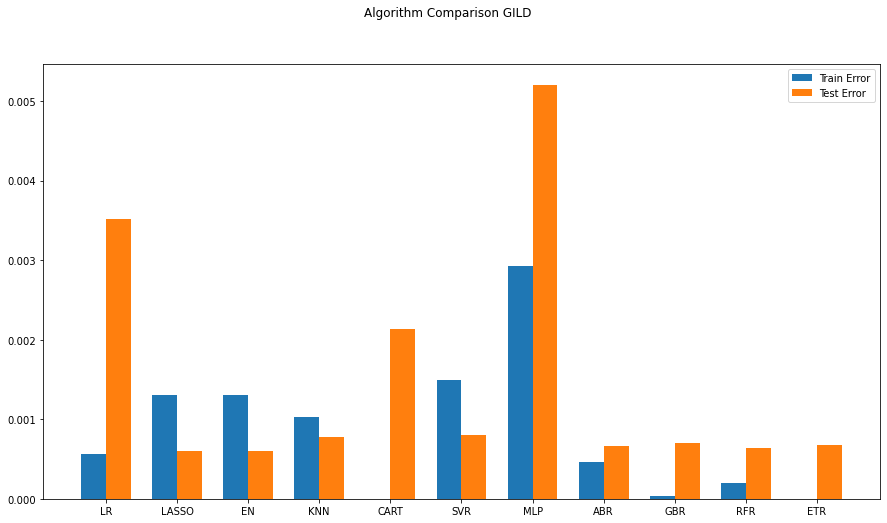

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751 -0.020242   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.020242   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142 -0.020242   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554 -0.020242   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685 -0.020242   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202 -0.020242   

                GRFS       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-21 -0.000553  0.001402  

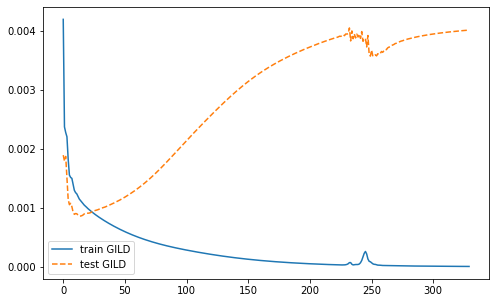

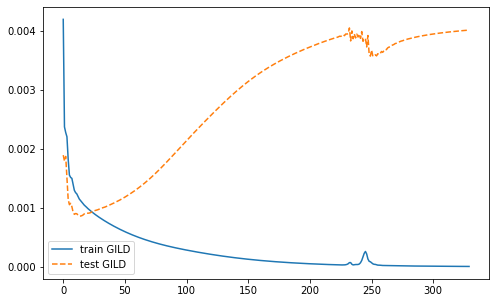

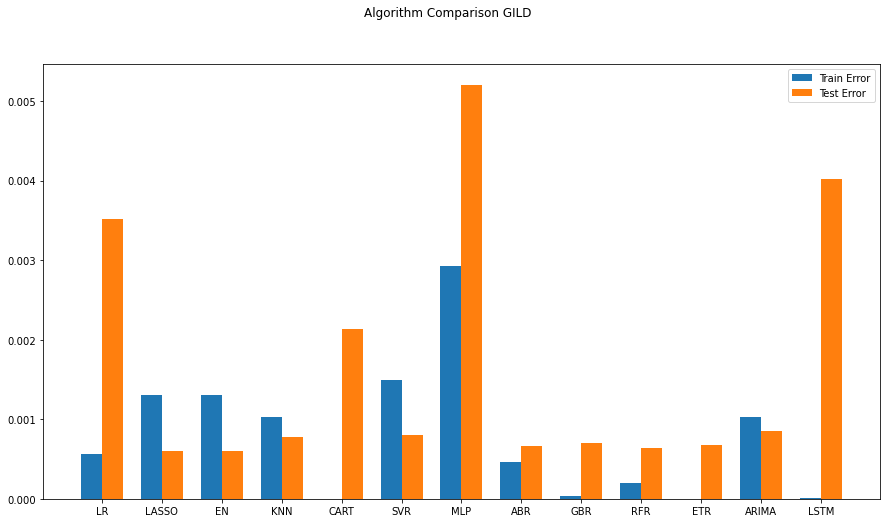

Best ARIMANone MSE=inf
0.0008477110621807194


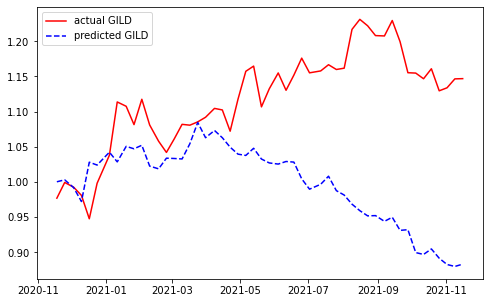

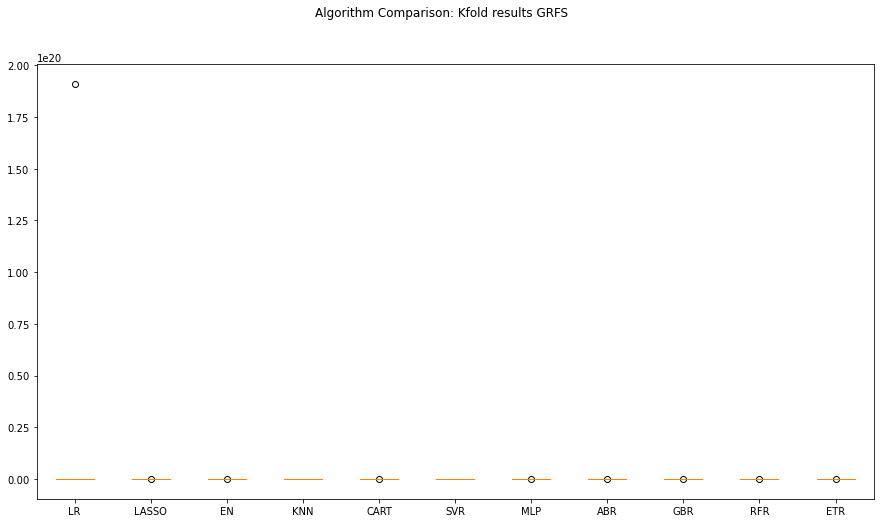

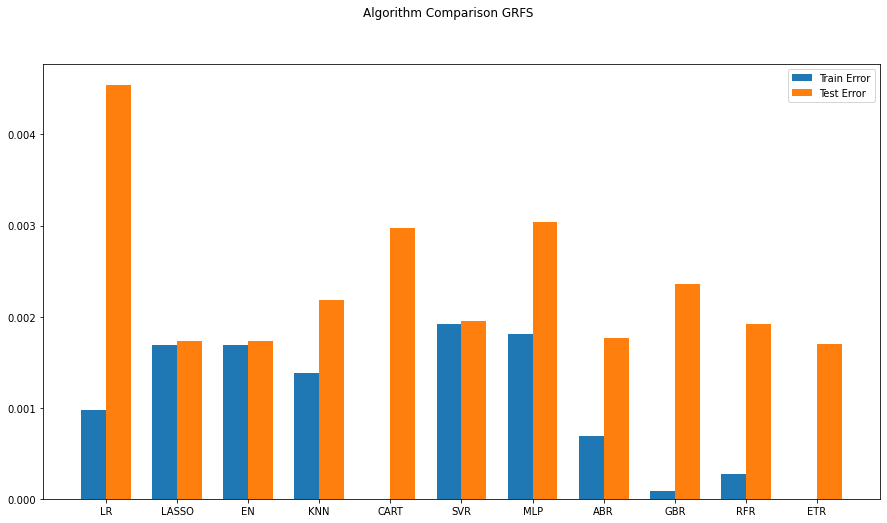

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751 -0.020242   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.020242   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142 -0.020242   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554 -0.020242   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685 -0.020242   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202 -0.020242   

                GILD       GSK       HCM      HZNP  ...       NVS       OGN  \
2016-11-21  0.000289  0.001402  

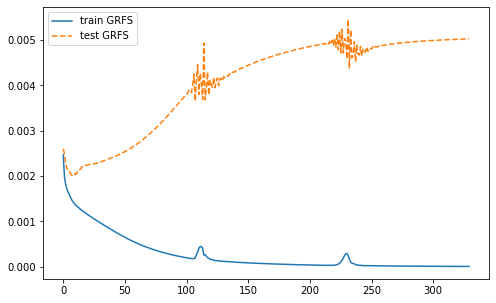

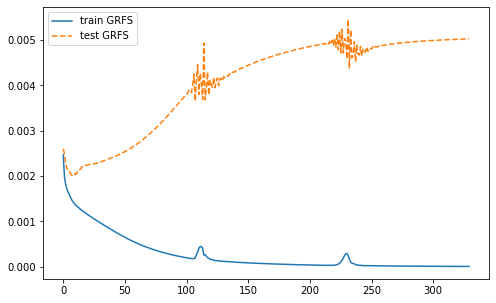

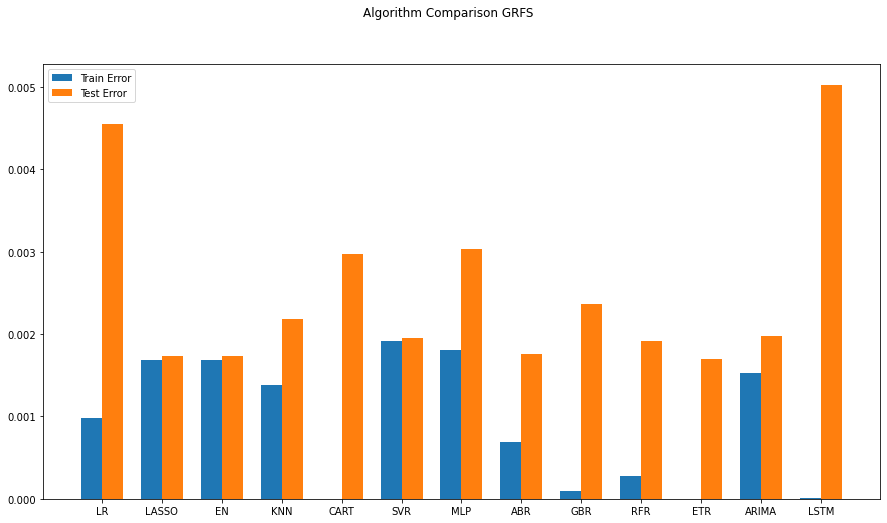

Best ARIMANone MSE=inf
0.001975109025777837


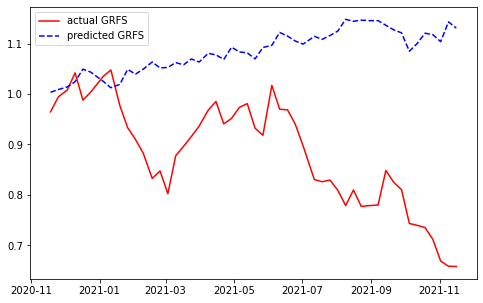

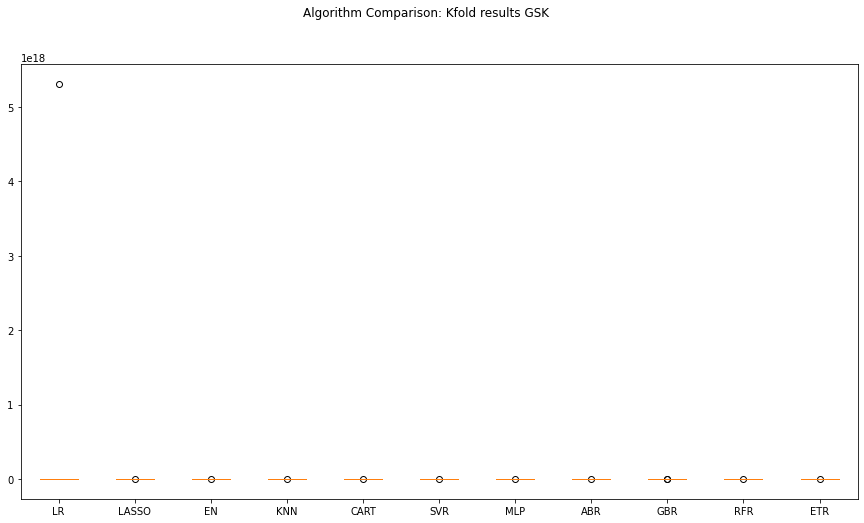

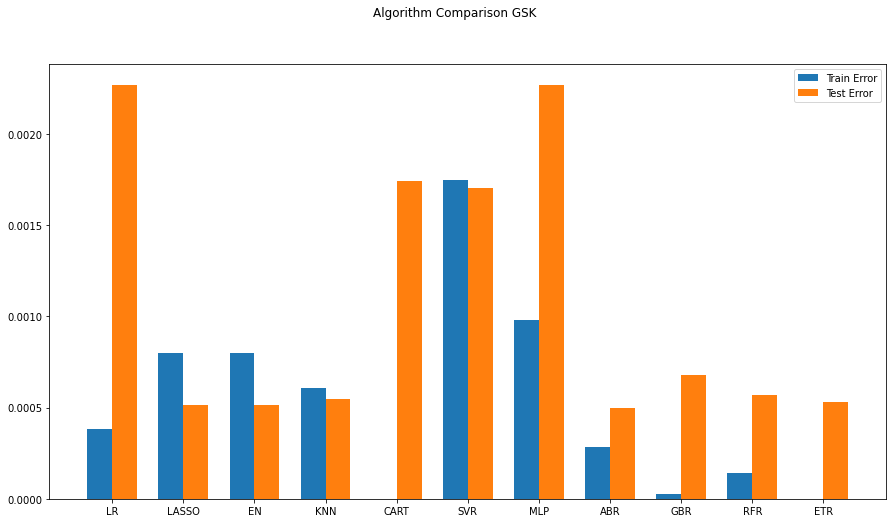

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751 -0.020242   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.020242   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142 -0.020242   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554 -0.020242   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685 -0.020242   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202 -0.020242   

                GILD      GRFS       HCM      HZNP  ...       NVS       OGN  \
2016-11-21  0.000289 -0.000553  

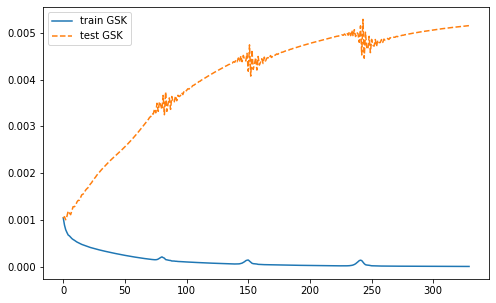

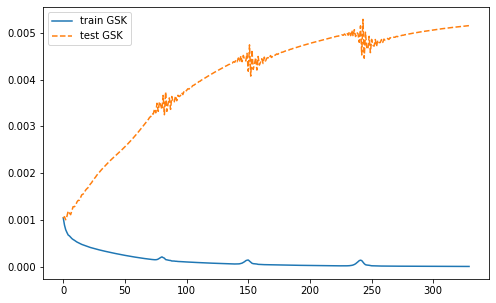

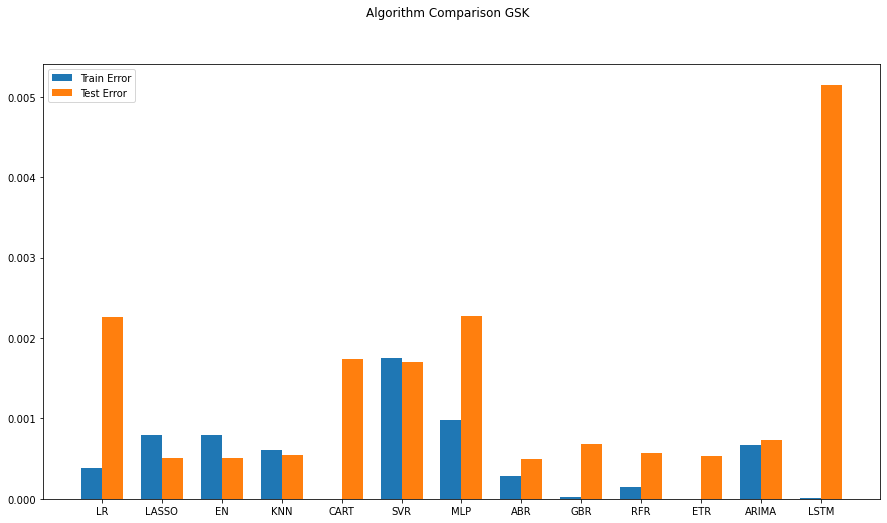

Best ARIMANone MSE=inf
0.0007338529997035759


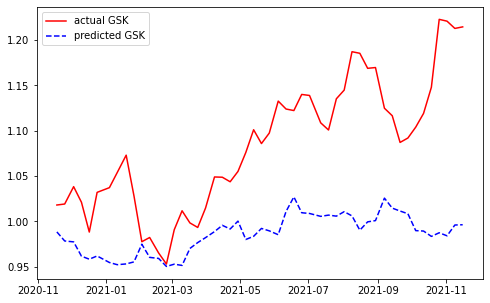

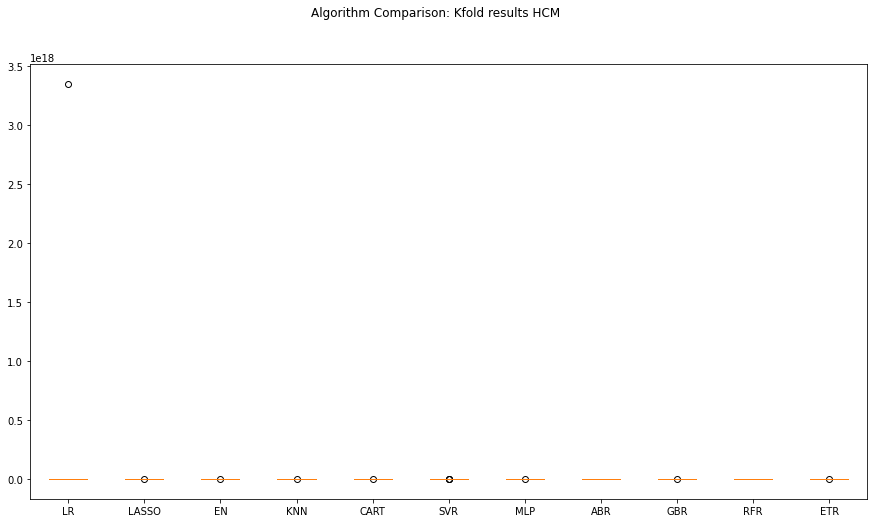

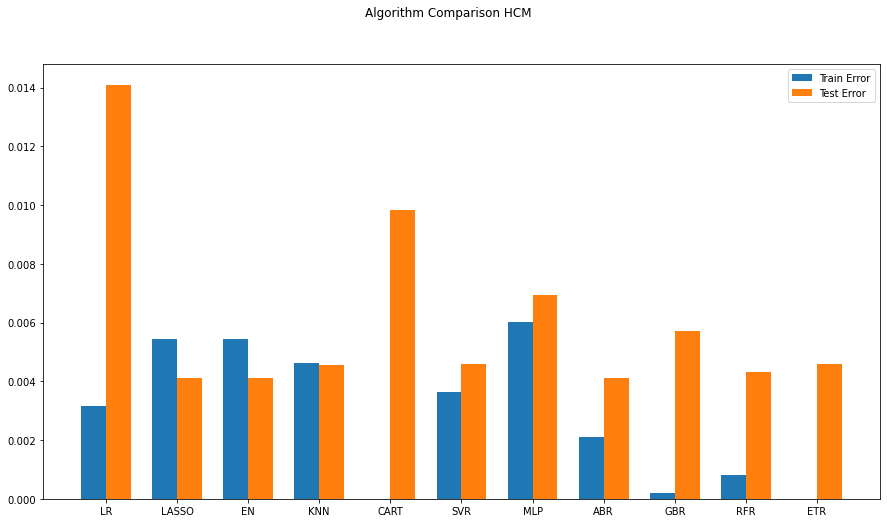

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751 -0.020242   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.020242   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142 -0.020242   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554 -0.020242   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685 -0.020242   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202 -0.020242   

                GILD      GRFS       GSK      HZNP  ...       NVS       OGN  \
2016-11-21  0.000289 -0.000553  

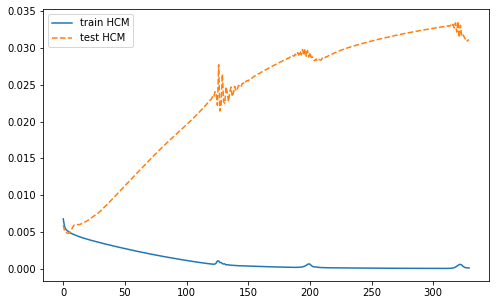

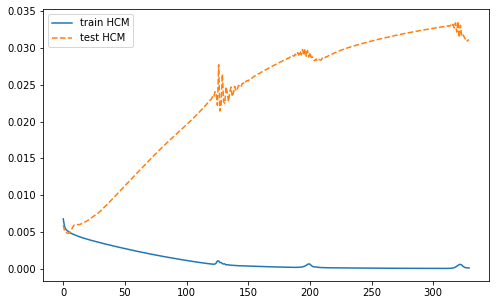

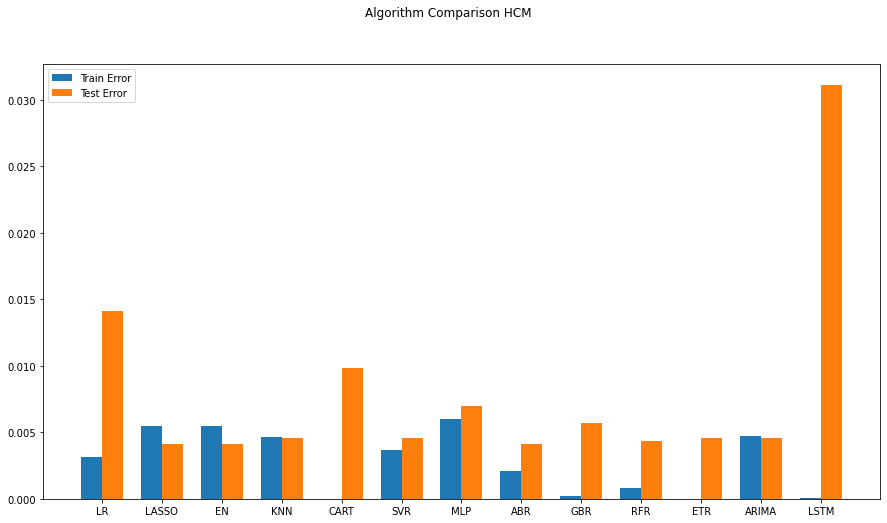

Best ARIMANone MSE=inf
0.004584545152030427


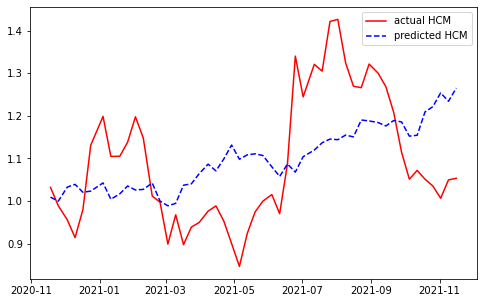

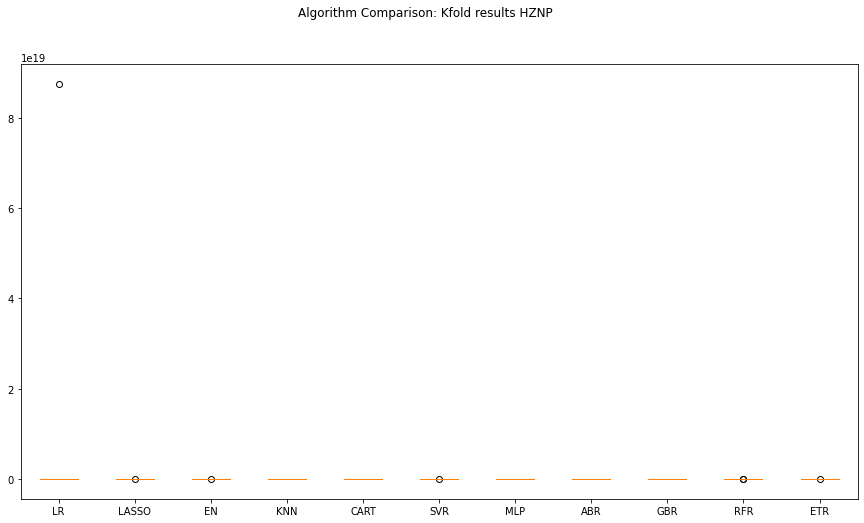

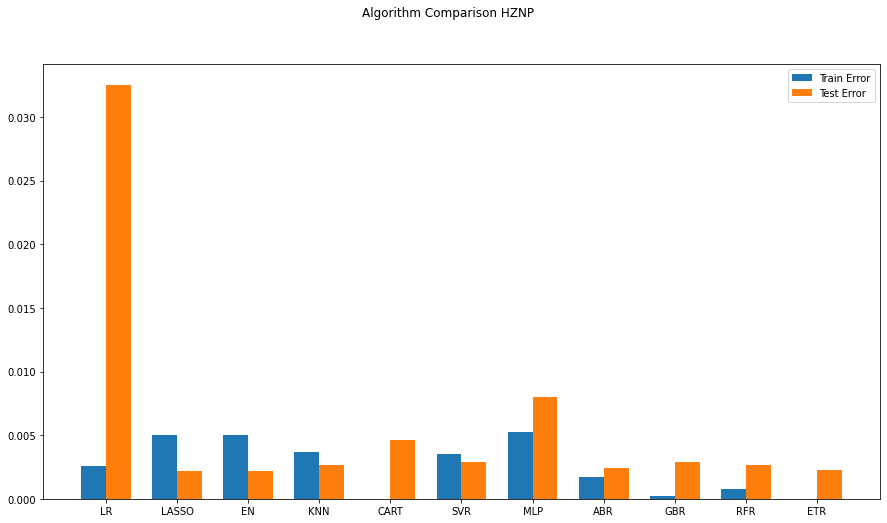

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751 -0.020242   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.020242   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142 -0.020242   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554 -0.020242   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685 -0.020242   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-21  0.000289 -0.000553  

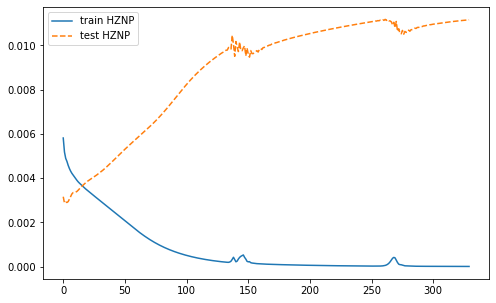

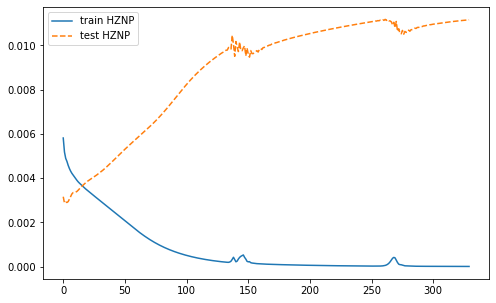

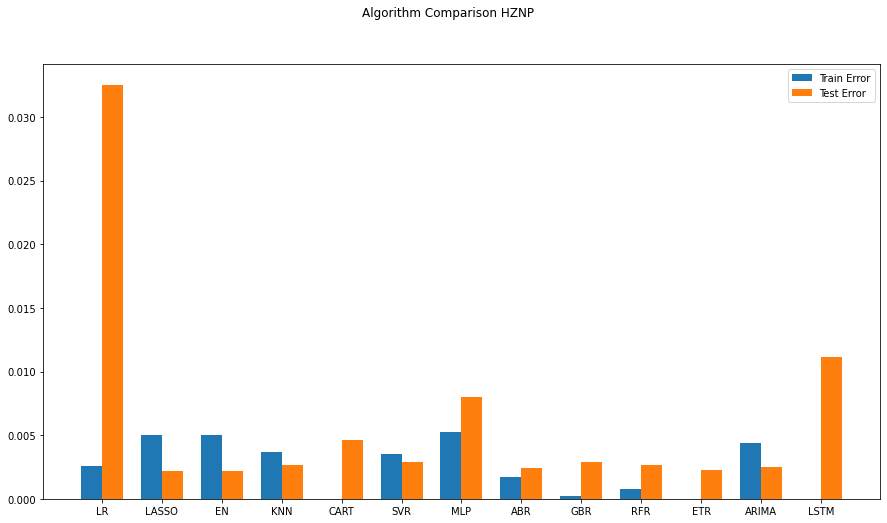

Best ARIMANone MSE=inf
0.002489718647090353


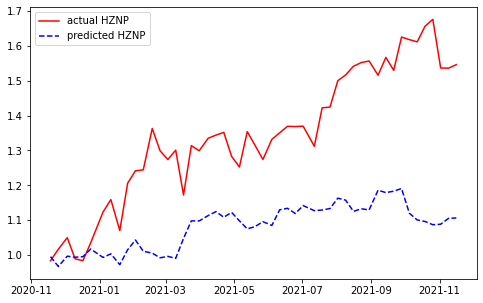

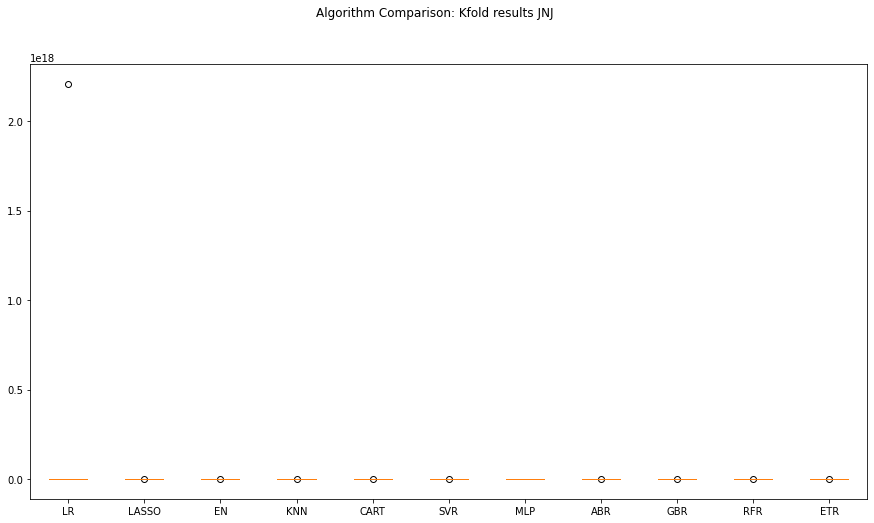

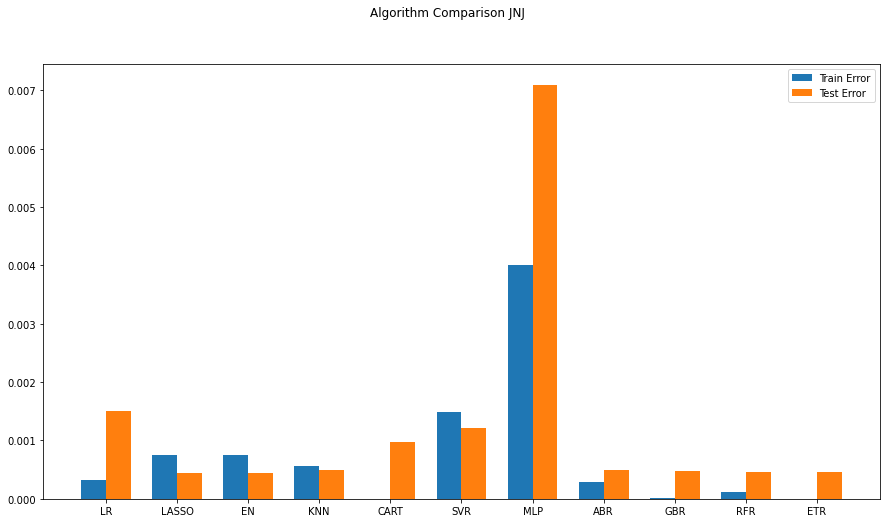

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751 -0.020242   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.020242   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142 -0.020242   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554 -0.020242   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685 -0.020242   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-21  0.000289 -0.000553  

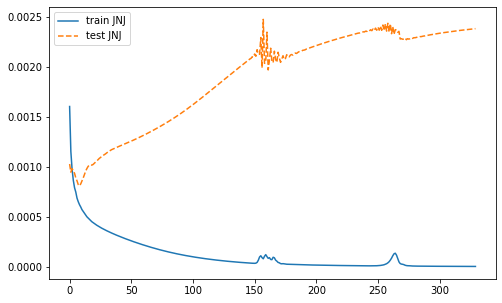

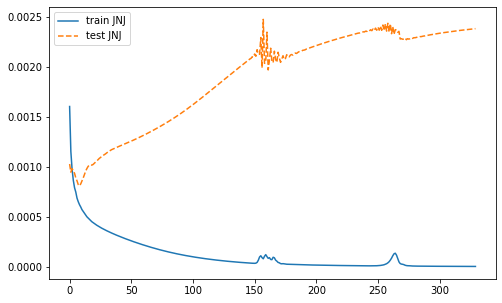

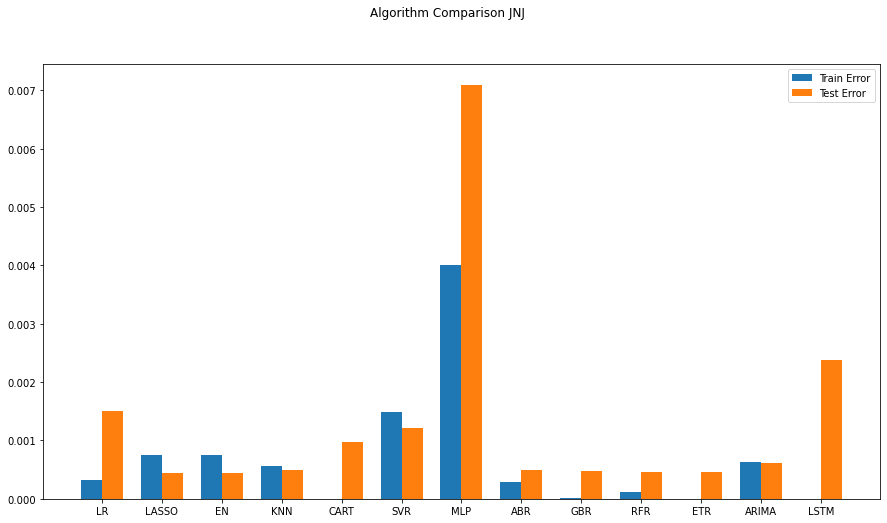

Best ARIMANone MSE=inf
0.0006113210699296037


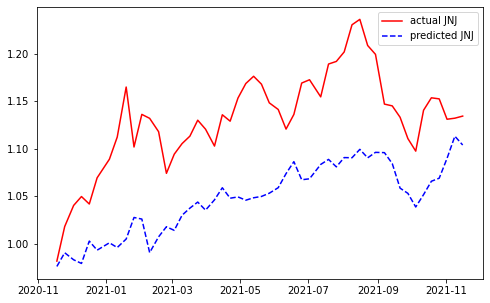

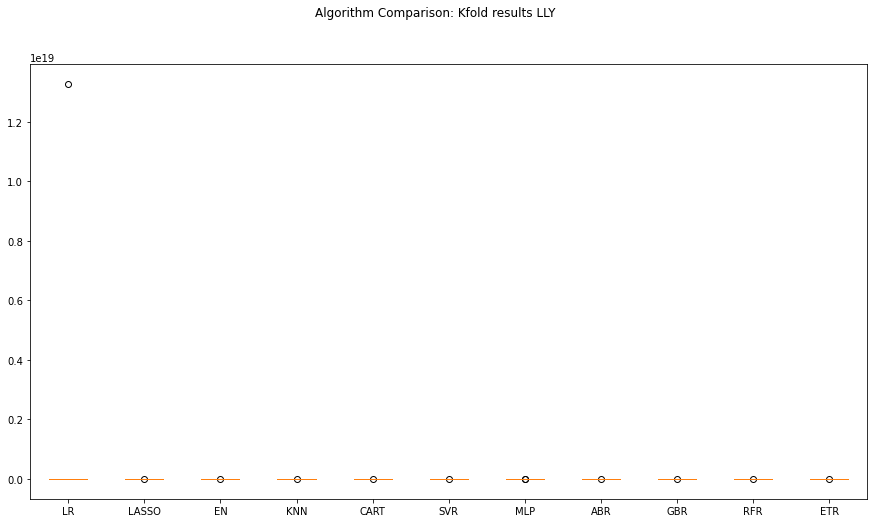

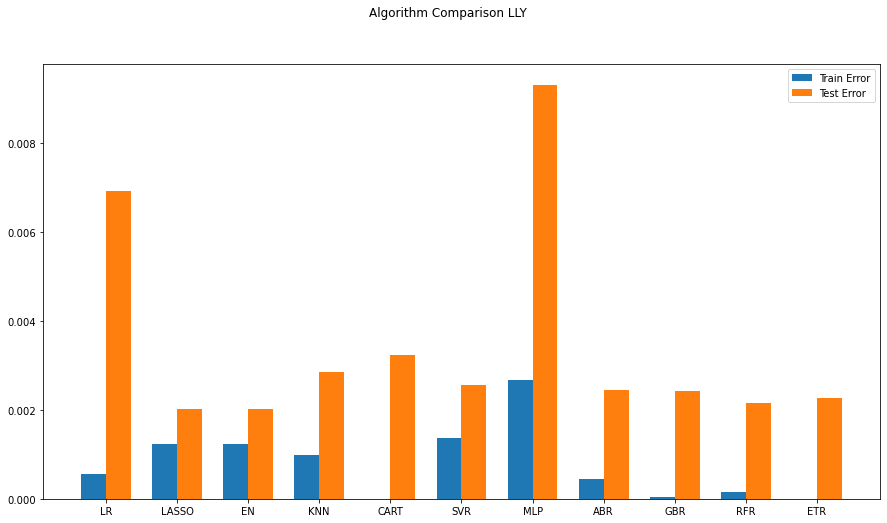

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751 -0.020242   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.020242   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142 -0.020242   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554 -0.020242   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685 -0.020242   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-21  0.000289 -0.000553  

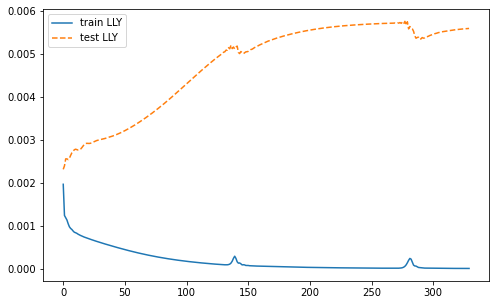

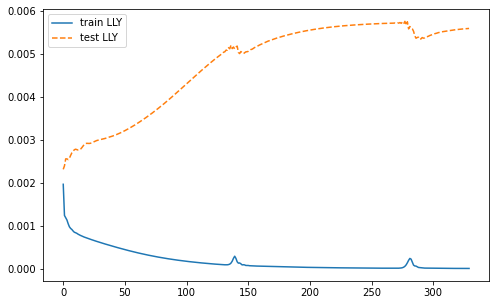

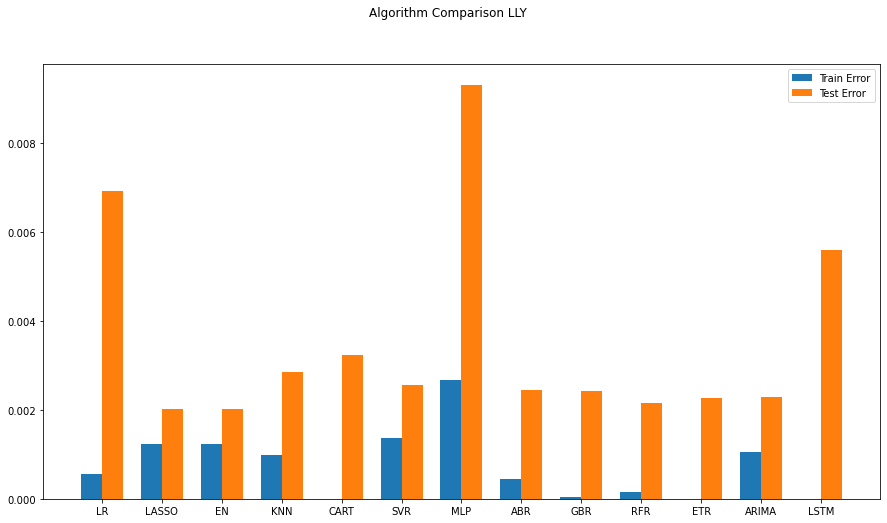

Best ARIMANone MSE=inf
0.002292547449184238


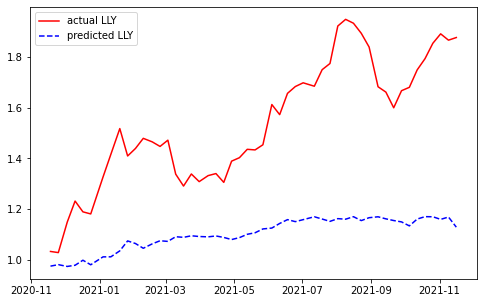

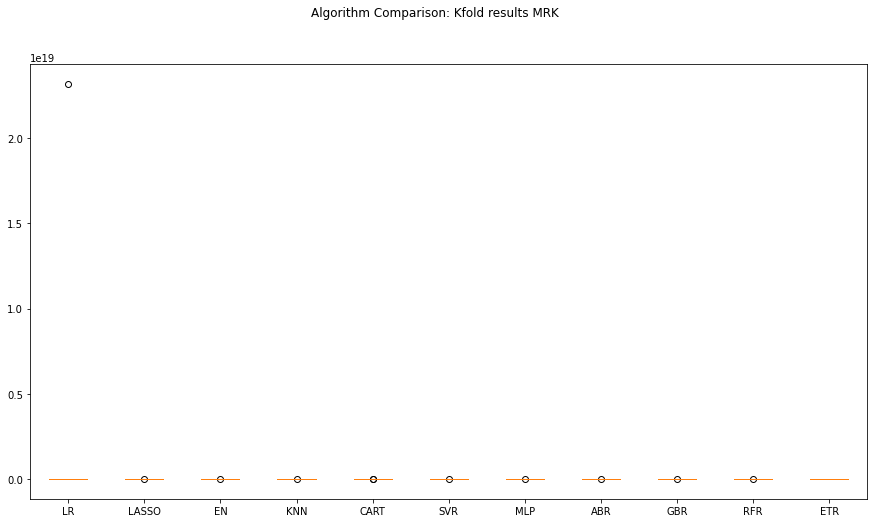

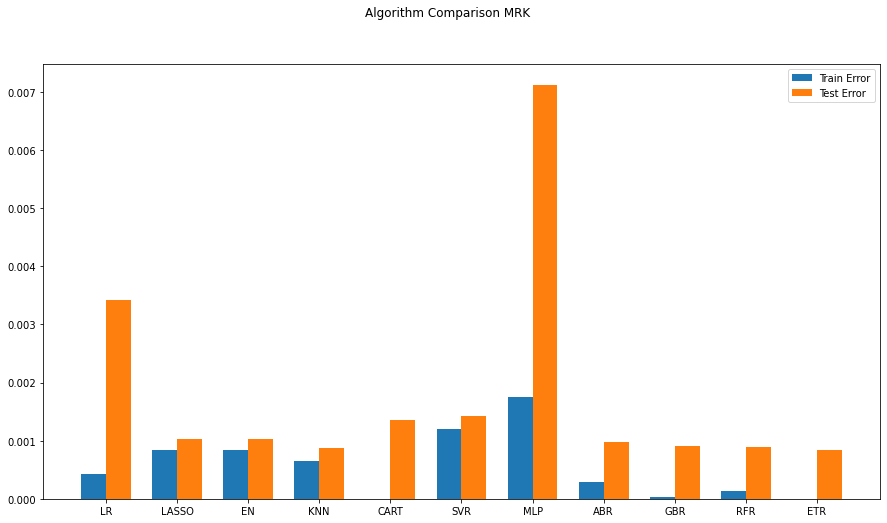

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751 -0.020242   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.020242   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142 -0.020242   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554 -0.020242   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685 -0.020242   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-21  0.000289 -0.000553  

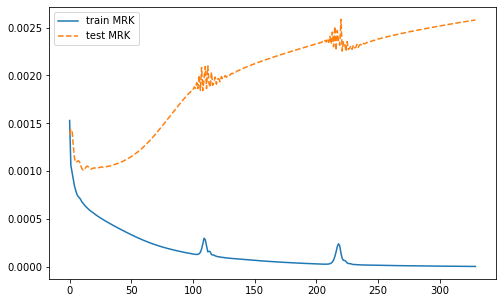

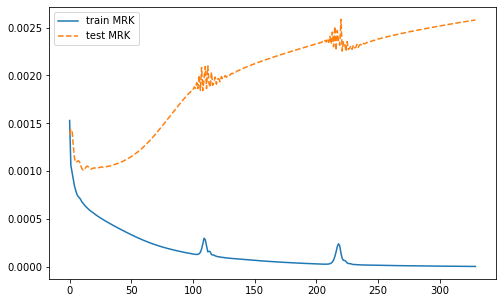

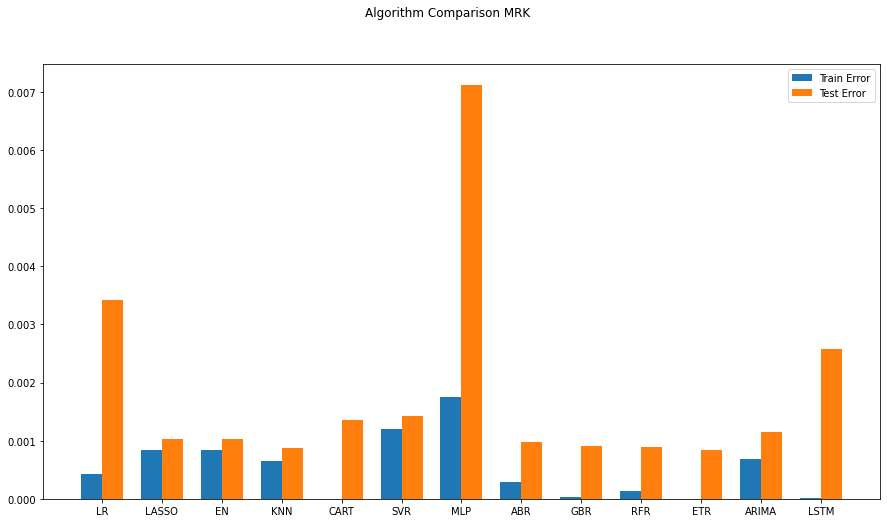

Best ARIMANone MSE=inf
0.0011526775656068064


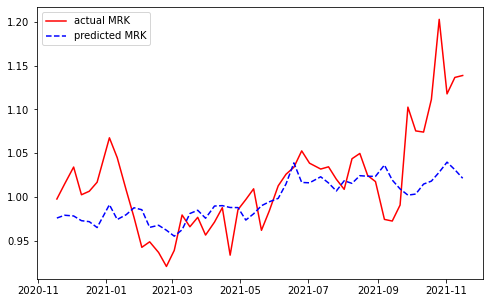

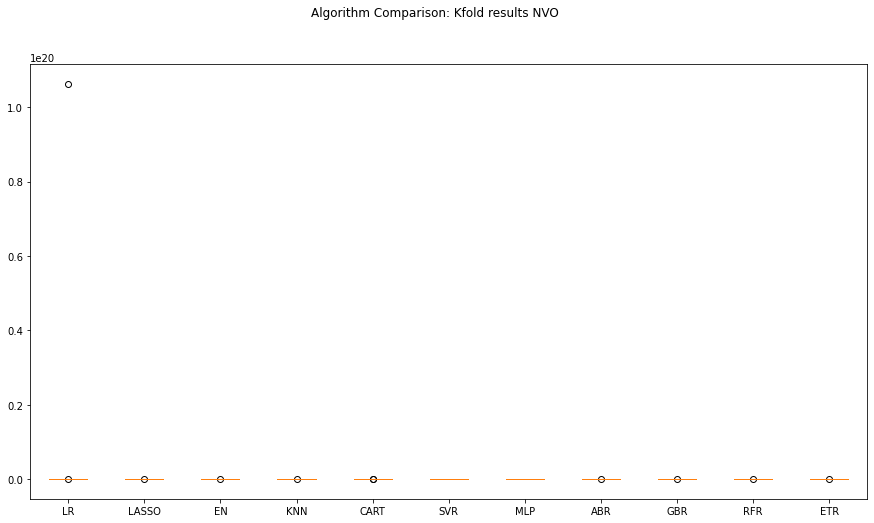

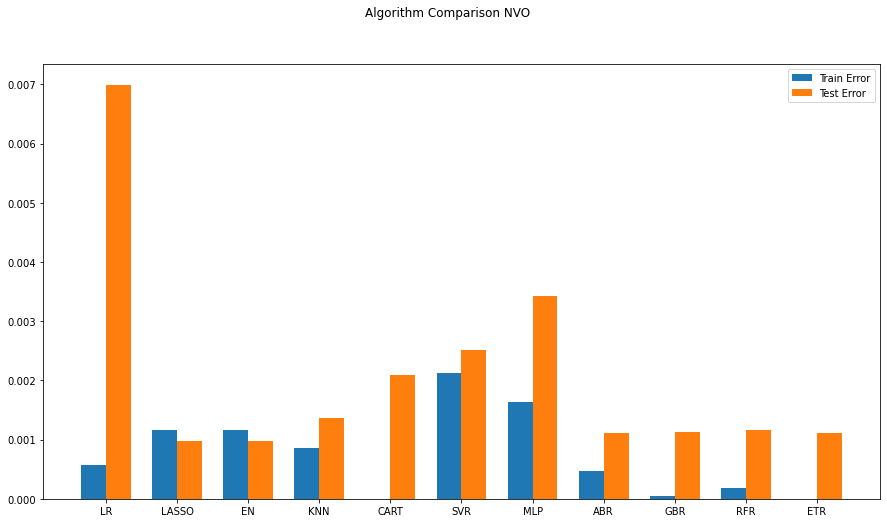

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751 -0.020242   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.020242   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142 -0.020242   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554 -0.020242   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685 -0.020242   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVS       OGN  \
2016-11-21  0.000289 -0.000553  

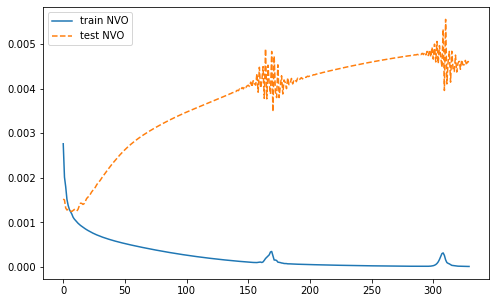

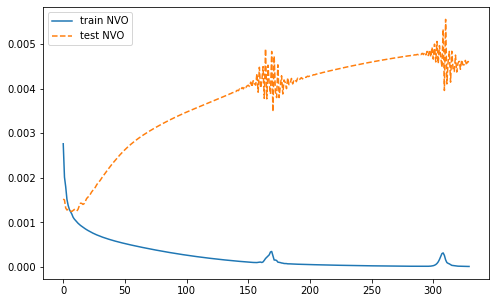

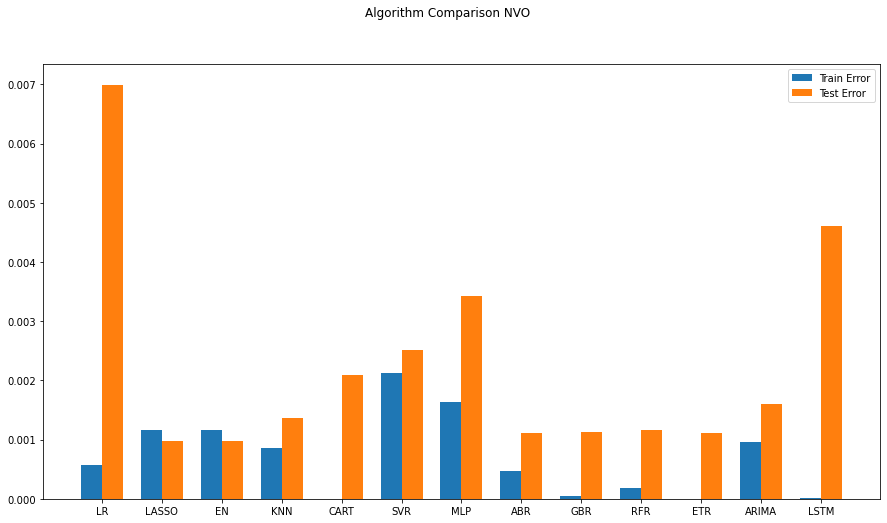

Best ARIMANone MSE=inf
0.001598609926379524


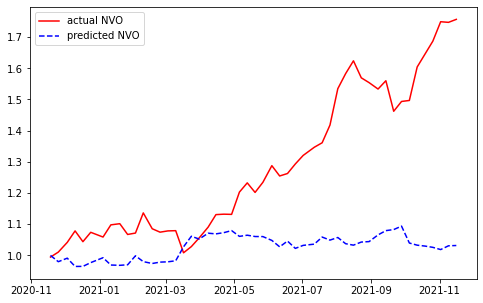

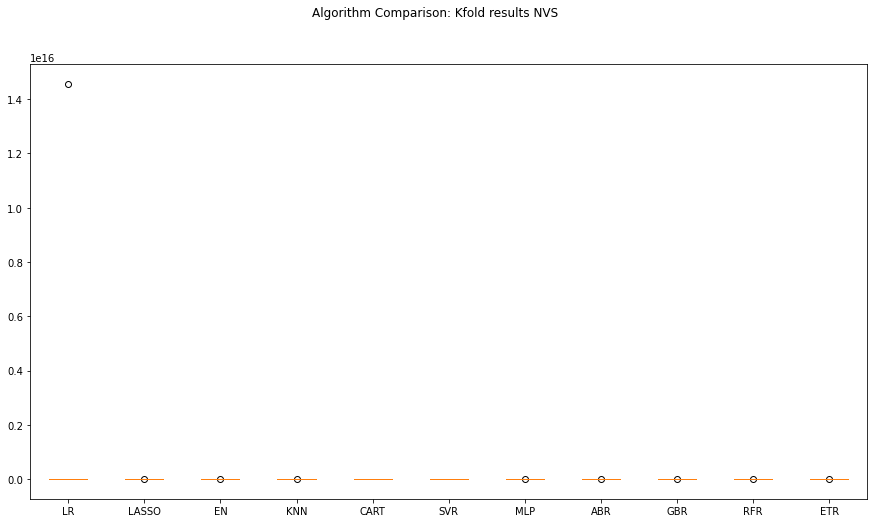

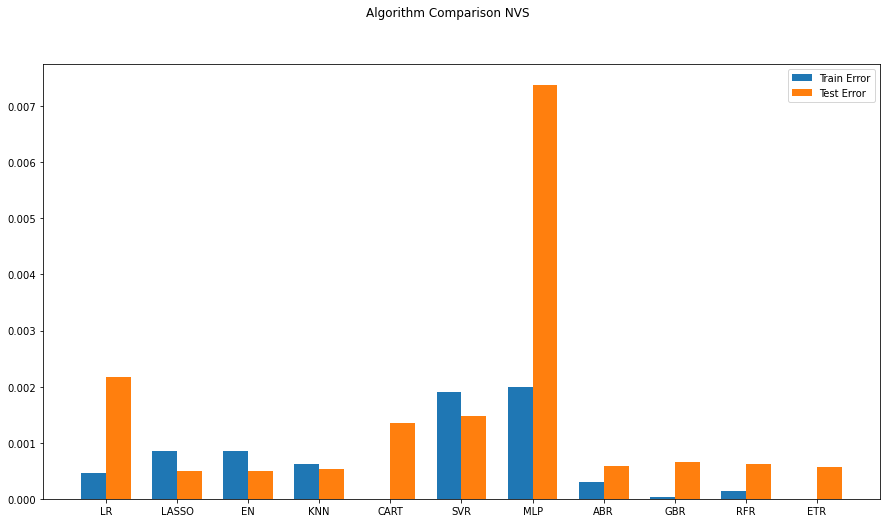

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751 -0.020242   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.020242   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142 -0.020242   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554 -0.020242   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685 -0.020242   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       OGN  \
2016-11-21  0.000289 -0.000553  

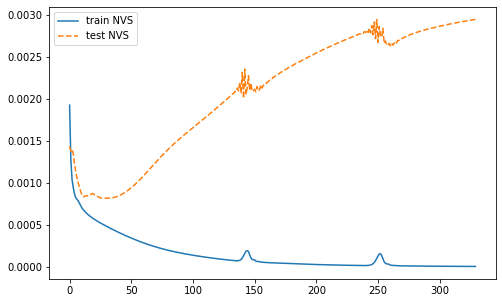

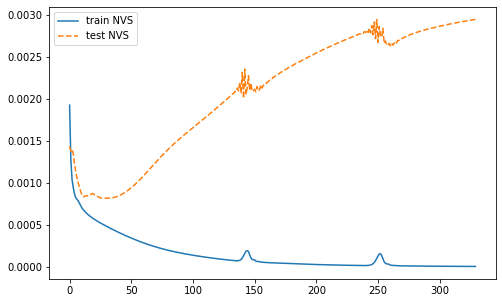

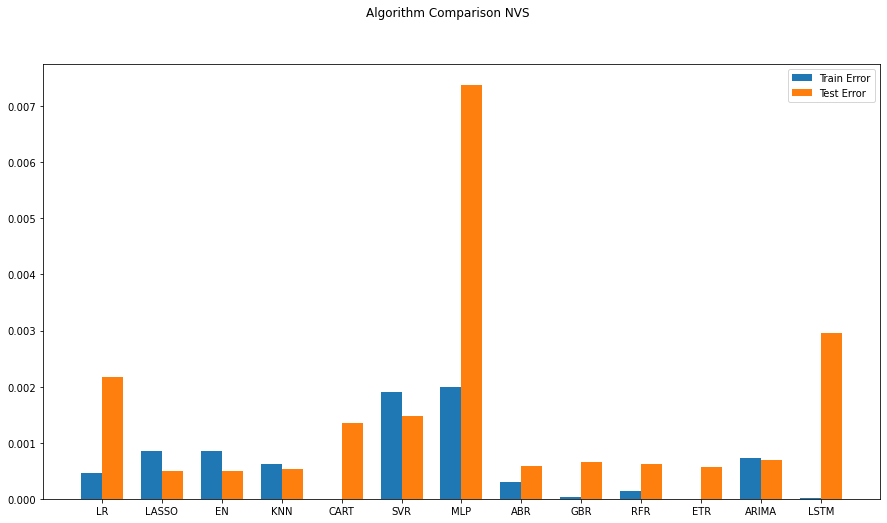

Best ARIMANone MSE=inf
0.0006888558388509309


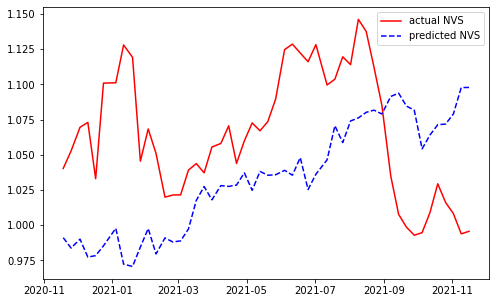

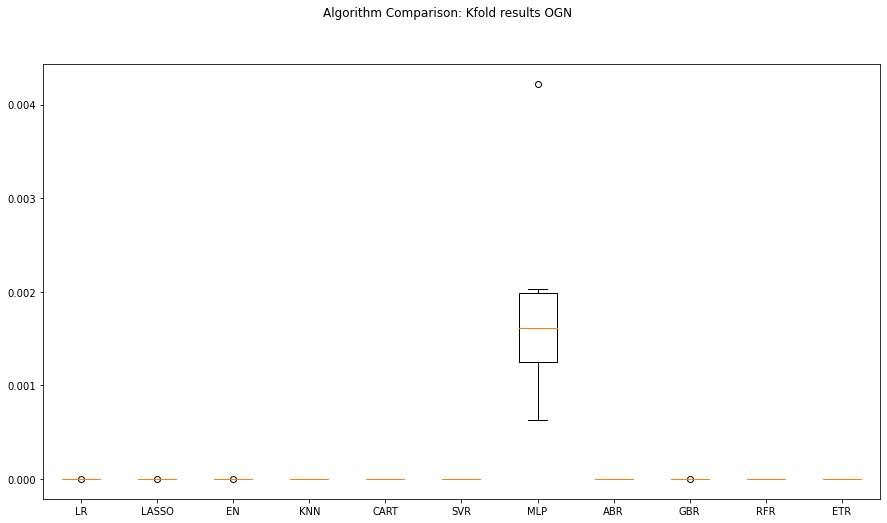

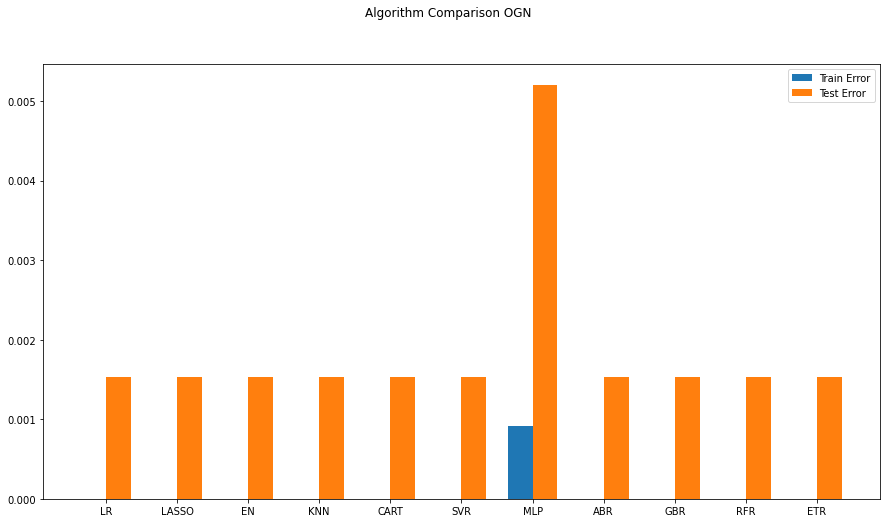

                ABBV      AMGN       AZN      BIIB       BMY      CRXT  \
2016-11-21  0.003579  0.001968  0.003758 -0.000687  0.000751 -0.020242   
2016-11-29  0.019179  0.003087 -0.023313 -0.050084 -0.006543 -0.020242   
2016-12-06  0.000487 -0.006114 -0.026557 -0.039100 -0.005873 -0.020242   
2016-12-13  0.005986  0.022217  0.062951 -0.013068  0.020142 -0.020242   
2016-12-20  0.002739 -0.007781 -0.024855 -0.006248  0.033540 -0.020242   
...              ...       ...       ...       ...       ...       ...   
2020-10-14  0.001975 -0.080881 -0.006372  0.011379  0.009554 -0.020242   
2020-10-21 -0.037647 -0.037208 -0.030930 -0.072119 -0.016029 -0.020242   
2020-10-28 -0.029381 -0.056555 -0.011507 -0.096144 -0.038548 -0.020242   
2020-11-04  0.160467  0.062477  0.076627  0.375658  0.124685 -0.020242   
2020-11-11  0.037897  0.043997  0.052728 -0.376600 -0.031202 -0.020242   

                GILD      GRFS       GSK       HCM  ...       NVO       NVS  \
2016-11-21  0.000289 -0.000553  

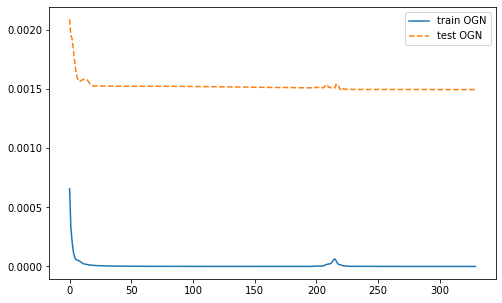

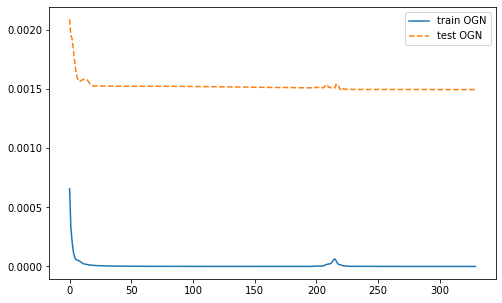

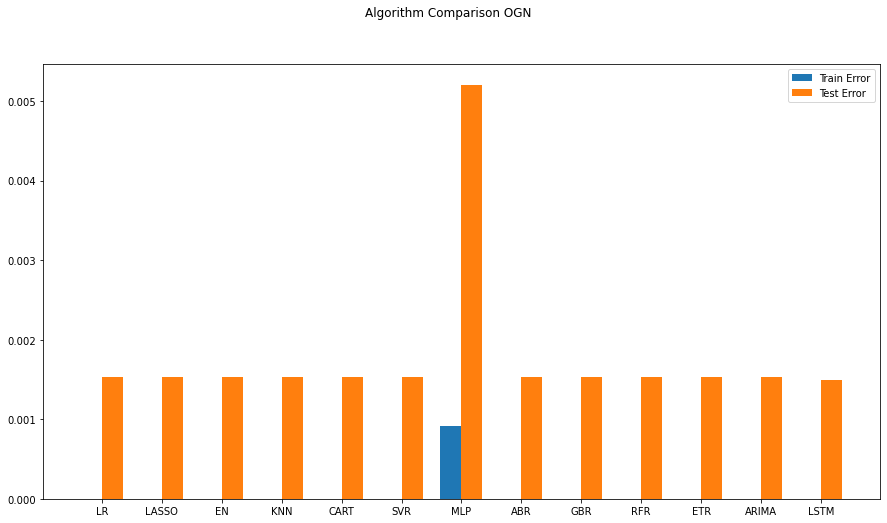

Best ARIMANone MSE=inf


ValueError: The computed initial AR coefficients are not stationary
You should induce stationarity, choose a different model order, or you can
pass your own start_params.

In [71]:
# LSTM Network
def create_LSTMmodel(learn_rate = 0.01, momentum=0): # create model
        model = Sequential()
        model.add(LSTM(50, input_shape=(X_train_LSTM.shape[1],X_train_LSTM.shape[2])))
        model.add(Dense(1))

        #More cells can be added if needed model.add(Dense(1))
        optimizer = SGD(lr=learn_rate, momentum=momentum) 
        model.compile(loss='mse', optimizer='adam')
        return model
    
def evaluate_arima_model(arima_order):
#predicted = list() 
    modelARIMA=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=arima_order) 
    model_fit = modelARIMA.fit()
    error = mean_squared_error(Y_temp, model_fit.fittedvalues)
    return error

# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(p_values, d_values, q_values): 
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q) 
                try:
                    mse = evaluate_arima_model(order) 
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.7f' % (order,mse))
                except: 
                    continue
    print('Best ARIMA%s MSE=%.7f' % (best_cfg, best_score))
    

    
seq_len = 2 #Length of the seq for the LSTM

for i in stk_tickers:
    #X_temp = X_train.filter(regex=i, axis=1)
    X_temp = X_train
    Y_temp = Y_train.filter(regex=i, axis=1)
    #_temp_test = X_test.filter(regex=i, axis=1)
    X_temp_test = X_test
    Y_temp_test = Y_test.filter(regex=i, axis=1)
    
    #temp = X.loc[:,['DEXJPUS', 'DEXUSUK', 'SP500', 'DJIA', 'VIXCLS']]
    #temp2 = X.filter(regex=i, axis=1)
    #X_temp_fulX = pd.concat([temp2, temp], axis=1)
    X_temp_fulX = X
    
    Arima_temp = X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
    Arima_temp_test = X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
    
    names = []
    
    kfold_results = [] 
    test_results = [] 
    train_results = []
    # Model testing
    for name, model in models:
        names.append(name)
        ## k-fold analysis:
        kfold = KFold(n_splits=num_folds)
        #converted mean squared error to positive. The lower the better
        cv_results = -1* cross_val_score(model, X_temp, Y_temp, cv=kfold, scoring=scoring)
        kfold_results.append(cv_results)
        # Full Training period
        res = model.fit(X_temp, Y_temp)
        train_result = mean_squared_error(res.predict(X_temp), Y_temp) 
        train_results.append(train_result)
        # Test results
        test_result = mean_squared_error(res.predict(X_temp_test), Y_temp_test) 
        test_results.append(test_result)
    # Comparition starts by ticker
    for j in range(0,1):
        fig = pyplot.figure()
        fig.suptitle(f'Algorithm Comparison: Kfold results {i}')
        ax = fig.add_subplot(111)
        pyplot.boxplot(kfold_results)
        ax.set_xticklabels(names)
        fig.set_size_inches(15,8)
        pyplot.show()
    # Error testing
    for k in range(0,1):
        fig = pyplot.figure()
        ind = np.arange(len(names)) # the x locations for the groups
        width = 0.35 # the width of the bars
        fig.suptitle(f'Algorithm Comparison {i}')
        ax = fig.add_subplot(111)
        pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
        pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
        fig.set_size_inches(15,8)
        pyplot.legend()
        ax.set_xticks(ind)
        ax.set_xticklabels(names)
        pyplot.show()
        
    # ARIMA and LSTM
    for arimalstm in range(0,1):
        
#         X_train_ARIMA=X_temp.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
#         X_test_ARIMA=X_test.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
        X_train_ARIMA=Arima_temp.loc[:, Arima_temp.columns != i]
        X_test_ARIMA=Arima_temp_test.loc[:, Arima_temp.columns != i]

        tr_len = len(X_train_ARIMA)
        te_len = len(X_test_ARIMA)
        to_len = len(X_temp_fulX)
        
        print(X_train_ARIMA)
        
        X_train_ARIMA.index=pd.DatetimeIndex(X_train_ARIMA.index).to_period('W')
        
        Y_temp.index=pd.DatetimeIndex(Y_temp.index).to_period('W')
        
        modelARIMA=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=[1,0,0])
        model_fit = modelARIMA.fit(trend='nc')
        
        error_Training_ARIMA = mean_squared_error(Y_temp, model_fit.fittedvalues)
        predicted = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
        error_Test_ARIMA = mean_squared_error(Y_temp_test,predicted)
        print(error_Test_ARIMA)
        
        #seq_len = 2 #Length of the seq for the LSTM
        Y_train_LSTM, Y_test_LSTM = np.array(Y_temp)[seq_len-1:], np.array(Y_temp_test) 
        X_train_LSTM = np.zeros((X_temp.shape[0]+1-seq_len, seq_len, X_temp.shape[1]))
        X_test_LSTM = np.zeros((X_temp_test.shape[0], seq_len, X_temp_fulX.shape[1]))
        print(X_test_LSTM.shape)
        print(X_test_LSTM)
        
        for l in range(seq_len):
            X_train_LSTM[:, l, :] = np.array(X_temp)[l:X_temp.shape[0]+l+1-seq_len, :]
            X_test_LSTM[:, l, :] = np.array(X_temp_fulX)[X_temp.shape[0]+l-1:X_temp_fulX.shape[0]+l+1-seq_len, :]
        print(X_test_LSTM.shape)
        print(X_test_LSTM)
        
        LSTMModel = create_LSTMmodel(learn_rate = 0.01, momentum=0)
        LSTMModel_fit = LSTMModel.fit(X_train_LSTM, Y_train_LSTM, validation_data=(X_test_LSTM, Y_test_LSTM),epochs=330, batch_size=72, verbose=0, shuffle=False)
        
        for m in range(seq_len):
            pyplot.plot(LSTMModel_fit.history['loss'], label=f'train {i}', )
            pyplot.plot(LSTMModel_fit.history['val_loss'], '--',label=f'test {i}',)
            pyplot.legend()
            pyplot.show()

        error_Training_LSTM = mean_squared_error(Y_train_LSTM,LSTMModel.predict(X_train_LSTM))
        predicted = LSTMModel.predict(X_test_LSTM)
        error_Test_LSTM = mean_squared_error(Y_temp_test,predicted)

        test_results.append(error_Test_ARIMA)
        test_results.append(error_Test_LSTM)
        train_results.append(error_Training_ARIMA)
        train_results.append(error_Training_LSTM)
        names.append("ARIMA")
        names.append("LSTM")
        
        for n in range(0,1):
            fig = pyplot.figure()
            ind = np.arange(len(names)) # the x locations for the groups
            width = 0.35 # the width of the bars
            fig.suptitle(f'Algorithm Comparison {i}')
            ax = fig.add_subplot(111)
            pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
            pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
            fig.set_size_inches(15,8)
            pyplot.legend()
            ax.set_xticks(ind)
            ax.set_xticklabels(names)
            pyplot.show()

        p_values = [0, 1, 2]
        d_values = range(0, 2)
        q_values = range(0, 2)
        #warnings.filterwarnings("ignore")
        evaluate_models(p_values, d_values, q_values)

        modelARIMA_tuned=ARIMA(endog=Y_temp,exog=X_train_ARIMA,order=[2,0,1])
        model_fit_tuned = modelARIMA_tuned.fit(trend='nc')
        # estimate accuracy on validation set
        predicted_tuned = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
        print(mean_squared_error(Y_temp_test,predicted_tuned))
        
        # plotting the actual data versus predicted data
        for o in range(0,1):
            predicted_tuned.index = Y_temp_test.index
            pyplot.plot(np.exp(Y_temp_test).cumprod(), 'r', label=f'actual {i}',)
            # plotting t, a separately
            pyplot.plot(np.exp(predicted_tuned).cumprod(), 'b--', label=f'predicted {i}')
            pyplot.legend()
            pyplot.rcParams["figure.figsize"] = (8,5)
            pyplot.show()
    

In [89]:
#X_train.loc[:, stk_tickers]
Arima_temp = X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
Arima_temp.loc[:, Arima_temp.columns != 'ABBV']

#X_train.loc[:, stk_tickers + ['DEXJPUS'] + ['DEXUSUK'] + ['SP500'] + ['DJIA'] + ['VIXCLS']]
#X_train

,AMGN,AZN,BIIB,BMY,CRXT,GILD,GRFS,GSK,HCM,HZNP,...,NVS,OGN,PFE,SNY,TSVT,DEXJPUS,DEXUSUK,SP500,DJIA,VIXCLS
2016-11-21,0.001968,0.003758,-0.000687,0.000751,-0.020242,0.000289,-0.000553,0.001402,0.003571,0.006450,...,0.001827,-0.003531,0.002839,0.001751,0.135236,0.000166,-0.000044,0.002655,0.002188,0.001585
2016-11-29,0.003087,-0.023313,-0.050084,-0.006543,-0.020242,-0.001468,0.021189,-0.004172,0.040021,-0.018824,...,-0.016824,-0.003531,0.011026,0.006948,0.135236,0.016089,0.006498,0.000780,0.005124,0.038725
2016-12-06,-0.006114,-0.026557,-0.039100,-0.005873,-0.020242,-0.032581,-0.059077,-0.015271,0.139093,-0.040723,...,0.000000,-0.003531,-0.011342,0.005425,0.135236,0.010584,0.015946,0.003428,0.006785,-0.089976
2016-12-13,0.022217,0.062951,-0.013068,0.020142,-0.020242,0.038598,-0.006162,0.019964,-0.018238,-0.301466,...,0.032247,-0.003531,0.039452,0.006374,0.135236,0.011167,-0.001654,0.026536,0.033679,0.075924
2016-12-20,-0.007781,-0.024855,-0.006248,0.033540,-0.020242,-0.010612,0.072832,-0.003909,-0.025545,0.061608,...,0.010337,-0.003531,0.000609,-0.051654,0.135236,0.022307,-0.026117,-0.000423,0.003180,-0.105186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-14,-0.080881,-0.006372,0.011379,0.009554,-0.020242,0.019072,0.037761,0.016803,-0.030940,-0.002860,...,0.017189,-0.003531,0.010637,0.032594,0.135236,-0.008434,0.008405,0.020041,0.007411,-0.060981
2020-10-21,-0.037208,-0.030930,-0.072119,-0.016030,-0.020242,-0.061826,0.036387,-0.051279,-0.068531,-0.078187,...,-0.038356,-0.003531,0.005951,-0.039283,0.135236,-0.004770,0.009172,-0.015341,-0.010690,0.081789
2020-10-28,-0.056555,-0.011507,-0.096144,-0.038548,-0.020242,-0.025058,-0.093578,-0.040409,-0.023028,0.039469,...,-0.071168,-0.003531,-0.044954,-0.063603,0.135236,-0.002393,-0.011171,-0.049075,-0.061808,0.340702
2020-11-04,0.062477,0.076627,0.375658,0.124684,-0.020242,0.019395,0.026885,0.074339,0.077286,0.046285,...,0.066642,-0.003531,0.051674,0.092074,0.135236,0.000575,0.001845,0.051366,0.048852,-0.309095


# DELETE FROM HERE

In [ ]:
# When there are exogenus variables it is said that is an ARIMAX
modelARIMA=ARIMA(endog=Y_train,exog=X_train_ARIMA,order=[1,0,0])
model_fit = modelARIMA.fit()

In [ ]:
error_Training_ARIMA = mean_squared_error(Y_train, model_fit.fittedvalues)

In [ ]:

predicted = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
error_Test_ARIMA = mean_squared_error(Y_test,predicted)
error_Test_ARIMA

In [ ]:
# Adding a RNN LSTM
seq_len = 2 #Length of the seq for the LSTM
Y_train_LSTM, Y_test_LSTM = np.array(Y_train)[seq_len-1:], np.array(Y_test) 
X_train_LSTM = np.zeros((X_train.shape[0]+1-seq_len, seq_len, X_train.shape[1]))
X_test_LSTM = np.zeros((X_test.shape[0], seq_len, X.shape[1]))

In [ ]:
X_test_LSTM.shape

In [ ]:
X_test_LSTM

In [ ]:
for i in range(seq_len):
        X_train_LSTM[:, i, :] = np.array(X_train)[i:X_train.shape[0]+i+1-seq_len, :]
        X_test_LSTM[:, i, :] = np.array(X)[X_train.shape[0]+i-1:X.shape[0]+i+1-seq_len, :]

In [ ]:
X_test_LSTM.shape

In [ ]:

X_test_LSTM

In [ ]:
# LSTM Network
def create_LSTMmodel(learn_rate = 0.01, momentum=0): # create model
        model = Sequential()
        model.add(LSTM(50, input_shape=(X_train_LSTM.shape[1],X_train_LSTM.shape[2])))
        model.add(Dense(1))

        #More cells can be added if needed model.add(Dense(1))
        optimizer = SGD(lr=learn_rate, momentum=momentum) 
        model.compile(loss='mse', optimizer='adam')
        return model
LSTMModel = create_LSTMmodel(learn_rate = 0.01, momentum=0)
LSTMModel_fit = LSTMModel.fit(X_train_LSTM, Y_train_LSTM, validation_data=(X_test_LSTM, Y_test_LSTM),epochs=330, batch_size=72, verbose=0, shuffle=False)

In [ ]:
pyplot.plot(LSTMModel_fit.history['loss'], label='train', )
pyplot.plot(LSTMModel_fit.history['val_loss'], '--',label='test',)
pyplot.legend()
pyplot.show()

In [ ]:
error_Training_LSTM = mean_squared_error(Y_train_LSTM,LSTMModel.predict(X_train_LSTM))

In [ ]:
predicted = LSTMModel.predict(X_test_LSTM)
error_Test_LSTM = mean_squared_error(Y_test,predicted)

In [ ]:
test_results.append(error_Test_ARIMA)
test_results.append(error_Test_LSTM)
train_results.append(error_Training_ARIMA)
train_results.append(error_Training_LSTM)
names.append("ARIMA")
names.append("LSTM")

In [ ]:
# compare algorithms
fig = pyplot.figure()
ind = np.arange(len(names)) # the x locations for the groups
width = 0.35 # the width of the bars
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
pyplot.bar(ind - width/2, train_results,  width=width, label='Train Error')
pyplot.bar(ind + width/2, test_results, width=width, label='Test Error')
fig.set_size_inches(15,8)
pyplot.legend()
ax.set_xticks(ind)
ax.set_xticklabels(names)
pyplot.show()

In [ ]:
def evaluate_arima_model(arima_order):
#predicted = list() 
    modelARIMA=ARIMA(endog=Y_train,exog=X_train_ARIMA,order=arima_order) 
    model_fit = modelARIMA.fit()
    error = mean_squared_error(Y_train, model_fit.fittedvalues)
    return error

In [ ]:
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(p_values, d_values, q_values): 
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q) 
                try:
                    mse = evaluate_arima_model(order) 
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.7f' % (order,mse))
                except: 
                    continue
    print('Best ARIMA%s MSE=%.7f' % (best_cfg, best_score))

In [ ]:
# evaluate parameters
p_values = [0, 1, 2]
d_values = range(0, 2)
q_values = range(0, 2)
#warnings.filterwarnings("ignore")
evaluate_models(p_values, d_values, q_values)

In [ ]:
# ARIMA(2, 0, 1) MSE=0.0009632

In [ ]:
modelARIMA_tuned=ARIMA(endog=Y_train,exog=X_train_ARIMA,order=[2,0,1])
model_fit_tuned = modelARIMA_tuned.fit()
# estimate accuracy on validation set
predicted_tuned = model_fit.predict(start = tr_len -1 ,end = to_len -1, exog = X_test_ARIMA)[1:]
print(mean_squared_error(Y_test,predicted_tuned))

In [ ]:
# plotting the actual data versus predicted data
predicted_tuned.index = Y_test.index
pyplot.plot(np.exp(Y_test).cumprod(), 'r', label='actual',)
# plotting t, a separately
pyplot.plot(np.exp(predicted_tuned).cumprod(), 'b--', label='predicted')
pyplot.legend()
pyplot.rcParams["figure.figsize"] = (8,5)
pyplot.show()